# <font color=#009BFA>P5 - Segmentez des clients d'un site e-commerce</font>

 # <span style='background :#6EFA00'>P5_02 - Clustering - Apprentissage non supervisé</span>

**Apprentissage non supervisé** :
Il consiste à inférer des connaissances sur les données :<br>
    - Sur la seule base des échantillons d'apprentissage,<br>
    - Pas de cible, recherche de structures naturelles dans les données.
    
**Différentes tâches sont associées à l'apprentissage non
supervisé** :
- **Clustering** (**segmentation**, **regroupement**) : construire des classes automatiquement en fonction des exemples disponibles. L'apprentissage non supervisé est très souvent synonyme de clustering.
- **Règles d'association** : analyser les relations entre les variables ou détecter des associations.
- **Réduction de dimensions**.

## <font color="#009BFA">Sommaire</font>
1. [Introduction](#section_1)<br><br>

2. [Préparation des données](#section_2)<br>
<br>
3. [Modélisation](#section_3)<br>
    3.1. [K-Means](#section_3_1)<br>
    . . . 3.1.1. [Choix des variables quantitatives](#section_3_1_1)<br>
    . . . 3.1.2. [ACP pour tous les variables quantitatives](#section_3_1_2)<br>
    . . . 3.1.3. [Segmentation KMeans: vraiables quantitatives sans ACP](#section_3_1_3)<br>
    . . . 3.1.4. [Segmentation KMeans : variables quantitatives + qualitatives](#section_3_1_4)<br>
    . . . 3.1.5. [Segmentation KMeans + ACP](#section_3_1_5)<br>

    3.2. [K-Prototype](#section_3_2)<br>
      
    3.3. [Clustering hiérarchique](#section_3_3)<br>
    
    3.4. [DBSCAN](#section_3_4)<br>
<br>    
4. [Comparaison des performances](#section_4)<br>
<br>  
5. [Stabilité d'initialisation de la partition](#section_5)<br>

In [1]:
# Chargement des librairies
from datetime import datetime

# import datetime as dt
import numpy as np
import pandas as pd
import sys
import time
import pickle

# Librairies personnelles
import utilities_data
import utilities_visu
import utilities_acp
import utilities_segmentation

# Data visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.graph_objs as go
from pandas.plotting import parallel_coordinates

# Pré processing
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline

# Réduction dimension
from sklearn.manifold import TSNE
from umap import UMAP
import umap.umap_ as umap

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import linkage

# import hdbscan
from kmodes.kprototypes import KPrototypes

# Clustering Visualisation
from yellowbrick.cluster import (
    KElbowVisualizer,
    SilhouetteVisualizer,
    InterclusterDistance,
)

# Clustering Metrics
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score

# Classification modélisation
from sklearn.model_selection import cross_val_score

# Warnings
import warnings

warnings.filterwarnings("ignore")

mpl.rcParams["figure.figsize"] = (10, 8)

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2

# Valide code pep8
%load_ext nb_black

# constantes
# Nombre aléatoire pour la reproductibilité des résultats
SEED = 42

now = datetime.now().isoformat()
print("Lancé le           : " + now)

Lancé le           : 2022-03-18T22:03:58.500080


<IPython.core.display.Javascript object>

# <span style='color:blue' id="section_1">1. Introduction</span>

**Mission**<br>

Fournir aux équipes Marketing de l'entreprise Olist (site de e-commerce) une **segmentation des clients** utilisables dans leurs campagnes de communication.

**Objectifs**<br>

- **Comprendre** les différents **types d'utilisateurs** (comportements, données personnelles)
- **Fournir** une **description actionnable** de la segmentation avec une logique sous-jacente pour une optimisation optimale
- **Proposer** un **contrat de maintenance** basé sur une analyse de la stabilité des segments au cours du temps.

**Sources**<br>

- [Jeu de données](https://www.kaggle.com/olistbr/brazilian-ecommerce)

# <font style='color:blue' id="section_2">2. Préparation des données</font>

In [2]:
# Chargement de la table des clients OLIST
df_clients = pd.read_csv("OLIST_data_client_clean_2.csv")
df_clients.set_index("customer_unique_id", inplace=True)
# Copie
data_clients = df_clients.copy()

<IPython.core.display.Javascript object>

In [3]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_clients.shape
print(f"Le jeu de données contient {nRow} lignes et {nVar} variables.")

Le jeu de données contient 91223 lignes et 22 variables.


<IPython.core.display.Javascript object>

In [4]:
# Contenu des 3 premières lignes
data_clients.head(3)

,geolocation_lat,geolocation_lng,distance_de_Olist_KM,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,date_premier_achat,nbr_jours_premier_achat,date_dernier_achat,...,dernier_achat_jour,dernier_achat_heure,dernier_achat_jour_prefere,nbr_commandes,nbr_articles_mean,panier_moyen,moyen_paiement_prefere,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-23.340235,-46.830140,340.833475,112,1,141.90,5.0,2018-05-10 10:56:27,112,2018-05-10 10:56:27,...,10,10,3,1,1.0,129.9,credit_card,8.0,12.00,home
0000b849f77a49e4a4ce2b2a4ca5be3f,-23.559115,-46.787626,327.875552,115,1,27.19,4.0,2018-05-07 11:11:27,115,2018-05-07 11:11:27,...,7,11,0,1,1.0,18.9,credit_card,1.0,8.29,health
0000f46a3911fa3c0805444483337064,-27.542880,-48.633426,243.870495,537,1,86.22,3.0,2017-03-10 21:05:03,537,2017-03-10 21:05:03,...,10,21,4,1,1.0,69.0,credit_card,8.0,17.22,pro


<IPython.core.display.Javascript object>

In [5]:
data_clients.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 91223 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   geolocation_lat             91223 non-null  float64
 1   geolocation_lng             91223 non-null  float64
 2   distance_de_Olist_KM        91223 non-null  float64
 3   rfm_recence                 91223 non-null  int64  
 4   rfm_frequence               91223 non-null  int64  
 5   rfm_montant                 91223 non-null  float64
 6   note_avis_mean              91223 non-null  float64
 7   date_premier_achat          91223 non-null  object 
 8   nbr_jours_premier_achat     91223 non-null  int64  
 9   date_dernier_achat          91223 non-null  object 
 10  dernier_achat_annee         91223 non-null  int64  
 11  dernier_achat_mois          91223 non-null  int64  
 12  dernier_achat_jour          91223 n

<IPython.core.display.Javascript object>

In [6]:
data_clients["date_premier_achat"] = data_clients["date_premier_achat"].astype(
    "datetime64"
)
data_clients["date_dernier_achat"] = data_clients["date_dernier_achat"].astype(
    "datetime64"
)

<IPython.core.display.Javascript object>

# <font style='color:blue' id="section_3">3. Modélisation</font>

### <font color=#017579>**Clustering**</font>
***
Les algorithmes de clustering permettent de partitionner les données en sous-groupes, ou clusters, de manière non supervisée. Intuitivement, ces sous-groupes regroupent entre elles des observations similaires.<br>

<font color=#004D89>**Comprendre les données :**</font> Les algorithmes de clustering sont le plus souvent utilisés pour une analyse exploratoire des données. Il s'agit par exemple d'identifier :
    - des clients qui ont des comportements similaires (segmentation de marché);
    - des utilisateurs qui ont des usages similaires d'un outil;
    - des communautés dans des réseaux sociaux;
    - des motifs récurrents dans des transactions financières.<br>
    
<font color=#004D89>**Visualiser les données :**</font> En plus d'un algorithme de réduction de dimension qui permet de visualiser les données en deux ou trois dimensions, on peut utiliser un algorithme de clustering pour former des sous-groupes de ces points, ou clusters. On peut ainsi représenter visuellement les relations entre les points. Par ailleurs, on peut aussi, au lieu de représenter l'intégralité des données, afficher uniquement un point représentatif par cluster.<br>

<font color=#004D89>**Inférer des propriétés des données :**</font> Cette utilisation des algorithmes de clustering est particulièrement utile dans les cas où il est coûteux d'étiqueter les donnée. On peut utiliser des algorithmes de clustering pour étendre à tous les points du même cluster une propriété de l'un de ces points.<br>

**Les Méthodes de clustering exploitées ici** :<br>

- <font color=#004D89>**Méthodes de partitionnement**</font> : construire une partition en classes d'un ensemble d'objets ou d'individus hiérarchiques. Création d'une partition initiale de K classes, puis itération d'un processus qui optimise le partitionnement en déplaçant les objets d'une classe à l'autre.
    - **méthodes K-moyennes** : une classe est représentée par son centre de gravité (ex : ***K-Means***).<br>

- <font color=#004D89 >**Méthodes hiérarchiques**</font> : les clusters sont organisés sous la forme d'une structure d'arbre (le nombre de clusters n'est pas défini) en utilisant les distances entre les classes.
    - **approche hiérarchique ascendante RHA (ou agglomératif)** : on commence avec un objet dans chaque classe, puis on fusionne successivement les 2 classes les plus proches et on s'arrête quand il n'y a plus qu'une classe contenant tous les exemples (recherche : ***BIRCH*** (1996) : basée sur la représentation d'une classe par ses traits caractéristiques et ***CHAMELEON*** (1999) : basée sur la théorie des graphes et une représentation plus riche des données).
    - **approche descendante (ou par divisif)** : tous les objets sont  initialement dans la même classe, puis division de la classe en sous classes jusqu'à ce qu'il y ait suffisamment de niveaux ou que les classes ne contiennent plus qu'un seul exemple.
***
- <font color=#004D89 >**Méthodes de modélisation**</font> :
    - **à base de densité** : utilisation de la densité à la place de la distance. Les clusters sont des régions de l'espace qui ont une grande densité de points (ex : ***DBSCAN*** (1996), ***HDBSCAN***, ***OPTICS*** (1999), ***DENCLUE** (1998), ***CLIQUE*** (1998)).
        - Un point est dense si le nombre de ses voisins dépasse un certain seuil
        - Un point est voisin d'un autre point s'il est à une distance inférieure à une valeur fixée.

> # <font style='color:#DD5E00' id="section_3_1">3.1. K-means</font>

Pour utiliser le modèle K-means, nous devons savoir combien de clusters se trouvent dans l'ensemble de données. Plusieurs métriques sont utiles pour obtenir le nombre de clusters optimal :<br>
***Forme et homogénéité des clusters*** :<br>
    - **méthode du coude** : Il fonctionne en traçant les valeurs croissantes de K par rapport à l'erreur totale obtenue lors de l'utilisation de ce K.<br>
    - **coefficient de silhouette** : une mesure de qualité d'une partition d'un ensemble de données. Pour chaque point, son coefficient de silhouette est la différence entre la distance moyenne avec les points du même groupe que lui (cohésion, homogénéité) et la distance moyenne avec les points des autres groupes voisins (séparation). Si cette différence est négative, le point est en moyenne plus proche du groupe voisin que du sien : il est donc mal classé. A l'inverse, si cette différence est positive, le point est en moyenne plus proche de son groupe que du groupe voisin : il est donc bien classé. Le coefficient de silhouette proprement dit est la moyenne du coefficient de silhouette pour tous les points (-1 pire assignation du cluster, 1 : assignation satisfaisante).<br>
    - **indice de Davies Bouldin** : Il s'agit d'un schéma d'évaluation interne, où la validation de la qualité du clustering est faite en utilisant des quantités et des caractéristiques inhérentes au jeu de données (dispersion). Cette méthode présente l'inconvénient qu'une bonne valeur rapportée par cette méthode n'implique pas la meilleure recherche d'information. C'est la moyenne du rapport maximal entre la distance d'un point au centre de son groupe et la distance entre deux centres de groupes. L'indice de Davies-Bouldin varie entre 0 (meilleure classification) et +infini (pire classification).<br>
***Stabilité des clusters*** :<br>
    - **Indice de Rand ajusté** : L'indice Rand calcule une mesure de similarité entre deux clusters en considérant toutes les paires d'échantillons et en comptant les paires qui sont assignées dans les mêmes ou différents clusters dans les clusters prédits et réels. L'indice de Rand ajusté est donc assuré d'avoir une valeur proche de 0,0 pour un étiquetage aléatoire indépendamment du nombre de grappes et d'échantillons et exactement 1,0 lorsque les grappes sont identiques (jusqu'à une permutation).

In [7]:
# fraction pour l'échantillonnage
frac = 1
fraction_cah = 0.5

<IPython.core.display.Javascript object>

In [8]:
# Copie du jeu de données
data_sample = data_clients.sample(frac=frac, random_state=SEED)

<IPython.core.display.Javascript object>

In [9]:
data = data_sample.copy()

<IPython.core.display.Javascript object>

In [10]:
%store data

Stored 'data' (DataFrame)


<IPython.core.display.Javascript object>

> ##  <font color=green id="section_3_1_1">3.1.1. Choix des variables quantitatives</font>

In [11]:
# Nombre de variable catégorielles
data.dtypes.value_counts()

float64           9
int64             9
object            2
datetime64[ns]    2
dtype: int64

<IPython.core.display.Javascript object>

**Sélection des variables numériques**

In [12]:
# Sélection des variables numériques
num_cols = data.select_dtypes(include=[np.number]).columns.to_list()

<IPython.core.display.Javascript object>

Nous avons vu que les variables `geolocation_lat` et `geolocation_lng` sont corrélées à `distance_de_Olist_KM`. Et que la variable `nbr_jours_premies_achat` est corrélées au `rfm_recence`.<br>
Nous allons choisir `distance_de_Olist_KM` et `rfm_recence`.

In [13]:
num_cols

['geolocation_lat',
 'geolocation_lng',
 'distance_de_Olist_KM',
 'rfm_recence',
 'rfm_frequence',
 'rfm_montant',
 'note_avis_mean',
 'nbr_jours_premier_achat',
 'dernier_achat_annee',
 'dernier_achat_mois',
 'dernier_achat_jour',
 'dernier_achat_heure',
 'dernier_achat_jour_prefere',
 'nbr_commandes',
 'nbr_articles_mean',
 'panier_moyen',
 'echeance_paiement_mean',
 'frais_port_mean']

<IPython.core.display.Javascript object>

In [14]:
# exclure les variables de geolocation et le nombre jours depuis le premier achat
cols_to_remove = ["geolocation_lat", "geolocation_lng", "nbr_jours_premier_achat"]

<IPython.core.display.Javascript object>

In [15]:
num_cols = [col for col in num_cols if col not in cols_to_remove]

<IPython.core.display.Javascript object>

In [16]:
num_cols

['distance_de_Olist_KM',
 'rfm_recence',
 'rfm_frequence',
 'rfm_montant',
 'note_avis_mean',
 'dernier_achat_annee',
 'dernier_achat_mois',
 'dernier_achat_jour',
 'dernier_achat_heure',
 'dernier_achat_jour_prefere',
 'nbr_commandes',
 'nbr_articles_mean',
 'panier_moyen',
 'echeance_paiement_mean',
 'frais_port_mean']

<IPython.core.display.Javascript object>

In [17]:
data_num = data[num_cols]
data_num.columns

Index(['distance_de_Olist_KM', 'rfm_recence', 'rfm_frequence', 'rfm_montant',
       'note_avis_mean', 'dernier_achat_annee', 'dernier_achat_mois',
       'dernier_achat_jour', 'dernier_achat_heure',
       'dernier_achat_jour_prefere', 'nbr_commandes', 'nbr_articles_mean',
       'panier_moyen', 'echeance_paiement_mean', 'frais_port_mean'],
      dtype='object')

<IPython.core.display.Javascript object>

> Nous avons 2 colonnes de type **object** c'est à dire du <font style='background :yellow' > Texte ou valeurs mixtes numériques et non numériques </font>. Regardons maintenant le nombre de valeurs distinctes pour chacune de ces variables catégorielles.

In [18]:
data.select_dtypes("object").apply(pd.Series.nunique, axis=0)

moyen_paiement_prefere    4
cat_produit_prefere       7
dtype: int64

<IPython.core.display.Javascript object>

In [19]:
# Standardisation MinMaxScaler - variable transformées en log
# -----------------------------------------------------------------------
# Préparation des données
X_num = data_num.values
features_num = data_num.columns

# Standardisation avec SMinMaxScaler (centre, réduit et rend plus la
# distribution plus normale)
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_num)

# Dataframe
data_scaled = pd.DataFrame(X_scaled, index=data_num.index, columns=features_num)

<IPython.core.display.Javascript object>

In [20]:
# %store data_scaled

<IPython.core.display.Javascript object>

In [21]:
data_scaled.head()

,distance_de_Olist_KM,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,dernier_achat_annee,dernier_achat_mois,dernier_achat_jour,dernier_achat_heure,dernier_achat_jour_prefere,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
customer_unique_id,,,,,,,,,,,,,,,
00bd903b65b4c9a1c822887d0b012592,0.078836,0.148415,0.000000,0.001025,1.0,1.0,0.363636,0.566667,0.000000,0.666667,0.000000,0.00,0.015020,0.041667,0.048037
9005fcc94dfc5549a00761abe430be1e,0.113163,0.213256,0.013514,0.002156,1.0,1.0,0.272727,0.066667,0.000000,0.166667,0.000533,0.05,0.006556,0.041667,0.039836
742911bd5109eccceb784f65b7175128,0.041980,0.520173,0.000000,0.008227,1.0,0.5,0.727273,0.033333,0.434783,0.833333,0.000000,0.00,0.131590,0.416667,0.053310
e3516dfa2db85b7f75ccff1bda80a011,0.039401,0.025937,0.000000,0.000355,1.0,1.0,0.636364,0.333333,0.608696,0.833333,0.000000,0.00,0.005799,0.083333,0.020601
a6ac63c6cecf4e5122bcedaa54c2b2de,0.065342,0.044669,0.000000,0.000502,0.5,1.0,0.545455,0.900000,0.652174,0.833333,0.000000,0.00,0.006556,0.041667,0.047623


<IPython.core.display.Javascript object>

In [22]:
X = data_scaled.values

<IPython.core.display.Javascript object>

In [23]:
X.shape

(91223, 15)

<IPython.core.display.Javascript object>

> ##  <font color=green id="section_3_1_2">3.1.2. ACP pour tous les variables quantitatives</font>

In [24]:
cols_acp = data.select_dtypes(include=[np.number]).columns.to_list()

<IPython.core.display.Javascript object>

In [25]:
data_acp = data[cols_acp]

<IPython.core.display.Javascript object>

In [26]:
# Standardisation MinMaxScaler - variable transformées en log
# -----------------------------------------------------------------------
# Préparation des données
X_acp = data_acp.values
features_acp = data_acp.columns

# Standardisation avec SMinMaxScaler (centre, réduit et rend plus la
# distribution plus normale)
scaler = MinMaxScaler()
X_scaled_acp = scaler.fit_transform(X_acp)

# Dataframe
data_acp = pd.DataFrame(X_scaled_acp, index=data_acp.index, columns=features_acp)

<IPython.core.display.Javascript object>

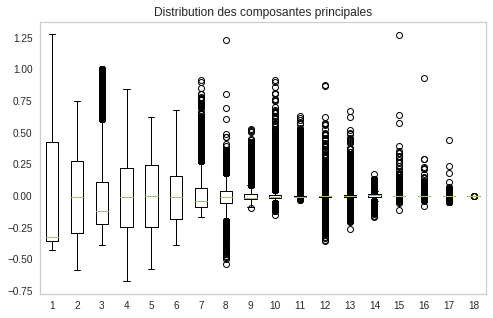

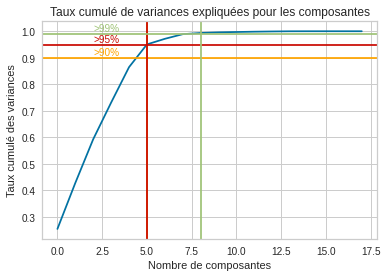

Nombre de composantes expliquant 90% de la variance : 5
Nombre de composantes expliquant 95% de la variance : 5
Nombre de composantes expliquant 99% de la variance : 8


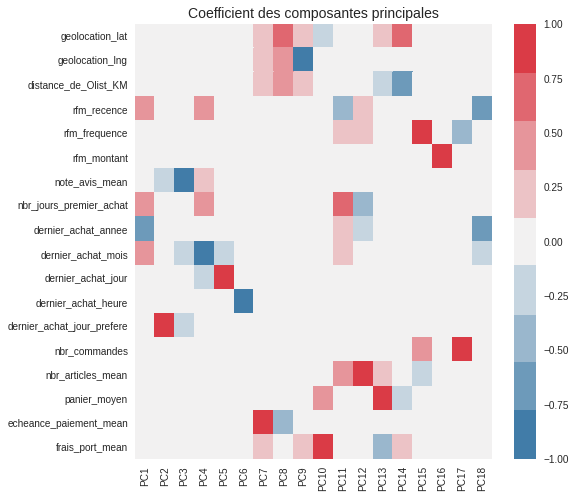

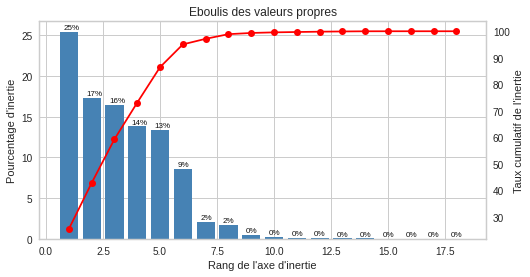

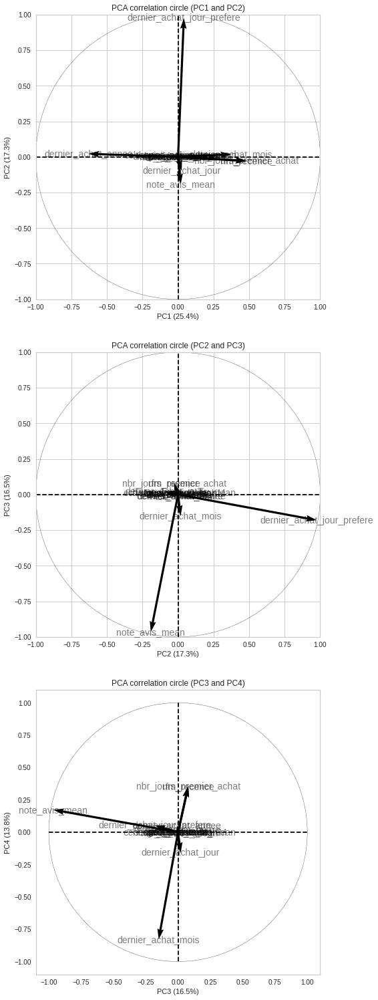

<IPython.core.display.Javascript object>

In [27]:
# Analyse en composante principale
liste_tuples_comp = [(0, 1), (1, 2), (2, 3)]
utilities_acp.creer_analyse_composantes_principales(data_acp, liste_tuples_comp)

- Il faut conserver les **5 variables** pour **expliquer plus de 90% de la variance**.
- La première dimension représente les commandes récentes, clients fidèles.
- La seconde dimension représente le jour de la semaine de la date du dernier achat.
- La troisième dimension est inversement proportionnelle à la note donnée par les clients : clients mécontents.
- La quatrième dimension représente les nouveaux clients.

In [28]:
from sklearn.decomposition import PCA

<IPython.core.display.Javascript object>

In [29]:
# ACP avec 5 composantes
n_comp = 6
pca = PCA(n_components=n_comp, random_state=SEED)
pca.fit(X_scaled_acp)
X_projected_acp = pca.transform(X_scaled_acp)

<IPython.core.display.Javascript object>

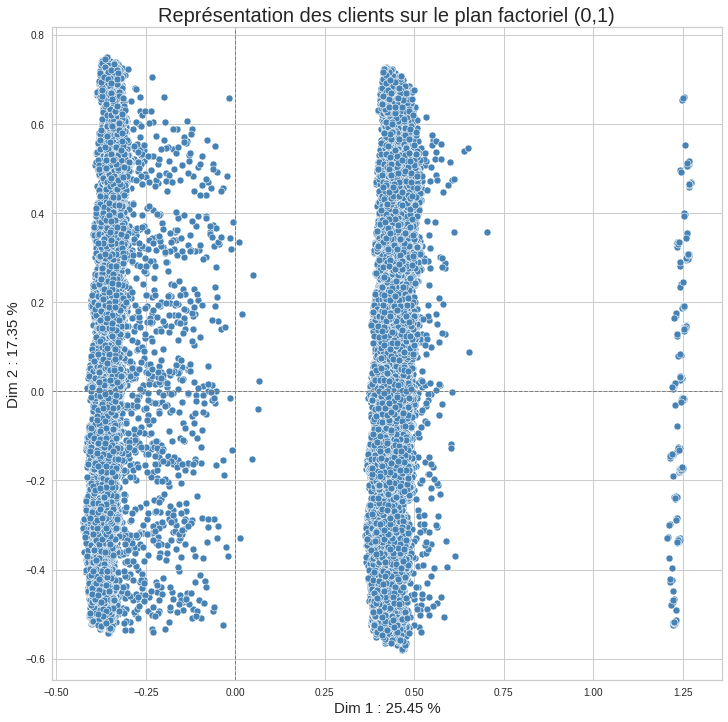

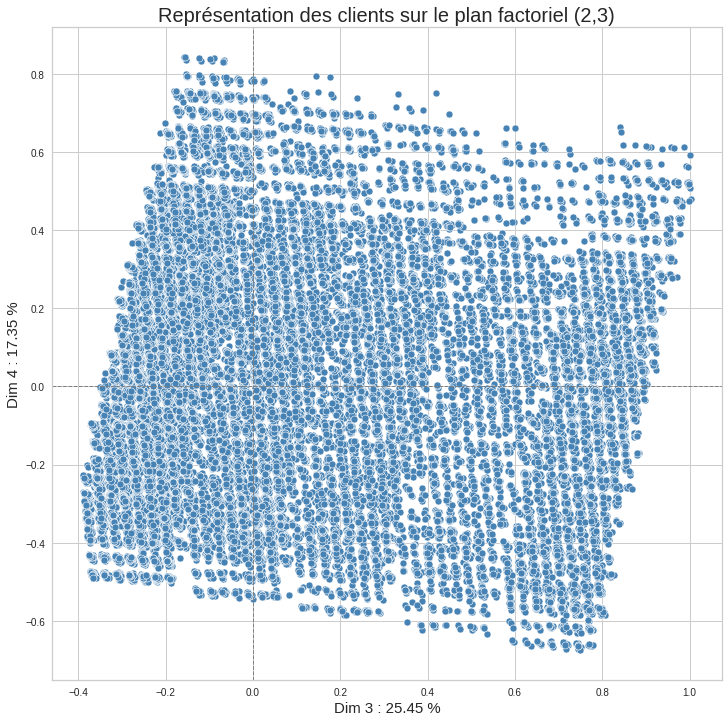

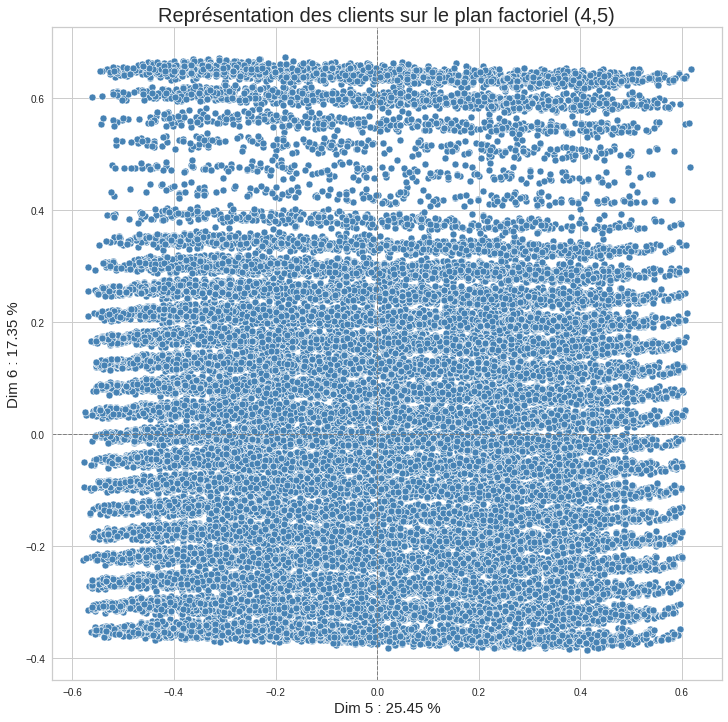

<IPython.core.display.Javascript object>

In [30]:
liste_plans_fact = [(0, 1), (2, 3), (4, 5)]
utilities_acp.projeter_plans_factoriels(X_projected_acp, pca, liste_plans_fact)

> ###  <font color=#0088B4>Synthèse</font>
- L'analyse en composante principale avec les données quantitatives, donne des projections plus dispersées. Elle sera utilisée comme cas particulier dans le cas du modèle K-means. 

> ##  <font color=green id="section_3_1_3">3.1.3. Segmentation KMeans: vraiables quantitatives sans ACP</font>

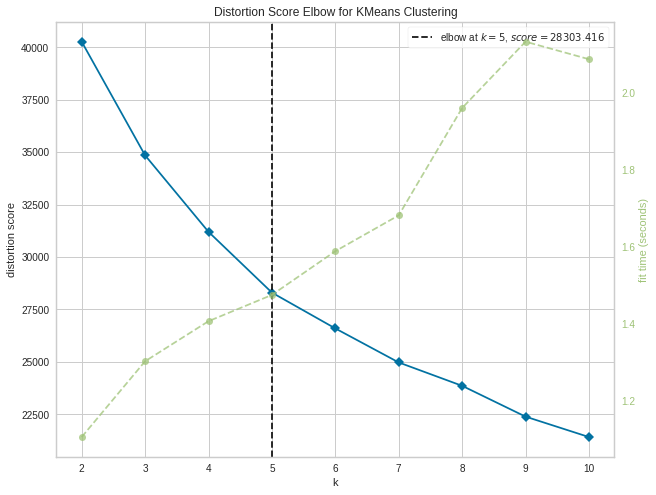

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

<IPython.core.display.Javascript object>

In [31]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Elbow method
kmeans_visualizer = KElbowVisualizer(KMeans(), K=(4, 12))
kmeans_visualizer.fit(X)
kmeans_visualizer.show()

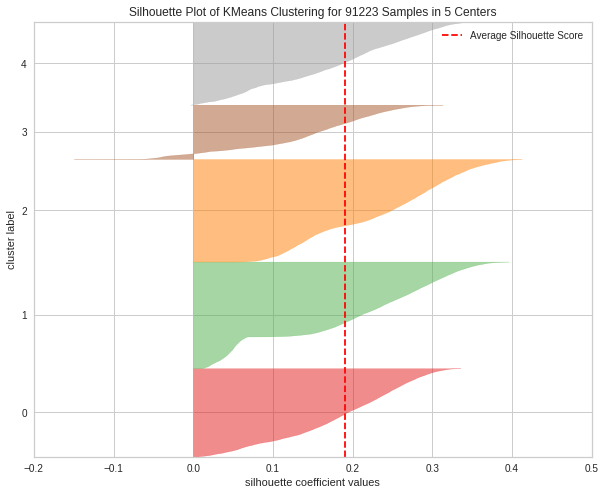

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 91223 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [32]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Best K in Elbow
best_K = kmeans_visualizer.elbow_value_

# Silhouette Visualizer
silhouette_visualizer = SilhouetteVisualizer(
    KMeans(n_clusters=best_K, init="k-means++", random_state=SEED)
)
silhouette_visualizer.fit(X)
silhouette_visualizer.show()

Le score de chaque échantillon est calculé en faisant la moyenne du coefficient de silhouette (différence entre la distance moyenne intra-cluster et la distance moyenne du cluster le plus proche pour chaque échantillon), normalisée par la valeur maximale. Cela nous donne un score entre -1 et 1, qui nous permet de déterminer si la séparation est efficace ou si les points sont assignés au mauvais cluster.

Ici, les clusters semblent relativement bien répartis et les séparations sont claires avec cependant quelques erreurs sur l'un des clusters.

A présent, nous allons tester d'autres types de métriques pour trouver le meilleur K :

- Silouhette : rapport moyen entre la distance intra-cluster et la distance du cluster le plus proche,
- Calinski Harabasz : rapport entre la dispersion des grappes dans et entre les groupes.

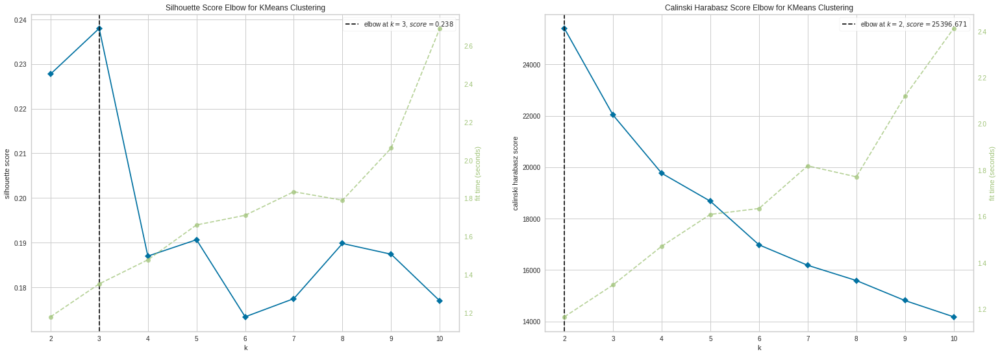

<IPython.core.display.Javascript object>

In [33]:
# Elbow method with differents metrics
metrics = ["silhouette", "calinski_harabasz"]
i = 0

fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(26, 9))
for m in metrics:
    kmeans_visualizer = KElbowVisualizer(
        KMeans(init="k-means++", random_state=SEED), K=(2, 10), metric=m, ax=axes[i]
    )
    kmeans_visualizer.fit(X)
    kmeans_visualizer.finalize()
    i += 1

plt.show()

In [34]:
# Davies Bouldin score for K means
def get_kmeans_score(data, center):
    """
    returns the kmeans score regarding Davies Bouldin for points to centers
    INPUT:
        data - the dataset you want to fit kmeans to
        center - the number of centers you want (the k value)
    OUTPUT:
        score - the Davies Bouldin score for the kmeans model fit to the data
    """
    # instantiate kmeans
    kmeans = KMeans(n_clusters=center, init="k-means++", random_state=SEED)
    # Then fit the model to your data using the fit method
    model = kmeans.fit_predict(data)

    # Calculate Davies Bouldin score
    score = davies_bouldin_score(data, model)

    return score

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Davies Bouldin score vs. K')

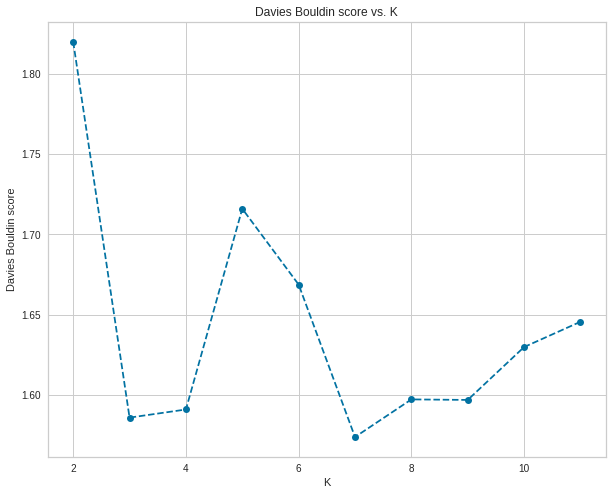

<IPython.core.display.Javascript object>

In [35]:
scores = []
centers = list(range(2, 12))
for center in centers:
    scores.append(get_kmeans_score(X, center))

plt.plot(centers, scores, linestyle="--", marker="o", color="b")
plt.xlabel("K")
plt.ylabel("Davies Bouldin score")
plt.title("Davies Bouldin score vs. K")

Score de Silhouette pour le cluster 4 est: 0.18693845068755116
Score de Silhouette pour le cluster 5 est: 0.19064068777024734
Score de Silhouette pour le cluster 6 est: 0.1904981748857356
Score de Silhouette pour le cluster 7 est: 0.17608757151749824


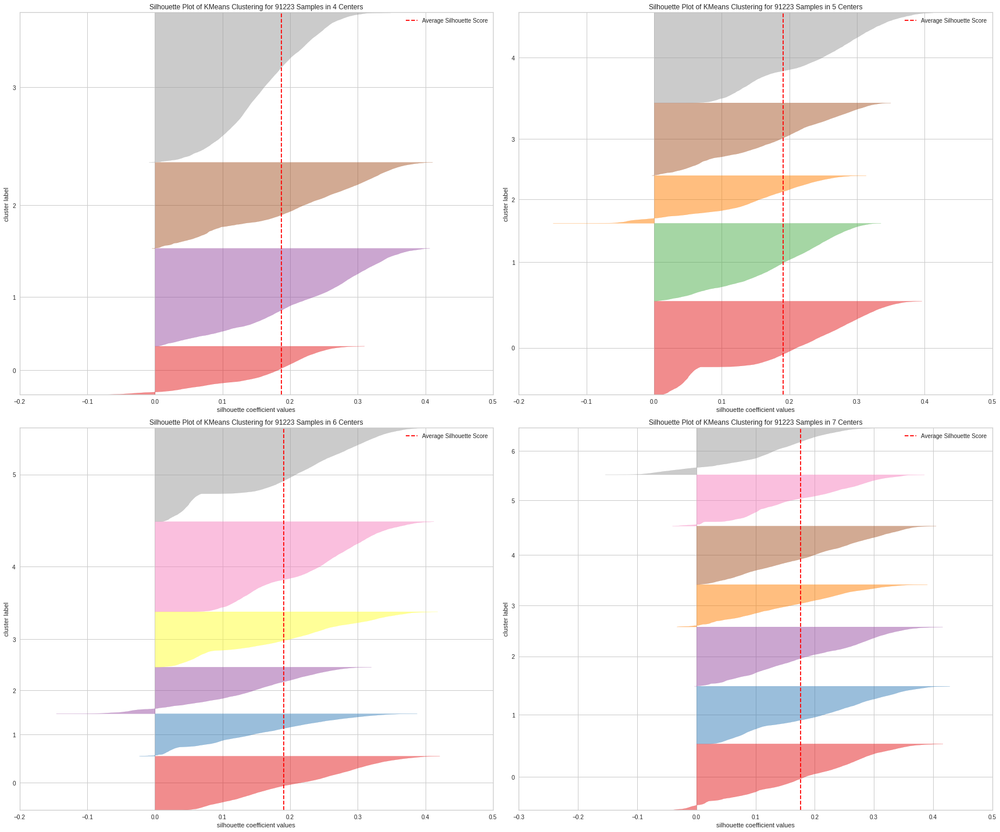

<IPython.core.display.Javascript object>

In [36]:
# Best K in Elbow

K_clusters = [4, 5, 6, 7]


fig, axes = plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(24, 20))
for k, ax in zip(K_clusters, axes.flat):
    silhouette_visualizer = SilhouetteVisualizer(KMeans(k), ax=ax)
    silhouette_visualizer.fit(X_scaled)
    silhouette_visualizer.finalize()
    print(
        "Score de Silhouette pour le cluster {0} est: {1}".format(
            k, silhouette_visualizer.silhouette_score_
        )
    )
fig.tight_layout()
plt.show()

<font color=#015F63 >**Pour chacun des nombres de clusters présentés, la ligne pointillée verticale indique le score de silhouette obtenu. Lorsque la plupart des observations à l'intérieur d'un cluster ont un coefficient inférieur à ce score (c'est-à-dire lorsque la plupart des observations n'atteingent pas la ligne poitillée et restent à sa gauche), alors cette partition n'est pas bonne car cela signifie que ses observations sont bien trop proches des autres partitions.**</font>

**Distances intercluster**

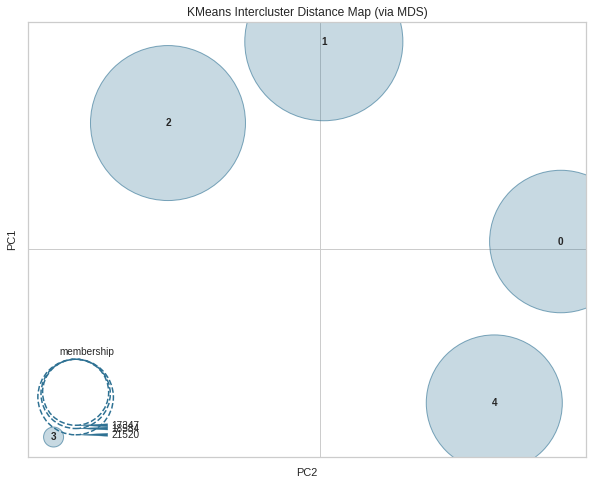

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

<IPython.core.display.Javascript object>

In [37]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Intercluster distance Map with best k
distance_visualizer = InterclusterDistance(
    KMeans(n_clusters=best_K, init="k-means++", random_state=SEED)
)
distance_visualizer.fit(X)
distance_visualizer.show()

Sur cette projection en 2D, les différents clusters sont bien séparés sur les 2 premières composantes principales. Le clustering semble donc performant et il faut à présent identifier les composantes métier de chaque cluster.

## Analyse des différents clusters

A présent, nous allons entrainer notre KMeans avec le K optimal sélectionné et affecter son cluster à chaque client. Ainsi, nous pourrons analyser les différences entre chaque cluster :

In [38]:
# KMeans model with best K
kmeans_model = KMeans(n_clusters=best_K, init="k-means++", random_state=SEED)
kmeans_model.fit(X)

# Kmeans labels
kmeans_labels = kmeans_model.labels_

<IPython.core.display.Javascript object>

In [39]:
X_scaled.shape

(91223, 15)

<IPython.core.display.Javascript object>

**Répartition du nombre de clients par cluster**

Clusters,Nb_clients,%
0,18584,20.370000
1,22375,24.530000
2,21520,23.590000
3,11397,12.490000
4,17347,19.020000


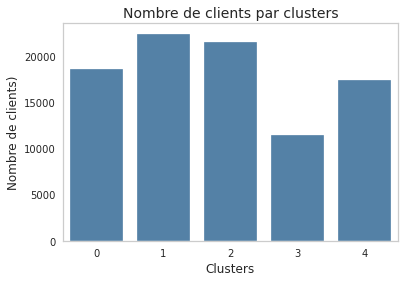

<IPython.core.display.Javascript object>

In [40]:
utilities_segmentation.affiche_clients_par_clusters(kmeans_labels)

> ##  <font color=#BF4025>Visualisation</font>

Pour bien visualiser nos clusters on va utiliser un algorithme de réduction de la dimensionnalité. Pour ce faire, nous utiliserons la t-SNE et UMAP pour projeter nos données dans l'espace 2D.

In [41]:
# Projection t-SNE en 2D avec les données quantitatives standardisées
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, random_state=SEED)
X_projected_tsne = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 91223 samples in 3.815s...
[t-SNE] Computed neighbors for 91223 samples in 66.658s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91223
[t-SNE] Computed conditional probabilities for sample 2000 / 91223
[t-SNE] Computed conditional probabilities for sample 3000 / 91223
[t-SNE] Computed conditional probabilities for sample 4000 / 91223
[t-SNE] Computed conditional probabilities for sample 5000 / 91223
[t-SNE] Computed conditional probabilities for sample 6000 / 91223
[t-SNE] Computed conditional probabilities for sample 7000 / 91223
[t-SNE] Computed conditional probabilities for sample 8000 / 91223
[t-SNE] Computed conditional probabilities for sample 9000 / 91223
[t-SNE] Computed conditional probabilities for sample 10000 / 91223
[t-SNE] Computed conditional probabilities for sample 11000 / 91223
[t-SNE] Computed conditional probabilities for sample 12000 / 91223
[t-SNE] Computed conditional probabilities for s

<IPython.core.display.Javascript object>

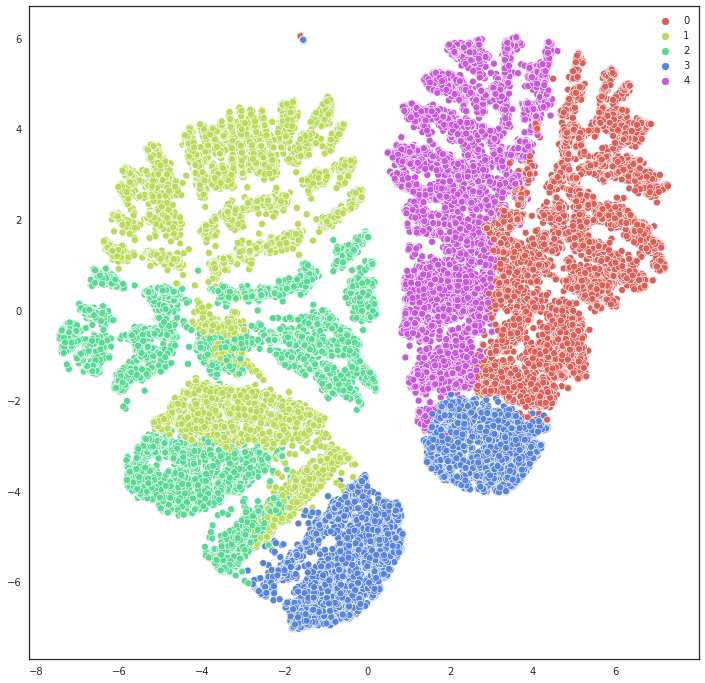

<IPython.core.display.Javascript object>

In [42]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(
    X_projected_tsne, kmeans_labels, best_K
)

In [43]:
# Projection UMAP en 2D
projector_umap = UMAP(
    random_state=SEED, n_neighbors=200, min_dist=0.8, n_components=2, metric="manhattan"
)
X_projected_umap = projector_umap.fit_transform(X)

<IPython.core.display.Javascript object>

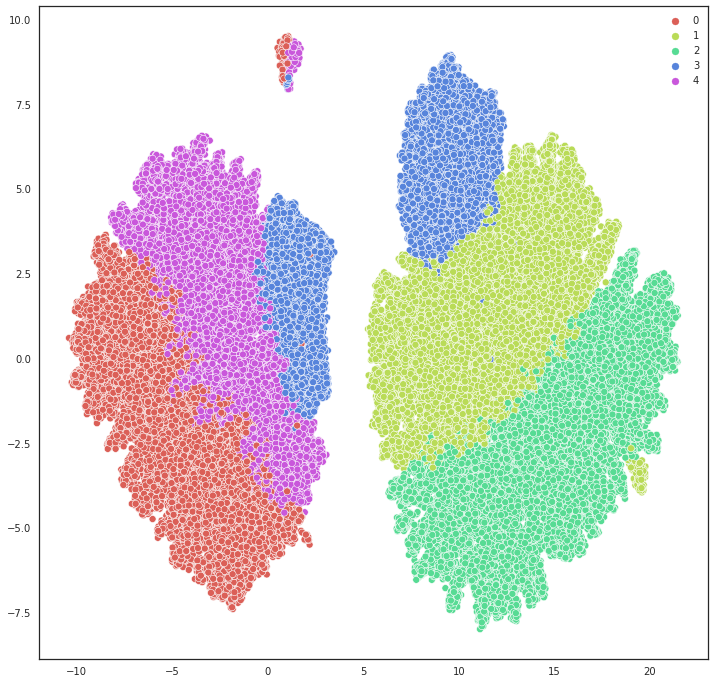

<IPython.core.display.Javascript object>

In [44]:
utilities_segmentation.affiche_umap_par_clusters(
    X_projected_umap, kmeans_labels, best_K
)

> ##  <font color=#BF4025>Interprétation des 5 clusters</font>

In [45]:
data_km = data.copy()
data_km["kmeans_label"] = kmeans_labels

<IPython.core.display.Javascript object>

In [46]:
# aggrégation des variables choisis pour l'interprétation
kmeans_clusters_means = data_km.groupby("kmeans_label").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
    }
)
kmeans_clusters_means.reset_index(inplace=True)
kmeans_clusters_means.head()

,kmeans_label,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,394.684836,1.223472,198.602447,4.580155,727.810326,2016.993812,8,2.723364,1.061715,124.725358,2.0,19.251899
1,1,120.522726,1.202190,194.981105,4.575386,690.511057,2018.000000,4,2.278883,1.055741,124.445200,1.5,20.504310
2,2,119.671887,1.212175,200.948349,4.596232,683.223978,2018.000000,5,2.399117,1.059043,123.753757,1.0,20.532121
3,3,233.869001,1.414056,319.664468,1.235744,796.052203,2017.586821,5,3.782574,1.158834,133.452520,2.0,21.618873
4,4,366.371649,1.214273,193.231976,4.524784,740.292595,2016.993313,9,2.592148,1.056342,125.739345,2.0,19.515650


<IPython.core.display.Javascript object>

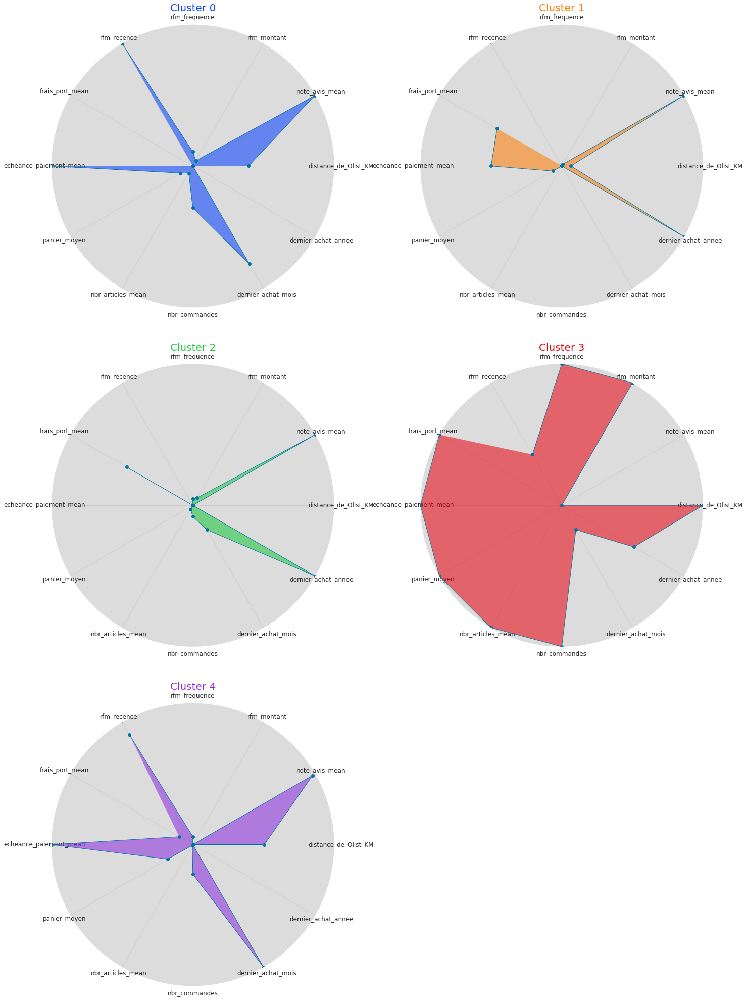

<IPython.core.display.Javascript object>

In [47]:
# mpl.rcParams["figure.figsize"] = (24, 35)
utilities_segmentation.affiche_radarplot_par_clusters(
    kmeans_clusters_means, "kmeans_label", 3, 2
)

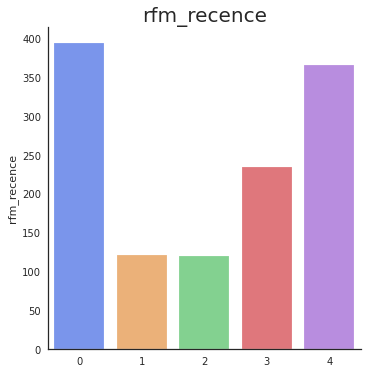

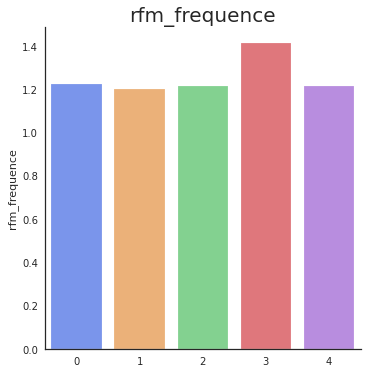

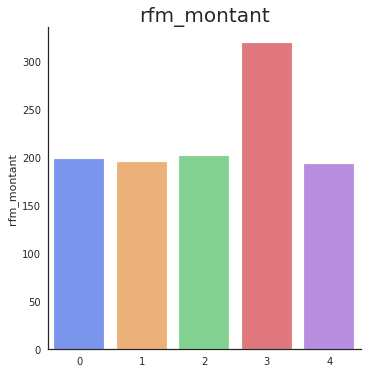

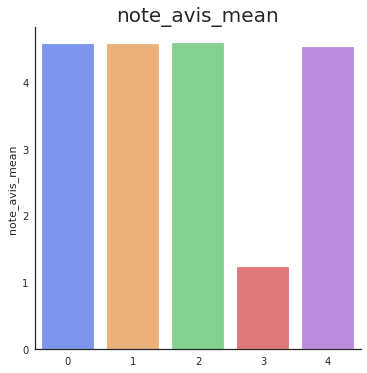

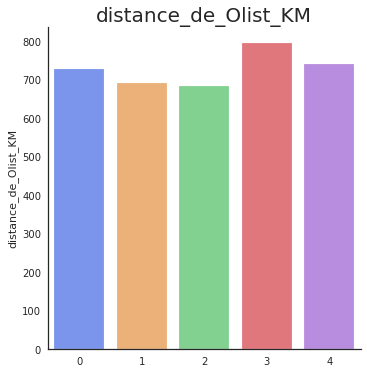

...

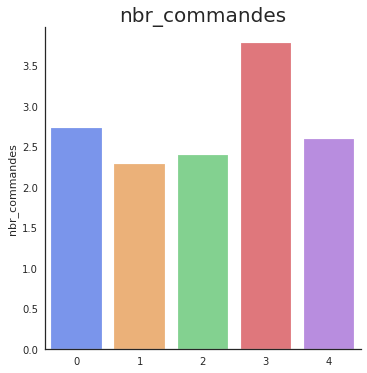

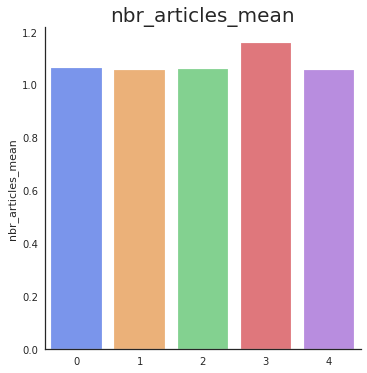

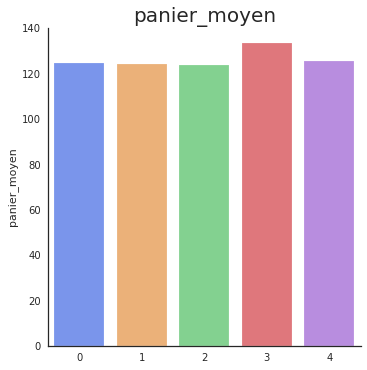

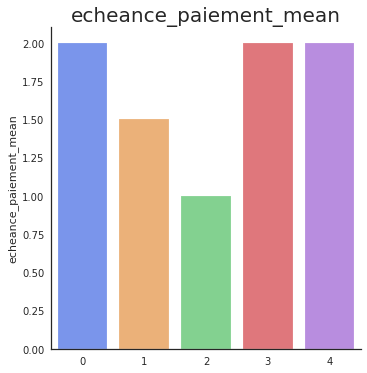

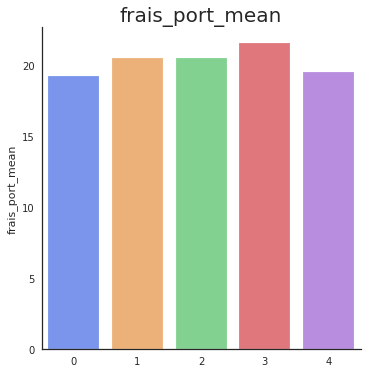

<IPython.core.display.Javascript object>

In [48]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    kmeans_clusters_means, "kmeans_label"
)

In [49]:
col_reduced = [
    "kmeans_label",
    "rfm_recence",
    "rfm_frequence",
    "rfm_montant",
    "note_avis_mean",
    "distance_de_Olist_KM",
    "dernier_achat_annee",
    "dernier_achat_mois",
    "nbr_commandes",
    "nbr_articles_mean",
    "panier_moyen",
    "echeance_paiement_mean",
    "frais_port_mean",
]

<IPython.core.display.Javascript object>

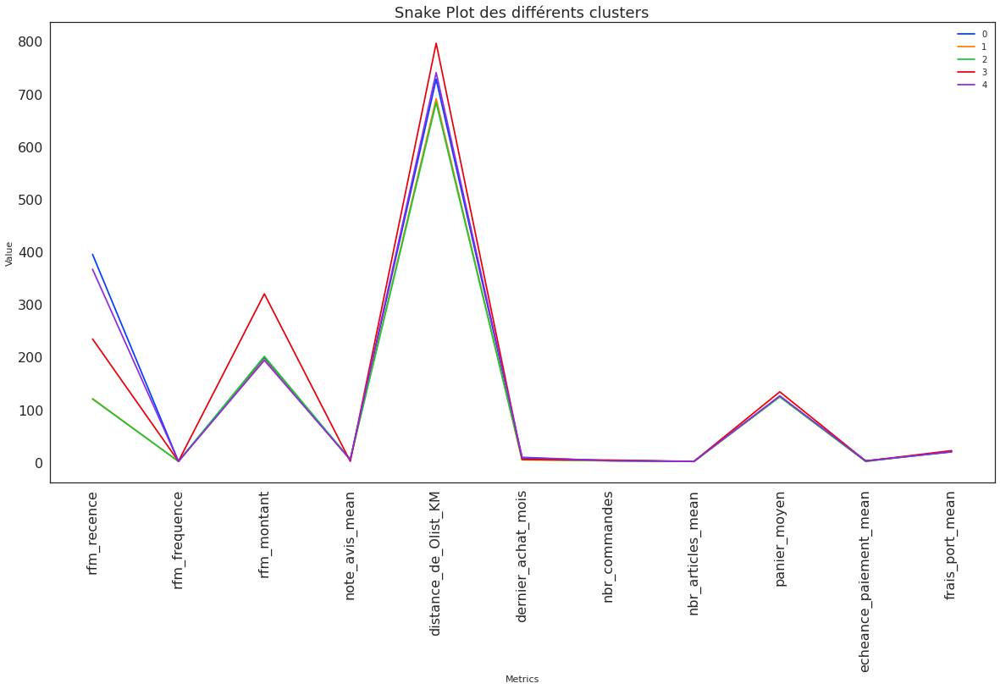

<IPython.core.display.Javascript object>

In [50]:
# Snakeplot de visualisation des différents clusters
utilities_segmentation.affiche_snakeplot_par_clusters(
    kmeans_clusters_means, "kmeans_label"
)

In [51]:
kmeans_clusters_means

,kmeans_label,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,394.684836,1.223472,198.602447,4.580155,727.810326,2016.993812,8,2.723364,1.061715,124.725358,2.0,19.251899
1,1,120.522726,1.202190,194.981105,4.575386,690.511057,2018.000000,4,2.278883,1.055741,124.445200,1.5,20.504310
2,2,119.671887,1.212175,200.948349,4.596232,683.223978,2018.000000,5,2.399117,1.059043,123.753757,1.0,20.532121
3,3,233.869001,1.414056,319.664468,1.235744,796.052203,2017.586821,5,3.782574,1.158834,133.452520,2.0,21.618873
4,4,366.371649,1.214273,193.231976,4.524784,740.292595,2016.993313,9,2.592148,1.056342,125.739345,2.0,19.515650


<IPython.core.display.Javascript object>

In [52]:
kmeans_clusters_means["rfm_montant"].mean()

221.48566887507087

<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>
- **Cluster 0** : commandes très anciennes, peu fréquentes, et d'un montant assez élevé. Les avis de ces clients sont très bons, Ils paient en deux fois. Le dernier achat remonte à 8 mois ==> **Clients presque perdus**.
- **Cluster 1** : commandes assez récentes, peu fréquentes, et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en 1.5 fois. Le dernier achat remonte à 4 mois ==> **Clients fidèles**.
- **Cluster 2** : les commandes sont les plus récentes, peu fréquentes, et d'un montant assez élevé. Les avis de ces clients sont très bons. Ils paient en une seule fois. Le dernier achat remonte à 5 mois ==> **Nouveaux clients et ayant besoin d'attention**.
- **Cluster 3** : les commandes assez anciennes, plus fréquentes, et d'un montant très élevé. Les avis de ces clients sont très mauvais. Ils paient en deux fois. Le dernier achat remonte à 5 mois ==> **Clients mécontent**.
- **Cluster 4** : les commandes sont très anciennes, peu fréquentes, et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. Le dernier achat remonte à 9 mois ==> **Clients ayant besoin d'une activation**.

<font color=#5000A1>Les clients, en majorité, commandent une seule fois. Cela se traduit par un manque de fidélité des clients. **L'entreprise Olist doit mettre en place une stratégie pour fidéliser ses clients**.</font>

> ##  <font color=green id="section_3_1_4">3.1.4. Segmentation KMeans : variables quantitatives + qualitatives</font>

Pour la suite de l'analyse, on utilisera les données quantitatives avec transformations logrithmiques et les données qualitatives encodées.

In [53]:
cat_cols = data.select_dtypes(["category", "object"]).columns
cat_cols

Index(['moyen_paiement_prefere', 'cat_produit_prefere'], dtype='object')

<IPython.core.display.Javascript object>

In [54]:
# Encodage du moyen de paiement préféré
# encod_paiement = pd.get_dummies(data['moyen_paiement_prefere'])
# expanded data
# data_scaled_extended = data_scaled.join(encod_paiement)

<IPython.core.display.Javascript object>

In [55]:
# Encodage de la catégorie préférée
encod_cat_pref = pd.get_dummies(data["cat_produit_prefere"])
data_scaled_extended = data_scaled.join(encod_cat_pref)

<IPython.core.display.Javascript object>

In [56]:
data_scaled_extended.head()

,distance_de_Olist_KM,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,dernier_achat_annee,dernier_achat_mois,dernier_achat_jour,dernier_achat_heure,dernier_achat_jour_prefere,...,panier_moyen,echeance_paiement_mean,frais_port_mean,fashion,food,health,hobies,home,pro,tech
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
00bd903b65b4c9a1c822887d0b012592,0.078836,0.148415,0.000000,0.001025,1.0,1.0,0.363636,0.566667,0.000000,0.666667,...,0.015020,0.041667,0.048037,0,0,0,0,1,0,0
9005fcc94dfc5549a00761abe430be1e,0.113163,0.213256,0.013514,0.002156,1.0,1.0,0.272727,0.066667,0.000000,0.166667,...,0.006556,0.041667,0.039836,0,0,0,1,0,0,0
742911bd5109eccceb784f65b7175128,0.041980,0.520173,0.000000,0.008227,1.0,0.5,0.727273,0.033333,0.434783,0.833333,...,0.131590,0.416667,0.053310,0,0,1,0,0,0,0
e3516dfa2db85b7f75ccff1bda80a011,0.039401,0.025937,0.000000,0.000355,1.0,1.0,0.636364,0.333333,0.608696,0.833333,...,0.005799,0.083333,0.020601,0,0,0,0,1,0,0
a6ac63c6cecf4e5122bcedaa54c2b2de,0.065342,0.044669,0.000000,0.000502,0.5,1.0,0.545455,0.900000,0.652174,0.833333,...,0.006556,0.041667,0.047623,0,0,0,0,0,1,0


<IPython.core.display.Javascript object>

In [57]:
data_scaled_extended.columns

Index(['distance_de_Olist_KM', 'rfm_recence', 'rfm_frequence', 'rfm_montant',
       'note_avis_mean', 'dernier_achat_annee', 'dernier_achat_mois',
       'dernier_achat_jour', 'dernier_achat_heure',
       'dernier_achat_jour_prefere', 'nbr_commandes', 'nbr_articles_mean',
       'panier_moyen', 'echeance_paiement_mean', 'frais_port_mean', 'fashion',
       'food', 'health', 'hobies', 'home', 'pro', 'tech'],
      dtype='object')

<IPython.core.display.Javascript object>

In [58]:
Y = data_scaled_extended.values

<IPython.core.display.Javascript object>

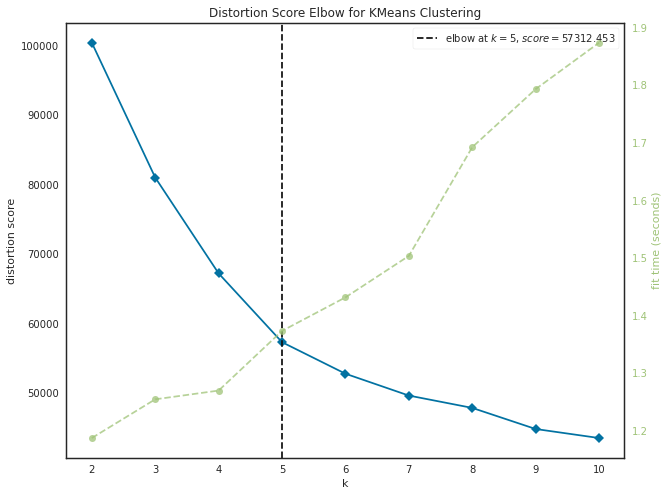

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

<IPython.core.display.Javascript object>

In [59]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Elbow method
kmeans_visualizer = KElbowVisualizer(
    KMeans(init="k-means++", random_state=SEED), K=(2, 11)
)
kmeans_visualizer.fit(Y)
kmeans_visualizer.show()

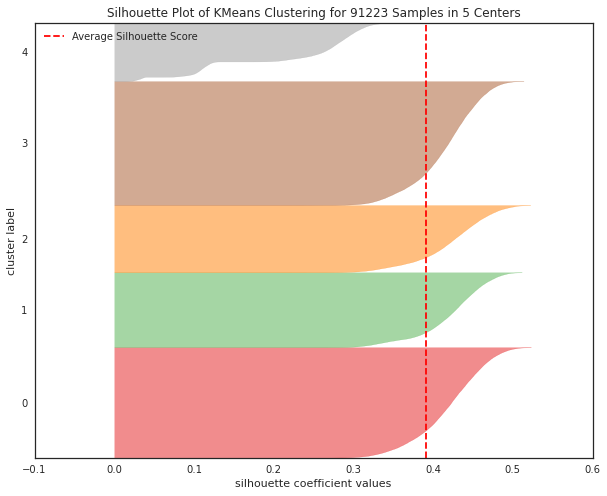

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 91223 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [60]:
# Best K in Elbow fot expanded data
best_K_exp = kmeans_visualizer.elbow_value_

# Silhouette Visualizer
silhouette_visualizer = SilhouetteVisualizer(
    KMeans(n_clusters=best_K_exp, init="k-means++", random_state=SEED)
)
silhouette_visualizer.fit(Y)
silhouette_visualizer.show()

In [61]:
# KMeans model with best K
kmeans_model_exp = KMeans(n_clusters=best_K_exp, init="k-means++", random_state=SEED)
kmeans_model_exp.fit(Y)

# Kmeans labels
kmeans_labels_exp = kmeans_model_exp.labels_

<IPython.core.display.Javascript object>

In [62]:
silhouette_visualizer.silhouette_score_

0.39090906247450047

<IPython.core.display.Javascript object>

In [63]:
tsne_exp = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, random_state=SEED)
Y_projected_tsne = tsne_exp.fit_transform(Y)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 91223 samples in 0.001s...
[t-SNE] Computed neighbors for 91223 samples in 262.974s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91223
[t-SNE] Computed conditional probabilities for sample 2000 / 91223
[t-SNE] Computed conditional probabilities for sample 3000 / 91223
[t-SNE] Computed conditional probabilities for sample 4000 / 91223
[t-SNE] Computed conditional probabilities for sample 5000 / 91223
[t-SNE] Computed conditional probabilities for sample 6000 / 91223
[t-SNE] Computed conditional probabilities for sample 7000 / 91223
[t-SNE] Computed conditional probabilities for sample 8000 / 91223
[t-SNE] Computed conditional probabilities for sample 9000 / 91223
[t-SNE] Computed conditional probabilities for sample 10000 / 91223
[t-SNE] Computed conditional probabilities for sample 11000 / 91223
[t-SNE] Computed conditional probabilities for sample 12000 / 91223
[t-SNE] Computed conditional probabilities for 

<IPython.core.display.Javascript object>

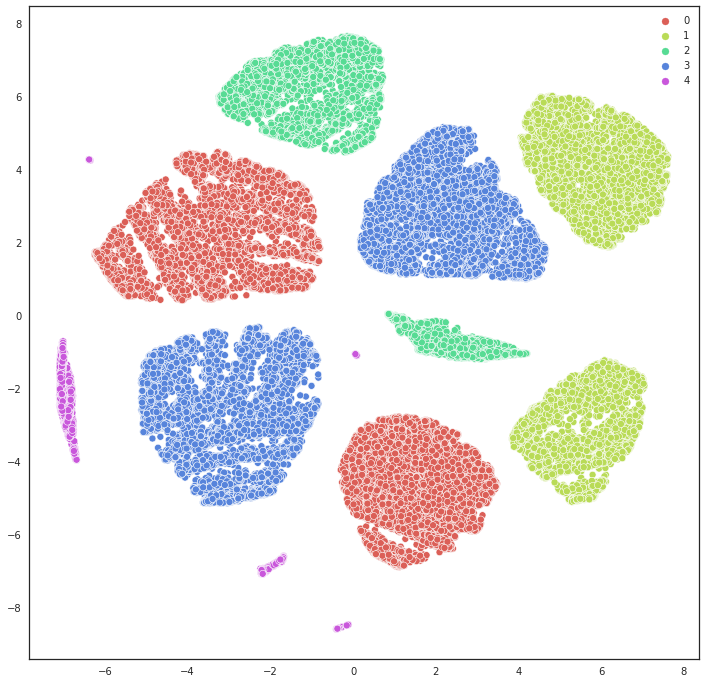

<IPython.core.display.Javascript object>

In [64]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(
    Y_projected_tsne, kmeans_labels_exp, best_K_exp
)

In [65]:
# Projection UMAP en 2D
Y_projected_umap = projector_umap.fit_transform(Y)

<IPython.core.display.Javascript object>

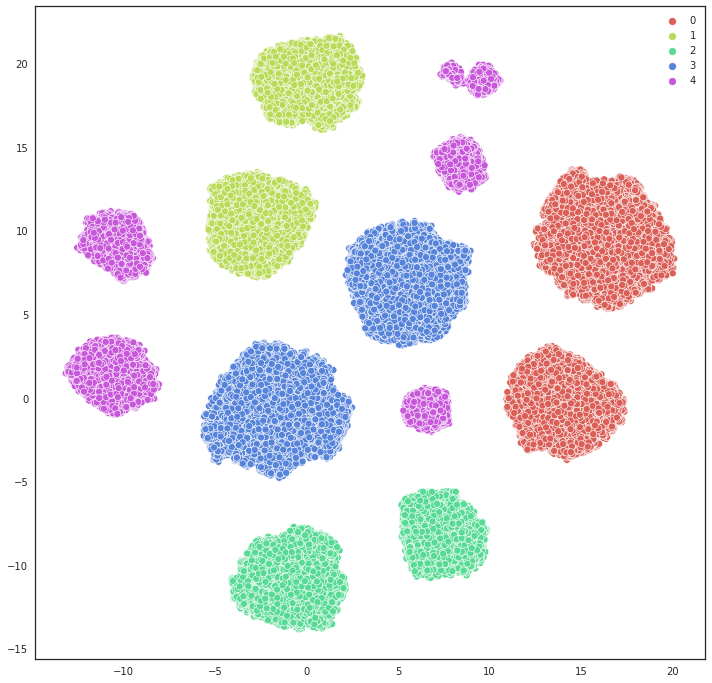

<IPython.core.display.Javascript object>

In [66]:
utilities_segmentation.affiche_umap_par_clusters(
    Y_projected_umap, kmeans_labels_exp, best_K_exp
)

**Interprétation**

In [67]:
data_km_exp = data.copy()
data_km_exp["kmeans_label_exp"] = kmeans_labels_exp

<IPython.core.display.Javascript object>

Clusters,Nb_clients,%
0,23198,25.430000
1,15719,17.230000
2,14096,15.450000
3,26001,28.500000
4,12209,13.380000


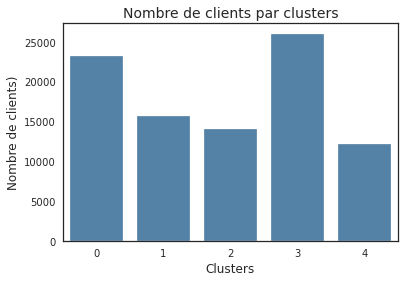

<IPython.core.display.Javascript object>

In [68]:
utilities_segmentation.affiche_clients_par_clusters(kmeans_labels_exp)

In [69]:
mode_col = lambda x: x.mode()[0]
kmeans_clusters_means_exp = data_km_exp.groupby("kmeans_label_exp").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
        "cat_produit_prefere": mode_col,
    }
)
kmeans_clusters_means_exp.reset_index(inplace=True)
kmeans_clusters_means_exp.head()

,kmeans_label_exp,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
0,0,227.088671,1.169584,217.512903,4.106350,781.065897,2017.593111,6,2.009225,1.051775,135.887225,1.0,18.276869,tech
1,1,259.266938,1.179846,193.542422,4.236774,719.065912,2017.471722,6,2.133724,1.047057,134.530465,1.0,20.255670,hobies
2,2,226.221836,1.183173,190.702291,4.209546,752.039690,2017.579881,6,2.234251,1.049365,133.342092,2.0,19.233223,health
3,3,240.785354,1.351025,234.956672,4.079909,648.054750,2017.545594,6,3.628014,1.108372,112.850441,2.0,22.085016,home
4,4,232.190106,1.262839,203.763125,4.234707,714.249150,2017.558440,6,2.893767,1.081737,113.595411,1.0,20.936279,pro


<IPython.core.display.Javascript object>

In [70]:
# Moyen de paiement par cluster
# data_km_exp.groupby('kmeans_label_exp')['moyen_paiement_prefere'].apply(pd.Series.mode)

<IPython.core.display.Javascript object>

In [71]:
# catégorie de produit préféré par cluster
data_km_exp.groupby("kmeans_label_exp")["cat_produit_prefere"].apply(pd.Series.mode)

kmeans_label_exp   
0                 0      tech
1                 0    hobies
2                 0    health
3                 0      home
4                 0       pro
Name: cat_produit_prefere, dtype: object

<IPython.core.display.Javascript object>

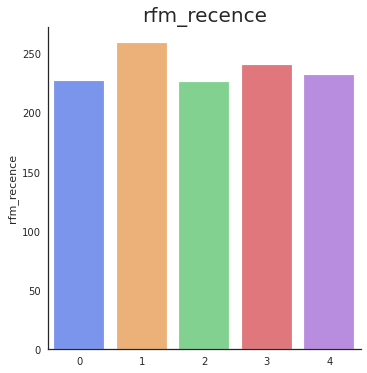

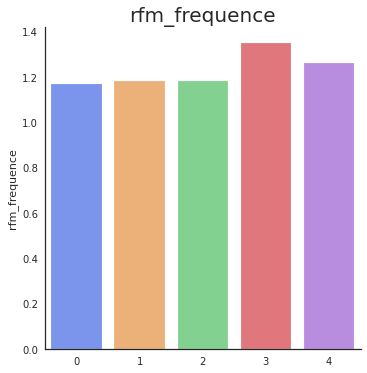

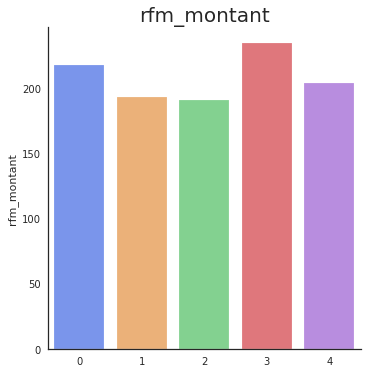

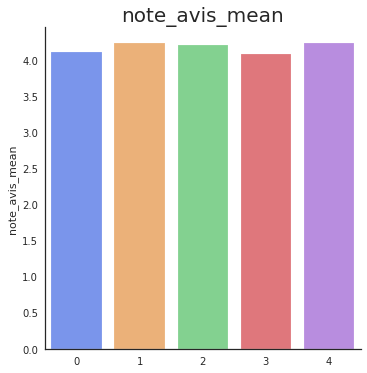

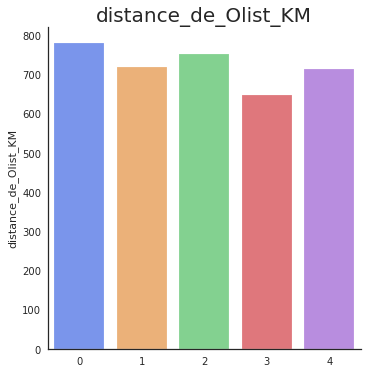

...

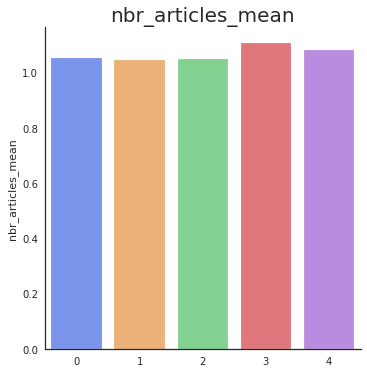

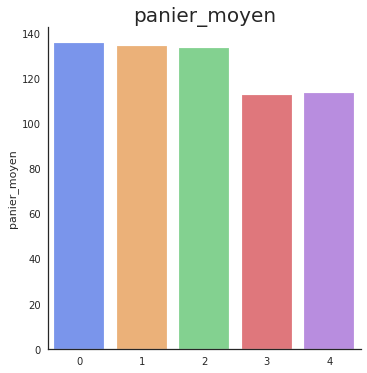

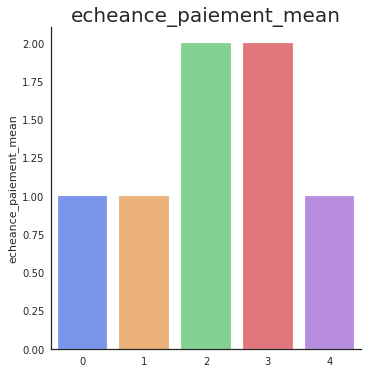

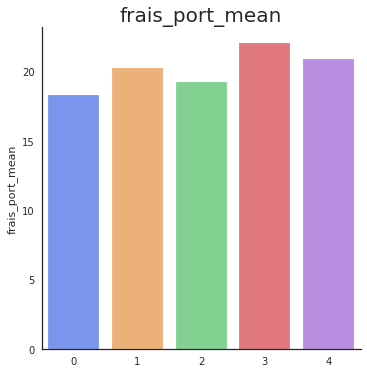

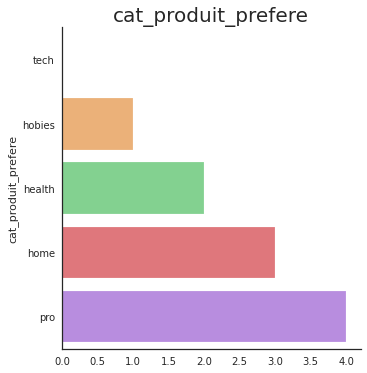

<IPython.core.display.Javascript object>

In [72]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    kmeans_clusters_means_exp, "kmeans_label_exp"
)

In [73]:
kmeans_clusters_means_exp_red = kmeans_clusters_means_exp.drop(
    columns=["cat_produit_prefere"]
)

<IPython.core.display.Javascript object>

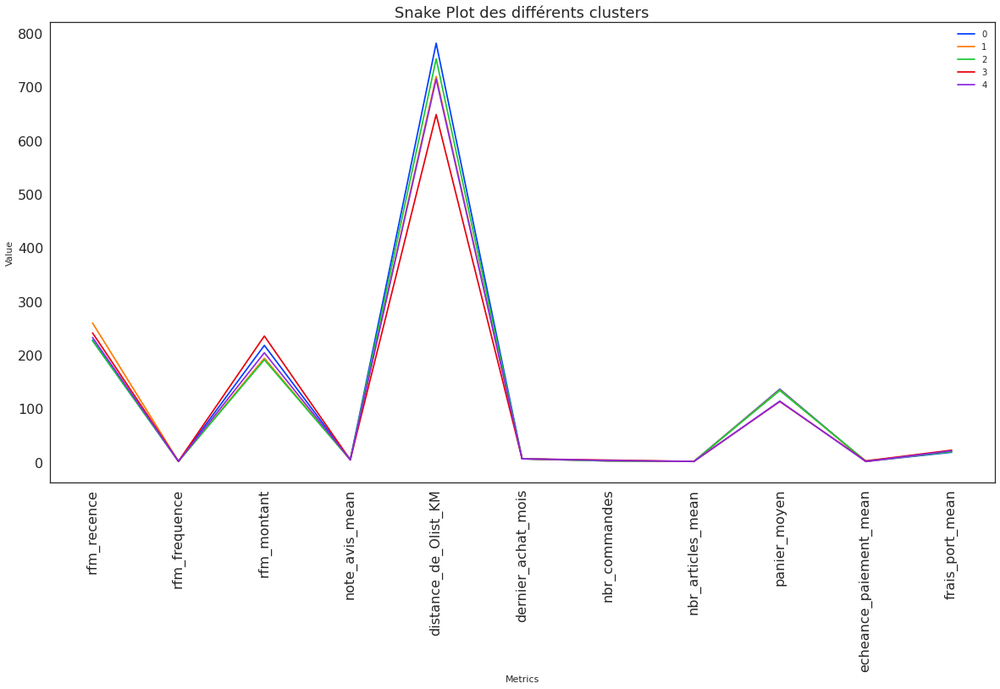

<IPython.core.display.Javascript object>

In [74]:
# Snakeplot de visualisation des différents clusters
utilities_segmentation.affiche_snakeplot_par_clusters(
    kmeans_clusters_means_exp_red, "kmeans_label_exp"
)

In [75]:
kmeans_clusters_means_exp_red

,kmeans_label_exp,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,227.088671,1.169584,217.512903,4.106350,781.065897,2017.593111,6,2.009225,1.051775,135.887225,1.0,18.276869
1,1,259.266938,1.179846,193.542422,4.236774,719.065912,2017.471722,6,2.133724,1.047057,134.530465,1.0,20.255670
2,2,226.221836,1.183173,190.702291,4.209546,752.039690,2017.579881,6,2.234251,1.049365,133.342092,2.0,19.233223
3,3,240.785354,1.351025,234.956672,4.079909,648.054750,2017.545594,6,3.628014,1.108372,112.850441,2.0,22.085016
4,4,232.190106,1.262839,203.763125,4.234707,714.249150,2017.558440,6,2.893767,1.081737,113.595411,1.0,20.936279


<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>

- **Cluster 0** : commandes assez anciennes, assez fréquentes et d'un montant élevé. ==> **Clients presque perdus**.
- **Cluster 1** : commandes les plus anciennes, assez fréquentes et d'un montant peu élevé. Le nombre de jour depuis le premier achat étant le plus grand ==> **Clients perdus ou presque**.    
- **Cluster 2** : commandes assez récentes, peu fréquentes et d'un montant peu élevé ==> **Clients ayant besoin d'attention**.

- **Cluster 3** : commandes les plus récentes, peu fréquentes et d'un montant élevé. Le nombre de jour depuis le premier achat étant le plus petit ==> **Nouveaux clients**.    
- **Cluster 4** : commandes assez anciennes, les plus fréquentes et d'un montant le plus élevé ==> **Meilleurs clients nécessitant une activation**. 

In [76]:
kmeans_clusters_means_exp_red["rfm_montant"].mean()

208.0954827574432

<IPython.core.display.Javascript object>

**Catégories de produits préférées par clusters**

In [77]:
df_cat_pref = data_km_exp[["kmeans_label_exp", "cat_produit_prefere"]]

<IPython.core.display.Javascript object>

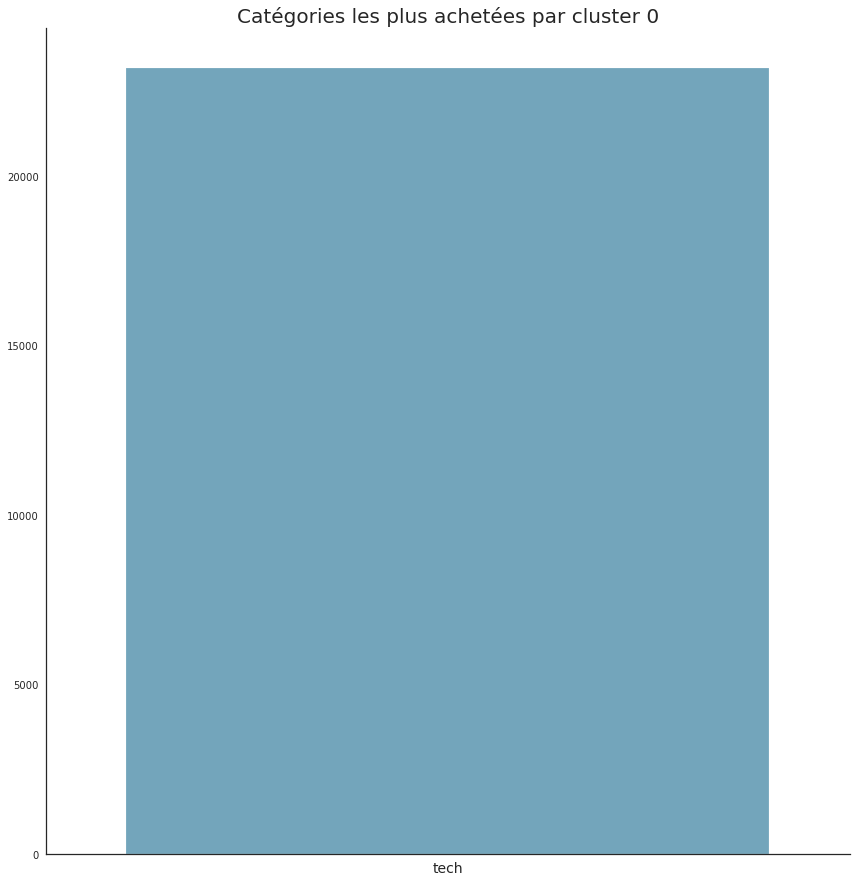

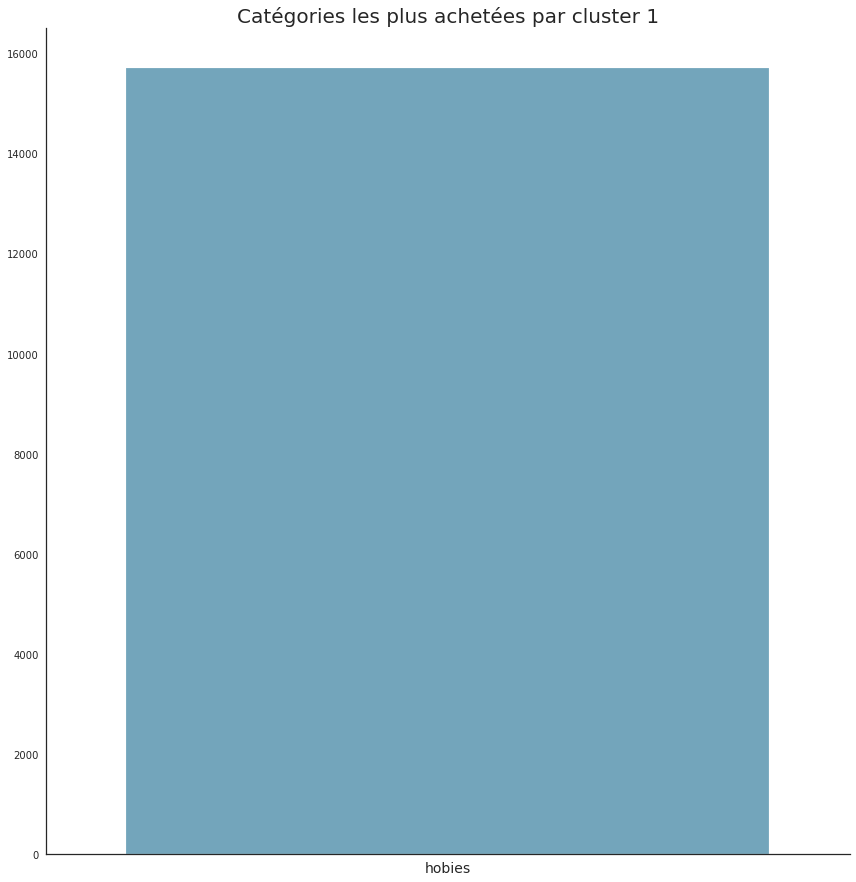

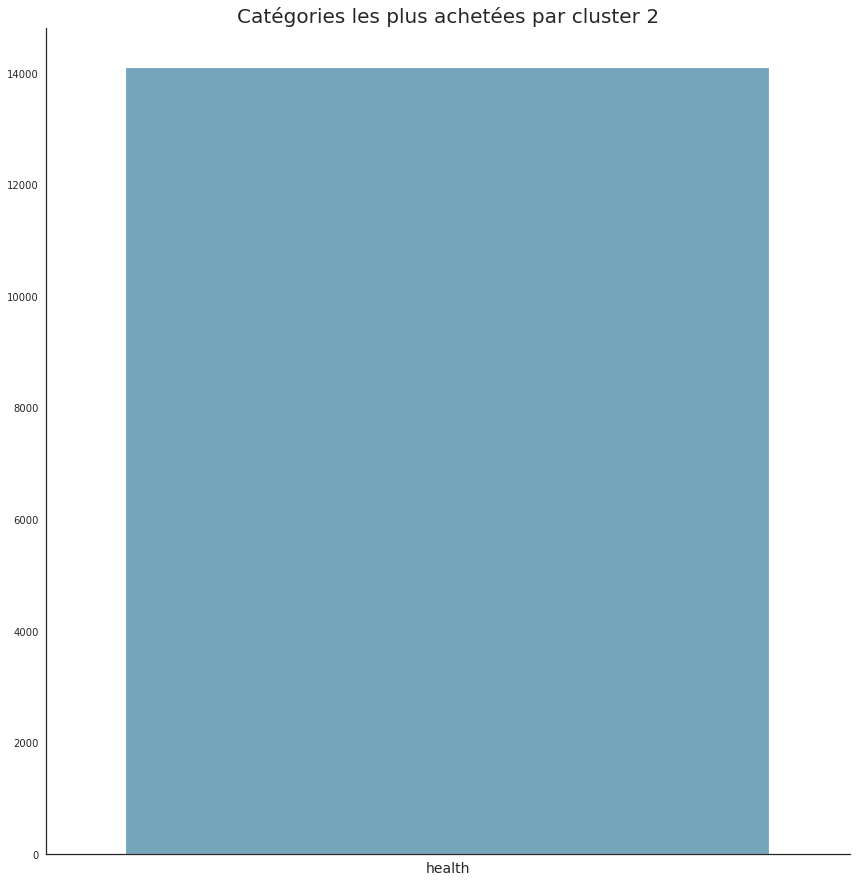

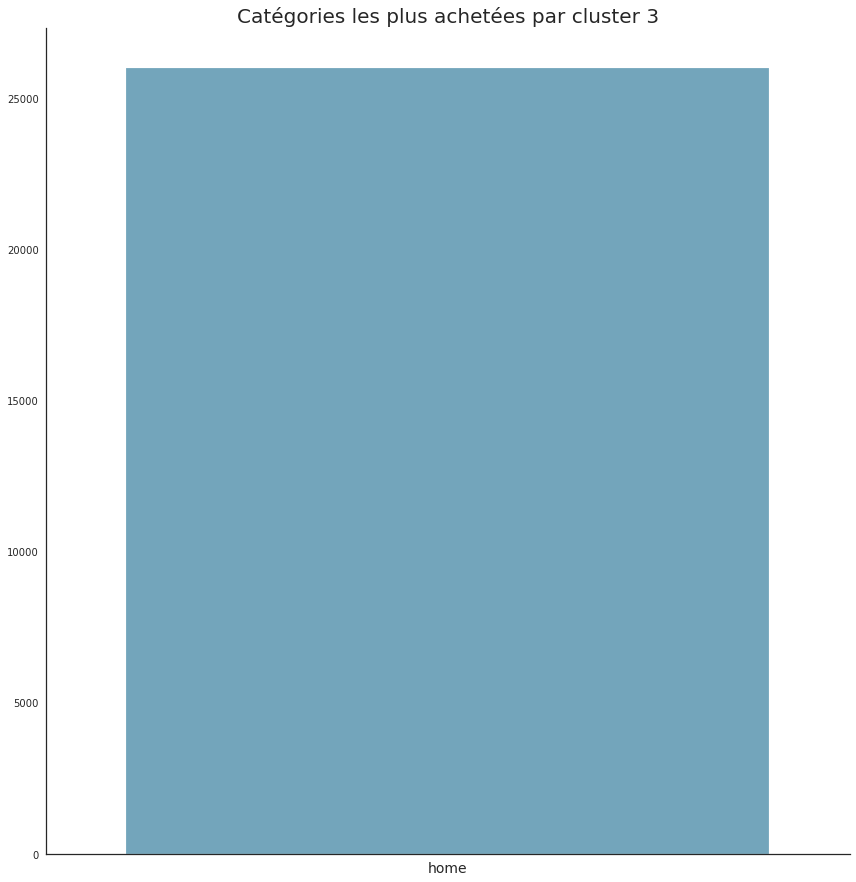

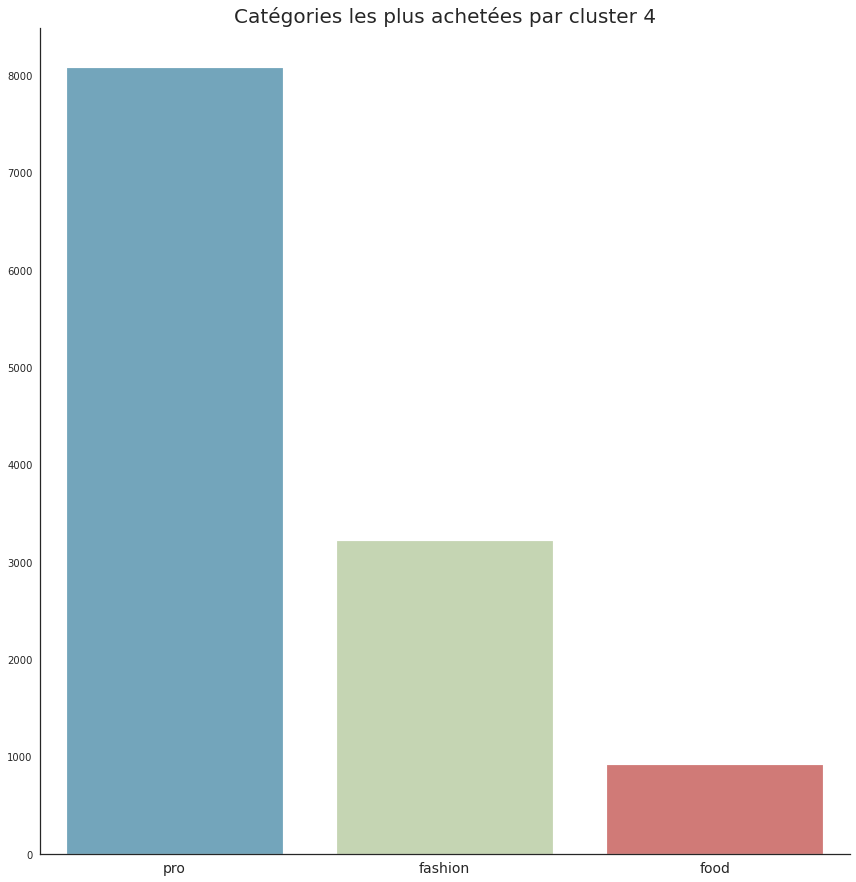

<IPython.core.display.Javascript object>

In [78]:
mpl.rcParams["figure.figsize"] = (8, 7)

# Catégories de produits les plus achetées par cluster
for i in range(0, best_K_exp):
    df = (
        df_cat_pref[df_cat_pref["kmeans_label_exp"] == i]
        .groupby("cat_produit_prefere")
        .count()
        .sort_values(by="kmeans_label_exp", ascending=False)
    )
    df = df.reset_index()
    g = sns.catplot(
        x=df["cat_produit_prefere"].unique(),
        y=df["kmeans_label_exp"].values,
        data=df,
        ci="sd",
        kind="bar",
        alpha=0.6,
        height=12,
    )
    plt.xticks(fontsize=14)
    plt.title("Catégories les plus achetées par cluster {}".format(i), fontsize=20)
    plt.show()

<font color=#5000A1>Nous constatons une forte dépendance des clusters de la catégorie des produits achetés :<br>       - Cluster 0 : Les clients achètent principalement les produits `tech`. <br>
    - Cluster 1 : Les clients achètent principalement les produits `hobies`. <br>
    - Cluster 2 : Les clients achètent majoritairement les produits de type `health`.<br>
    - Cluster 3 : Les clients achètent principalement les produits `home`. <br>
    - Cluster 1 : Les clients achètent 4 catégories de produits : en première place les produits de type `pro` suivi des produits de type  `fashion`, `fashion` et `food`.<br>
    <br>

L'algorithme K-Means a donné plus de poids à la variable `cat_produit_prefere` .</font>

> ###  <font color=#0088B4>Synthèse</font>
<font color=#5000A1>**K-Means permet de segmenter les clients en 5 groupes distinctifs et informatifs. La répartition de la catégorie des produits est bien différente selon les groupes de clients.**</font>

> ##  <font color=green id="section_3_1_5">3.1.5. Segmentation KMeans + ACP</font>

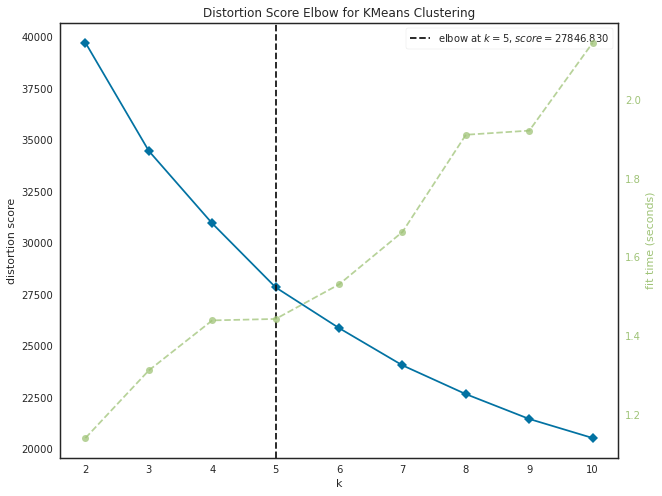

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

<IPython.core.display.Javascript object>

In [79]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Elbow method
kmeans_visualizer_acp = KElbowVisualizer(KMeans(), K=(4, 12))
kmeans_visualizer_acp.fit(X_projected_acp)
kmeans_visualizer_acp.show()

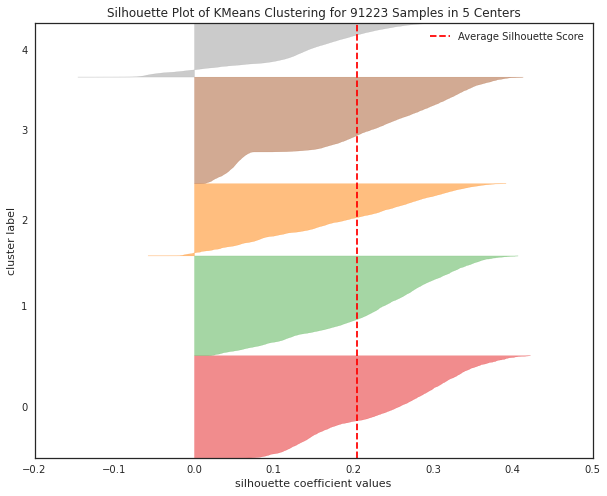

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 91223 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [80]:
mpl.rcParams["figure.figsize"] = (10, 8)
# Best K in Elbow
best_K_acp = kmeans_visualizer_acp.elbow_value_

# Silhouette Visualizer
silhouette_visualizer_acp = SilhouetteVisualizer(
    KMeans(n_clusters=best_K_acp, init="k-means++", random_state=SEED)
)
silhouette_visualizer_acp.fit(X_projected_acp)
silhouette_visualizer_acp.show()

## Analyse des différents clusters

A présent, nous allons entrainer notre KMeans avec le K optimal sélectionné et affecter son cluster à chaque client. Ainsi, nous pourrons analyser les différences entre chaque cluster :

In [81]:
# KMeans model with best K
kmeans_model_acp = KMeans(n_clusters=best_K_acp, init="k-means++", random_state=SEED)
kmeans_model_acp.fit(X_projected_acp)

# Kmeans labels
kmeans_labels_acp = kmeans_model_acp.labels_

<IPython.core.display.Javascript object>

In [82]:
X_projected_acp.shape

(91223, 6)

<IPython.core.display.Javascript object>

Clusters,Nb_clients,%
0,21515,23.590000
1,20939,22.950000
2,15154,16.610000
3,22364,24.520000
4,11251,12.330000


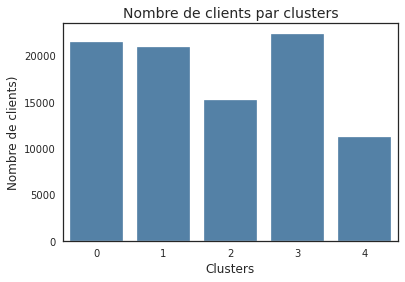

<IPython.core.display.Javascript object>

In [83]:
utilities_segmentation.affiche_clients_par_clusters(kmeans_labels_acp)

> ##  <font color=#BF4025>Visualisation</font>

Pour bien visualiser nos clusters on va utiliser un algorithme de réduction de la dimensionnalité. Pour ce faire, nous utiliserons la t-SNE et UMAP pour projeter nos données dans l'espace 2D.

In [84]:
# Projection t-SNE en 2D avec les données quantitatives standardisées
X_projected_acp_tsne = tsne.fit_transform(X_projected_acp)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 91223 samples in 0.065s...
[t-SNE] Computed neighbors for 91223 samples in 7.445s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91223
[t-SNE] Computed conditional probabilities for sample 2000 / 91223
[t-SNE] Computed conditional probabilities for sample 3000 / 91223
[t-SNE] Computed conditional probabilities for sample 4000 / 91223
[t-SNE] Computed conditional probabilities for sample 5000 / 91223
[t-SNE] Computed conditional probabilities for sample 6000 / 91223
[t-SNE] Computed conditional probabilities for sample 7000 / 91223
[t-SNE] Computed conditional probabilities for sample 8000 / 91223
[t-SNE] Computed conditional probabilities for sample 9000 / 91223
[t-SNE] Computed conditional probabilities for sample 10000 / 91223
[t-SNE] Computed conditional probabilities for sample 11000 / 91223
[t-SNE] Computed conditional probabilities for sample 12000 / 91223
[t-SNE] Computed conditional probabilities for sa

<IPython.core.display.Javascript object>

In [85]:
X_projected_acp_tsne.shape

(91223, 2)

<IPython.core.display.Javascript object>

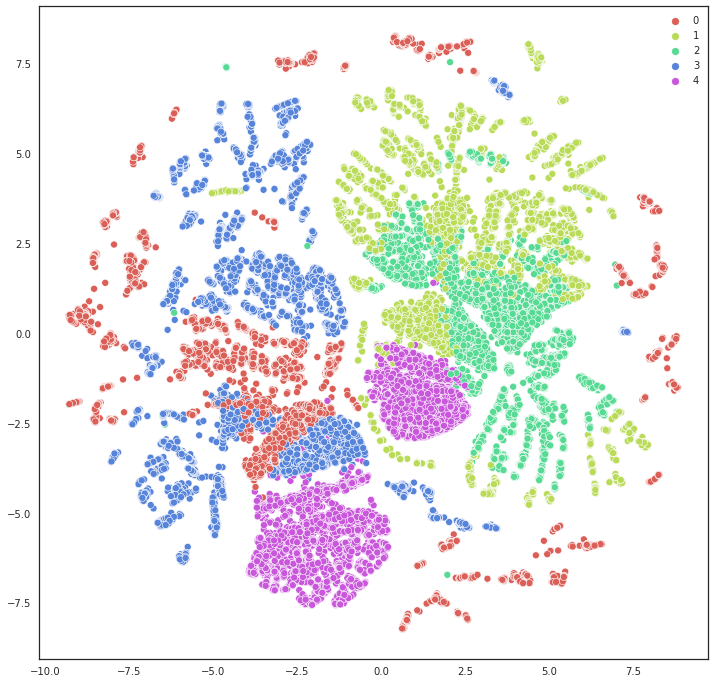

<IPython.core.display.Javascript object>

In [86]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(
    X_projected_acp_tsne, kmeans_labels_acp, best_K_acp
)

In [87]:
# Projection UMAP en 2D
X_projected_umap_acp = projector_umap.fit_transform(X_projected_acp)

<IPython.core.display.Javascript object>

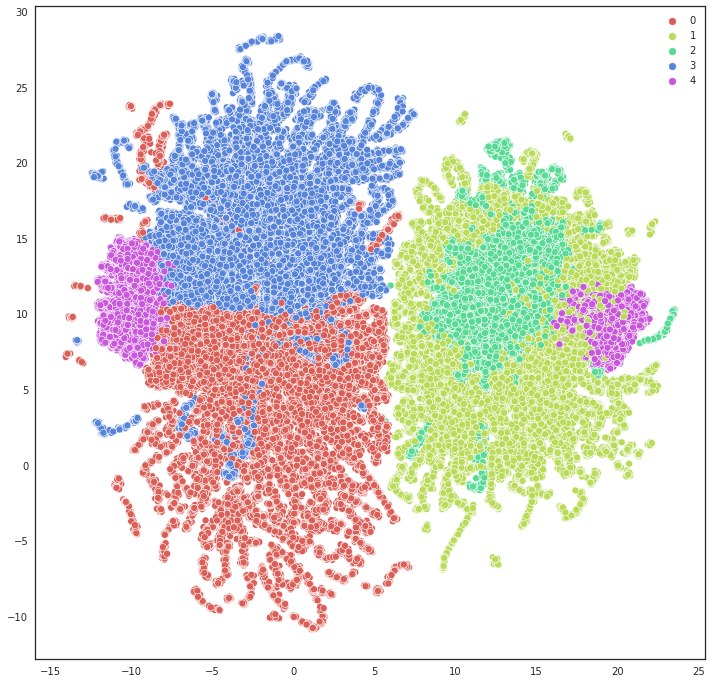

<IPython.core.display.Javascript object>

In [88]:
utilities_segmentation.affiche_umap_par_clusters(
    X_projected_umap_acp, kmeans_labels_acp, best_K_acp
)

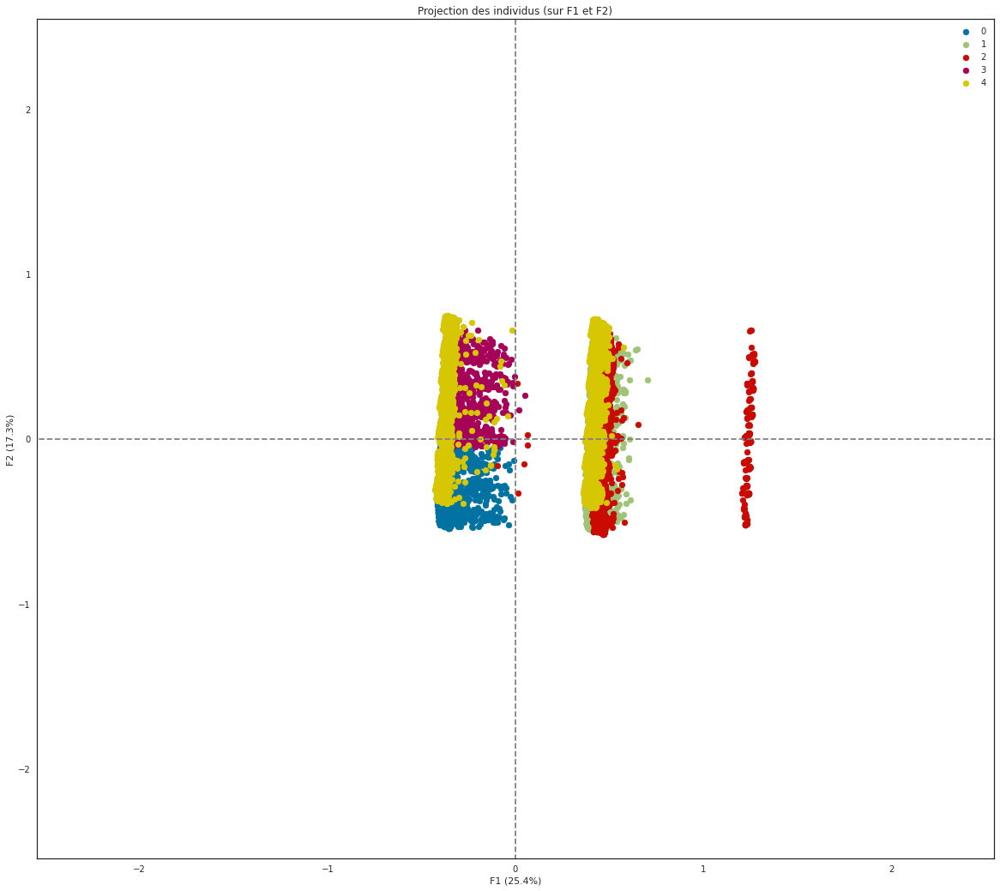

<IPython.core.display.Javascript object>

In [89]:
# Visualisation avec ACP
utilities_acp.display_factorials_planes(
    X_projected_acp, n_comp, pca, [(0, 1)], alpha=1, illustrative_var=kmeans_labels_acp
)

In [90]:
data_km_acp = data.copy()
data_km_acp["kmeans_label"] = kmeans_labels_acp

<IPython.core.display.Javascript object>

In [91]:
# aggrégation des variables choisis pour l'interprétation
kmeans_acp_clusters_means = data_km_acp.groupby("kmeans_label").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
    }
)
kmeans_acp_clusters_means.reset_index(inplace=True)
kmeans_acp_clusters_means.head()

,kmeans_label,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,119.655961,1.211899,200.891545,4.596320,683.268522,2018.000000,5,2.398745,1.059053,123.761969,1.0,20.532597
1,1,310.934858,1.212188,196.472469,4.563759,729.263686,2017.000000,10,2.404652,1.058999,124.310393,2.0,19.377573
2,2,480.764155,1.231886,195.921578,4.512752,739.433661,2016.984295,5,3.039791,1.059545,126.740309,2.0,19.374055
3,3,120.486586,1.200903,194.833014,4.575613,690.503369,2018.000000,4,2.267573,1.055683,124.448706,1.5,20.506702
4,4,227.765265,1.415074,320.930571,1.227656,797.696648,2017.596480,5,3.783575,1.159876,133.164115,2.0,21.653948


<IPython.core.display.Javascript object>

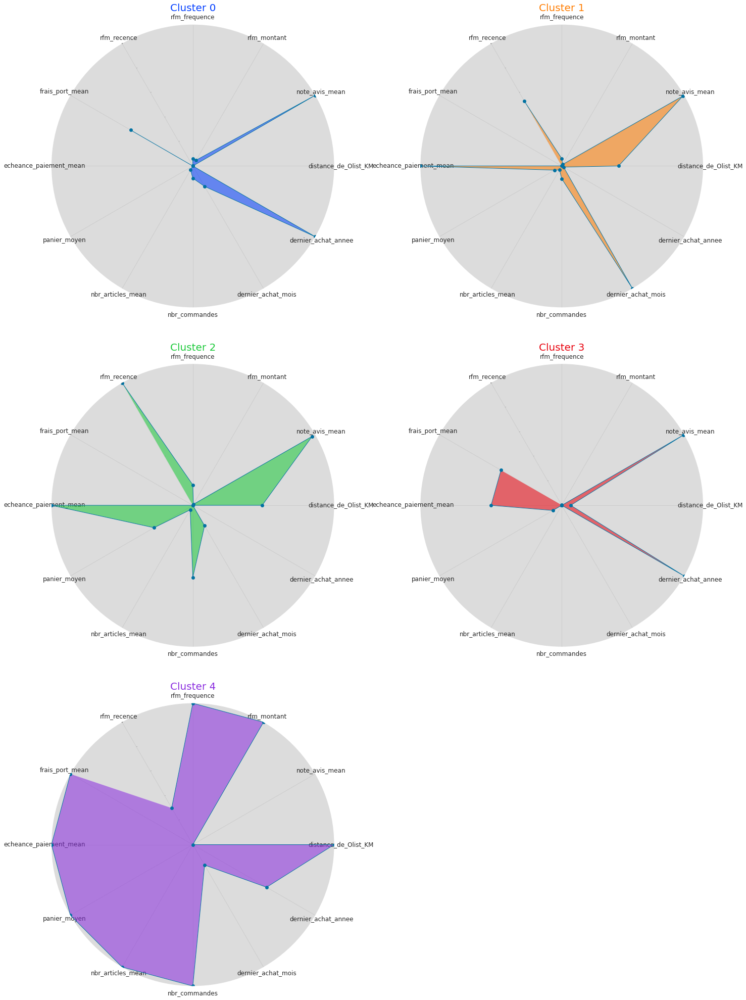

<IPython.core.display.Javascript object>

In [92]:
# mpl.rcParams["figure.figsize"] = (24, 35)
utilities_segmentation.affiche_radarplot_par_clusters(
    kmeans_acp_clusters_means, "kmeans_label", 3, 2
)

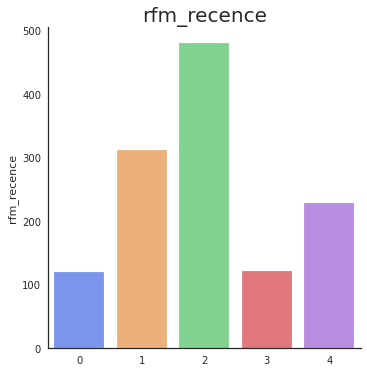

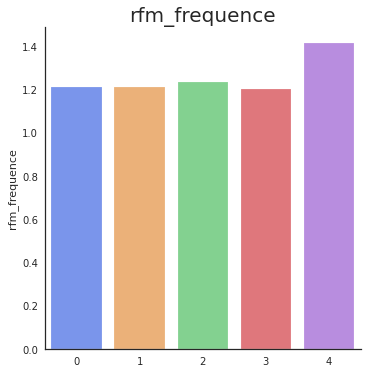

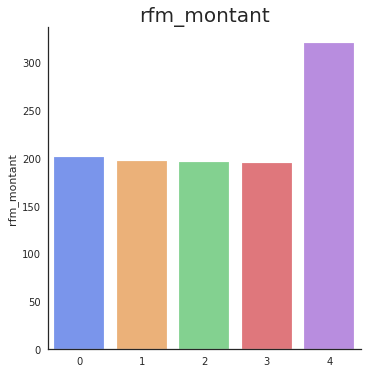

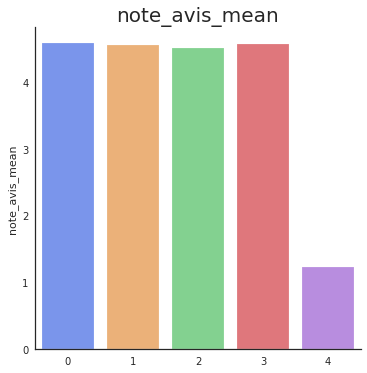

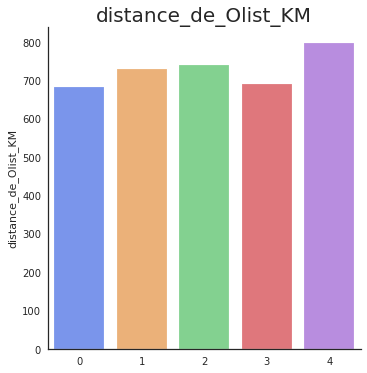

...

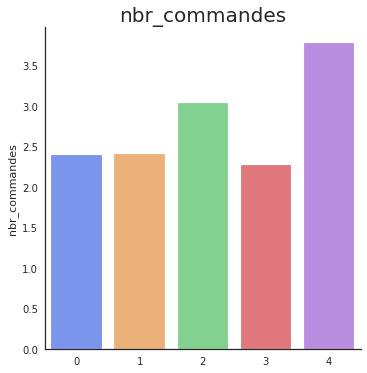

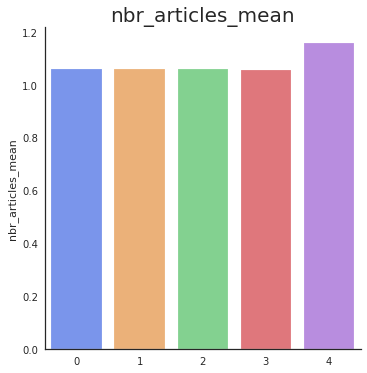

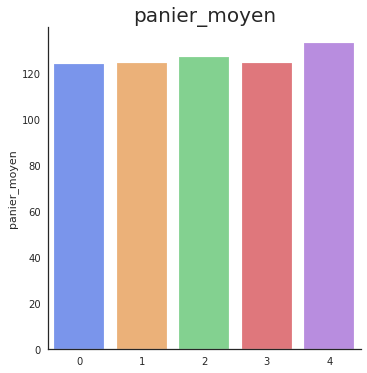

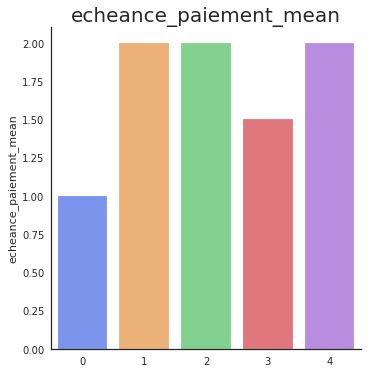

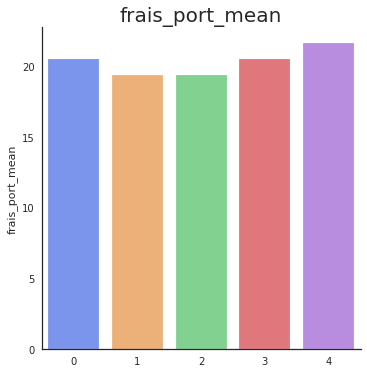

<IPython.core.display.Javascript object>

In [93]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    kmeans_acp_clusters_means, "kmeans_label"
)

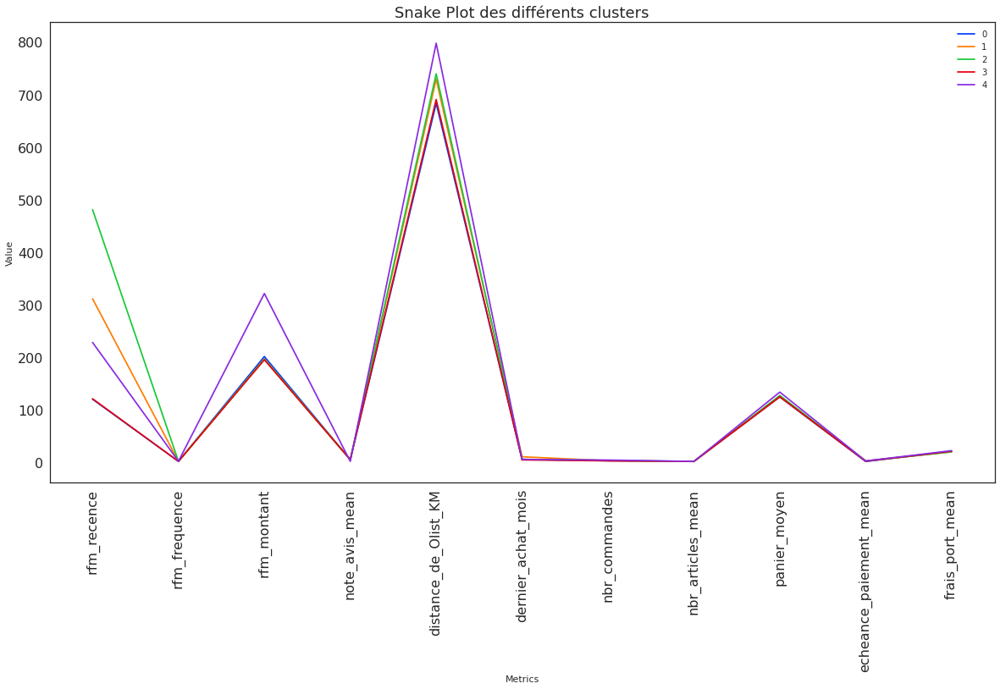

<IPython.core.display.Javascript object>

In [94]:
# Snakeplot de visualisation des différents clusters
utilities_segmentation.affiche_snakeplot_par_clusters(
    kmeans_acp_clusters_means, "kmeans_label"
)

In [95]:
kmeans_clusters_means

,kmeans_label,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,394.684836,1.223472,198.602447,4.580155,727.810326,2016.993812,8,2.723364,1.061715,124.725358,2.0,19.251899
1,1,120.522726,1.202190,194.981105,4.575386,690.511057,2018.000000,4,2.278883,1.055741,124.445200,1.5,20.504310
2,2,119.671887,1.212175,200.948349,4.596232,683.223978,2018.000000,5,2.399117,1.059043,123.753757,1.0,20.532121
3,3,233.869001,1.414056,319.664468,1.235744,796.052203,2017.586821,5,3.782574,1.158834,133.452520,2.0,21.618873
4,4,366.371649,1.214273,193.231976,4.524784,740.292595,2016.993313,9,2.592148,1.056342,125.739345,2.0,19.515650


<IPython.core.display.Javascript object>

In [96]:
kmeans_acp_clusters_means

,kmeans_label,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,119.655961,1.211899,200.891545,4.596320,683.268522,2018.000000,5,2.398745,1.059053,123.761969,1.0,20.532597
1,1,310.934858,1.212188,196.472469,4.563759,729.263686,2017.000000,10,2.404652,1.058999,124.310393,2.0,19.377573
2,2,480.764155,1.231886,195.921578,4.512752,739.433661,2016.984295,5,3.039791,1.059545,126.740309,2.0,19.374055
3,3,120.486586,1.200903,194.833014,4.575613,690.503369,2018.000000,4,2.267573,1.055683,124.448706,1.5,20.506702
4,4,227.765265,1.415074,320.930571,1.227656,797.696648,2017.596480,5,3.783575,1.159876,133.164115,2.0,21.653948


<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>

- **Cluster 0** : les commandes sont les plus récentes, peu fréquentes, et d'un montant assez élevé. Les avis de ces clients sont très bons. Ils paient en 1 fois. Le dernier achat remonte à 5 mois ==> **Nouveaux clients**.
- **Cluster 1** : commandes très anciennes, peu fréquentes, et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en 2 fois. Le dernier achat remonte à 10 mois ==> **Client presque perdus**.
- **Cluster 2** : commandes très anciennes, peu fréquentes, et d'un montant peu élevé. Les avis de ces clients sont très bons, Ils paient en 2 fois. Le dernier achat remonte à 5 mois ==> **Clients fidèles**.
- **Cluster 3** : les commandes assez récentes, peu fréquentes, et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en 1.5 fois. Le dernier achat remonte à 4 mois ==> **Clients ayant besoin d'attention**.
- **Cluster 4** : les commandes sont assez anciennes, un peu plus fréquentes, et d'un montant très élevé. Les avis de ces clients sont mauvais. Ils paient en 2 fois. Le dernier achat remonte à 5 mois ==> **Meilleurs clients**.

> # <font style='color:#DD5E00' id="section_3_2">3.2 K-Prototype</font>

- K-Prototype est une méthode de clustering basée sur le partitionnement. 
- Son algorithme est une forme améliorée de l'algorithme de clustering K-Means et K-Mode pour gérer le clustering avec des types de données mixtes. 
- Il mesure la distance entre les caractéristiques numériques en utilisant la distance euclidienne (comme K-means) mais mesure également la distance entre les caractéristiques catégorielles en utilisant le nombre de catégories correspondantes. 

In [97]:
data_sample_kprototype = data.sample(frac=0.7, random_state=SEED)

<IPython.core.display.Javascript object>

In [98]:
columns = data.columns

<IPython.core.display.Javascript object>

In [99]:
columns

Index(['geolocation_lat', 'geolocation_lng', 'distance_de_Olist_KM',
       'rfm_recence', 'rfm_frequence', 'rfm_montant', 'note_avis_mean',
       'date_premier_achat', 'nbr_jours_premier_achat', 'date_dernier_achat',
       'dernier_achat_annee', 'dernier_achat_mois', 'dernier_achat_jour',
       'dernier_achat_heure', 'dernier_achat_jour_prefere', 'nbr_commandes',
       'nbr_articles_mean', 'panier_moyen', 'moyen_paiement_prefere',
       'echeance_paiement_mean', 'frais_port_mean', 'cat_produit_prefere'],
      dtype='object')

<IPython.core.display.Javascript object>

In [100]:
# exclure les variables de geolocation
# et le nombre de jours depuis le premier achat
kprototype_cols = [col for col in columns if col not in cols_to_remove]

<IPython.core.display.Javascript object>

In [101]:
data_sample_kprototype = data_sample_kprototype[kprototype_cols]
data_sample_kprototype.shape

(63856, 19)

<IPython.core.display.Javascript object>

In [102]:
# Table de travail
data_kprototype = data_sample_kprototype.copy()
# Suppression des variables date de première et dernière commande inutiles
data_kprototype.drop(
    columns=["date_premier_achat", "date_dernier_achat", "moyen_paiement_prefere"],
    inplace=True,
)

<IPython.core.display.Javascript object>

In [103]:
data_kprototype.columns

Index(['distance_de_Olist_KM', 'rfm_recence', 'rfm_frequence', 'rfm_montant',
       'note_avis_mean', 'dernier_achat_annee', 'dernier_achat_mois',
       'dernier_achat_jour', 'dernier_achat_heure',
       'dernier_achat_jour_prefere', 'nbr_commandes', 'nbr_articles_mean',
       'panier_moyen', 'echeance_paiement_mean', 'frais_port_mean',
       'cat_produit_prefere'],
      dtype='object')

<IPython.core.display.Javascript object>

In [104]:
data_kprototype.columns[[15]]

Index(['cat_produit_prefere'], dtype='object')

<IPython.core.display.Javascript object>

In [105]:
# Pré-processing
scaler = MinMaxScaler()
for col in data_kprototype.select_dtypes(exclude="object").columns:
    data_kprototype[col] = scaler.fit_transform(
        np.array(data_kprototype[col]).reshape(-1, 1)
    )

# Détermine les variables catégorielles par leurs index
cols_categorical = [15]

# Instanciation du modèle de clustering
kproto = KPrototypes(n_clusters=5, init="Cao", n_jobs=-1)
clusters = kproto.fit_predict(data_kprototype, categorical=cols_categorical)

<IPython.core.display.Javascript object>

In [106]:
data_kprototype.head()

,distance_de_Olist_KM,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,dernier_achat_annee,dernier_achat_mois,dernier_achat_jour,dernier_achat_heure,dernier_achat_jour_prefere,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
customer_unique_id,,,,,,,,,,,,,,,,
2baa23a5bd2ab426e7958a5f498d39a9,0.088635,0.674352,0.0,0.001083,0.75,0.5,0.363636,0.533333,0.913043,0.333333,0.0,0.0,0.016194,0.250000,0.048017,health
f5ad37694fec1bb0acb578cbd9ea73ce,0.087334,0.449568,0.0,0.002761,1.00,0.5,0.818182,0.633333,0.695652,0.666667,0.0,0.0,0.042923,0.041667,0.057344,hobies
23449b8db09b61165ec6dda58068de16,0.117261,0.399135,0.0,0.000757,1.00,0.5,0.909091,0.800000,0.478261,0.833333,0.0,0.0,0.011308,0.041667,0.040743,hobies
6bff15aac94a3849d47883072b231b86,0.087858,0.123919,0.0,0.001683,1.00,1.0,0.454545,0.066667,0.695652,1.000000,0.0,0.0,0.026588,0.333333,0.036479,home
61d1eb091e650165fab08a2ef8f11981,0.087703,0.622478,0.0,0.002199,0.50,0.5,0.454545,0.700000,0.739130,0.500000,0.0,0.0,0.035336,0.041667,0.029551,tech


<IPython.core.display.Javascript object>

In [107]:
data_kproto_projection = data_kprototype[
    data_kprototype.columns[~data_kprototype.columns.isin(["cat_produit_prefere"])]
]

<IPython.core.display.Javascript object>

In [108]:
# K-prototype labels
kprototype_labels = kproto.labels_

<IPython.core.display.Javascript object>

In [109]:
kproto_tsne = tsne_exp.fit_transform(data_kproto_projection.values)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 63856 samples in 6.746s...
[t-SNE] Computed neighbors for 63856 samples in 43.798s...
[t-SNE] Computed conditional probabilities for sample 1000 / 63856
[t-SNE] Computed conditional probabilities for sample 2000 / 63856
[t-SNE] Computed conditional probabilities for sample 3000 / 63856
[t-SNE] Computed conditional probabilities for sample 4000 / 63856
[t-SNE] Computed conditional probabilities for sample 5000 / 63856
[t-SNE] Computed conditional probabilities for sample 6000 / 63856
[t-SNE] Computed conditional probabilities for sample 7000 / 63856
[t-SNE] Computed conditional probabilities for sample 8000 / 63856
[t-SNE] Computed conditional probabilities for sample 9000 / 63856
[t-SNE] Computed conditional probabilities for sample 10000 / 63856
[t-SNE] Computed conditional probabilities for sample 11000 / 63856
[t-SNE] Computed conditional probabilities for sample 12000 / 63856
[t-SNE] Computed conditional probabilities for s

<IPython.core.display.Javascript object>

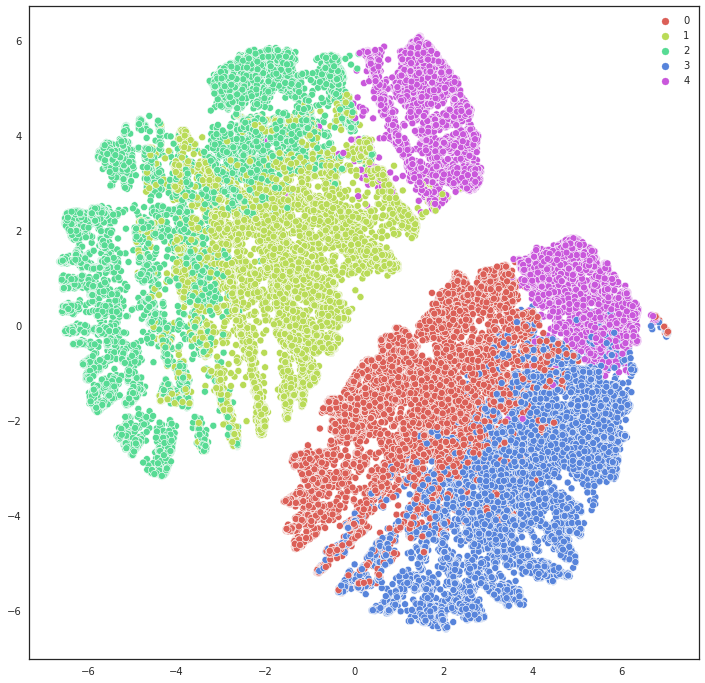

<IPython.core.display.Javascript object>

In [110]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(kproto_tsne, clusters, 5)

In [111]:
# Projection UMAP en 2D
data_kprot_umap = projector_umap.fit_transform(data_kproto_projection.values)

<IPython.core.display.Javascript object>

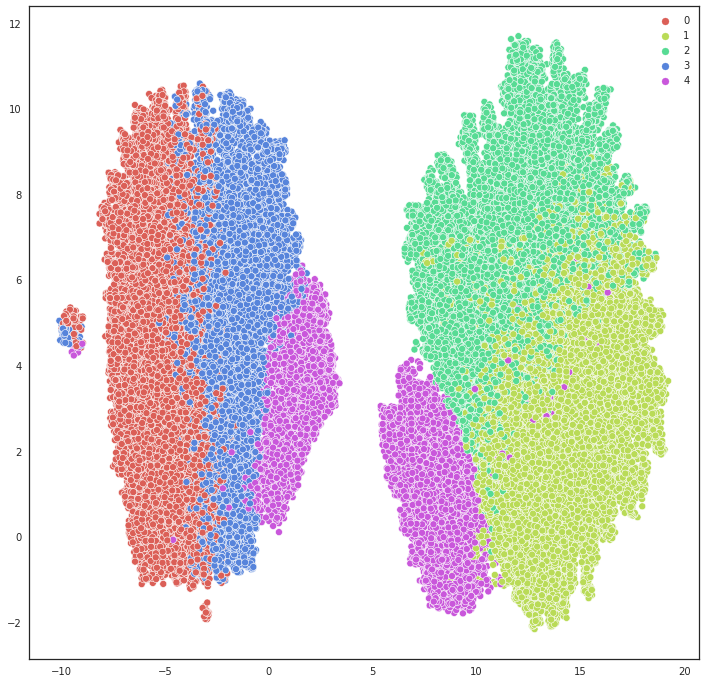

<IPython.core.display.Javascript object>

In [112]:
# Visualisation de la représentation UMAP en 2D
utilities_segmentation.affiche_umap_par_clusters(data_kprot_umap, clusters, 5)

In [113]:
# Assignation du cluster au dataframe
data_kproto = data_sample_kprototype.copy()
data_kproto["Cluster_Kproto"] = kproto.labels_

<IPython.core.display.Javascript object>

**Répartition du nombre de clients par cluster**

Clusters,Nb_clients,%
0,13256,20.760000
1,15576,24.390000
2,15081,23.620000
3,11868,18.590000
4,8075,12.650000


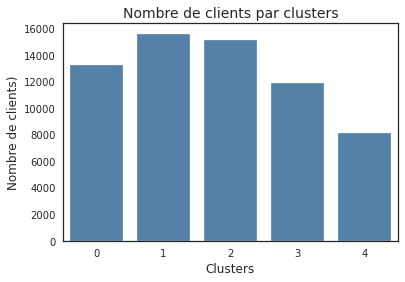

<IPython.core.display.Javascript object>

In [114]:
utilities_segmentation.affiche_clients_par_clusters(clusters)

In [115]:
df_interpret_kproto = data_kproto.groupby("Cluster_Kproto").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
        "cat_produit_prefere": lambda x: x.mode()[0],
    }
)
df_interpret_kproto.reset_index(inplace=True)
df_interpret_kproto.head()

,Cluster_Kproto,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
0,0,396.457830,1.227142,193.048198,4.584361,720.758093,2016.993135,8,2.908570,1.062393,120.623822,2.0,19.420227,home
1,1,122.030752,1.188495,193.870722,4.571298,697.485627,2018.000000,4,2.146572,1.051610,125.514006,1.0,20.074042,tech
2,2,119.333400,1.220012,201.938580,4.602881,668.308358,2018.000000,5,2.403687,1.062935,122.923531,1.0,20.750177,home
3,3,364.491321,1.201803,193.253733,4.520768,752.867060,2016.994439,9,2.590411,1.052383,128.981920,2.0,19.209991,tech
4,4,232.438762,1.421548,336.583326,1.258132,796.981305,2017.590712,5,3.899443,1.160432,135.430225,2.0,21.686734,home


<IPython.core.display.Javascript object>

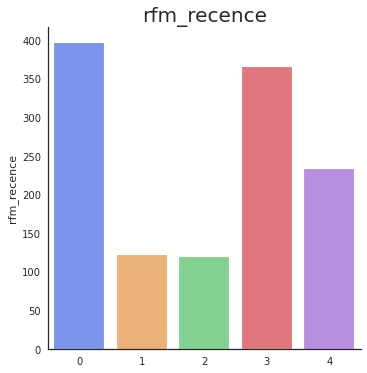

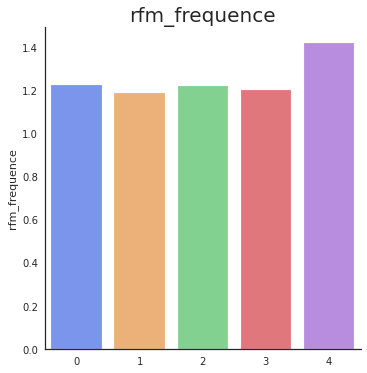

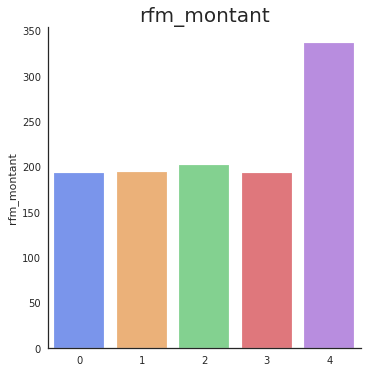

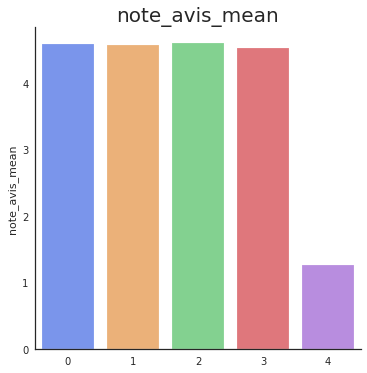

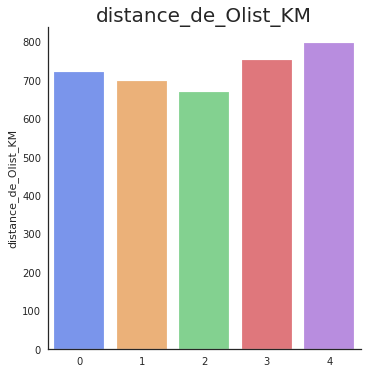

...

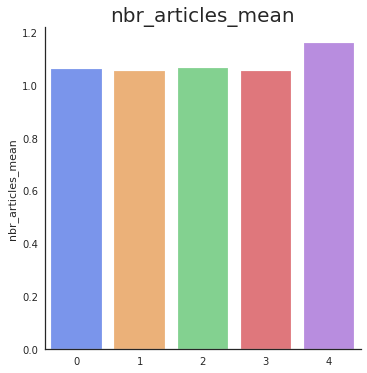

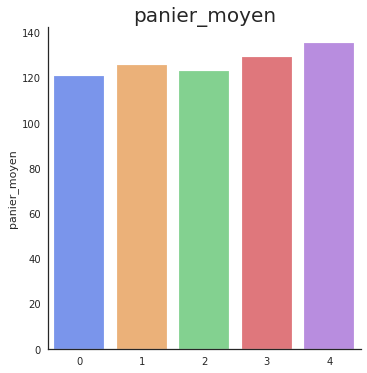

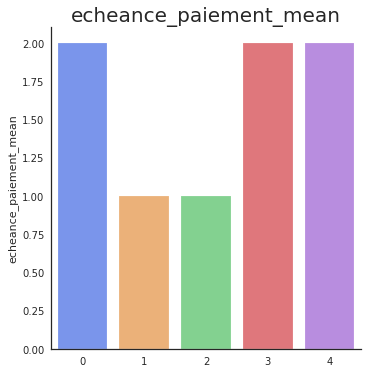

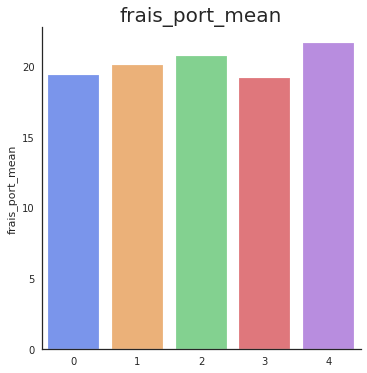

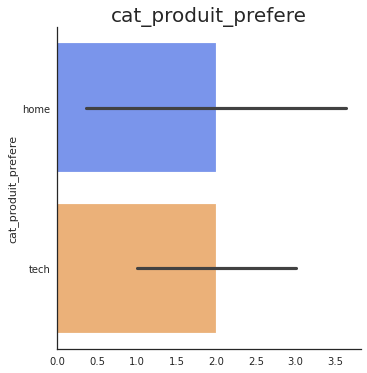

<IPython.core.display.Javascript object>

In [116]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    df_interpret_kproto, "Cluster_Kproto"
)

In [117]:
df_interpret_kproto

,Cluster_Kproto,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
0,0,396.457830,1.227142,193.048198,4.584361,720.758093,2016.993135,8,2.908570,1.062393,120.623822,2.0,19.420227,home
1,1,122.030752,1.188495,193.870722,4.571298,697.485627,2018.000000,4,2.146572,1.051610,125.514006,1.0,20.074042,tech
2,2,119.333400,1.220012,201.938580,4.602881,668.308358,2018.000000,5,2.403687,1.062935,122.923531,1.0,20.750177,home
3,3,364.491321,1.201803,193.253733,4.520768,752.867060,2016.994439,9,2.590411,1.052383,128.981920,2.0,19.209991,tech
4,4,232.438762,1.421548,336.583326,1.258132,796.981305,2017.590712,5,3.899443,1.160432,135.430225,2.0,21.686734,home


<IPython.core.display.Javascript object>

**Catégories de produits préférées par clusters**

In [118]:
df_cat_pref_kproto = data_kproto[["Cluster_Kproto", "cat_produit_prefere"]]

<IPython.core.display.Javascript object>

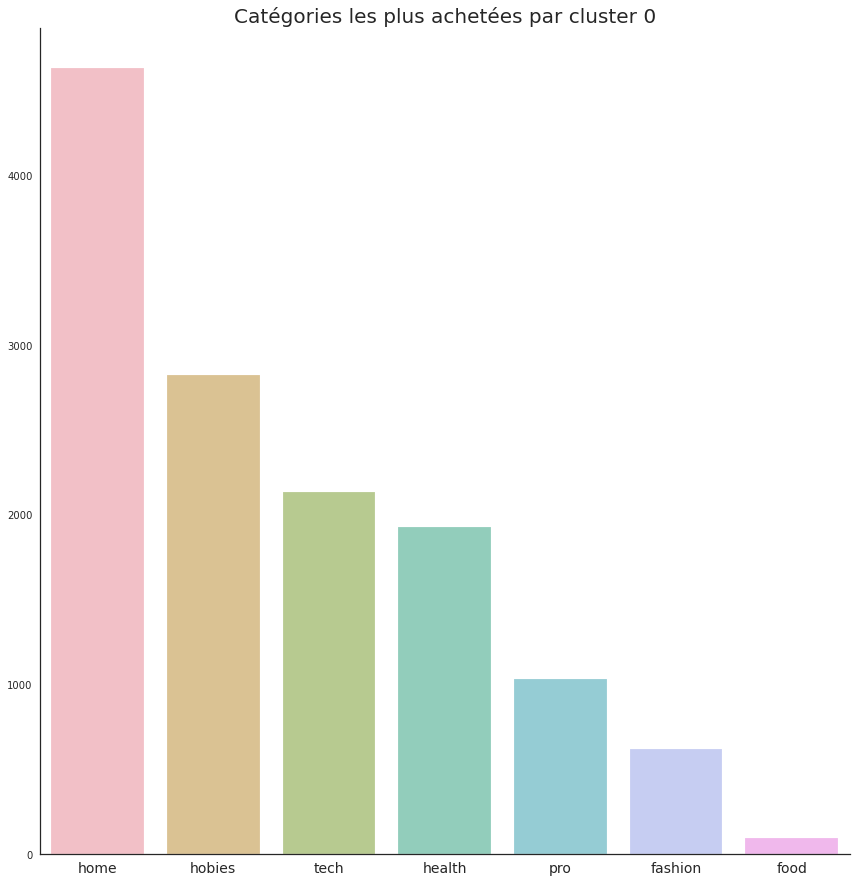

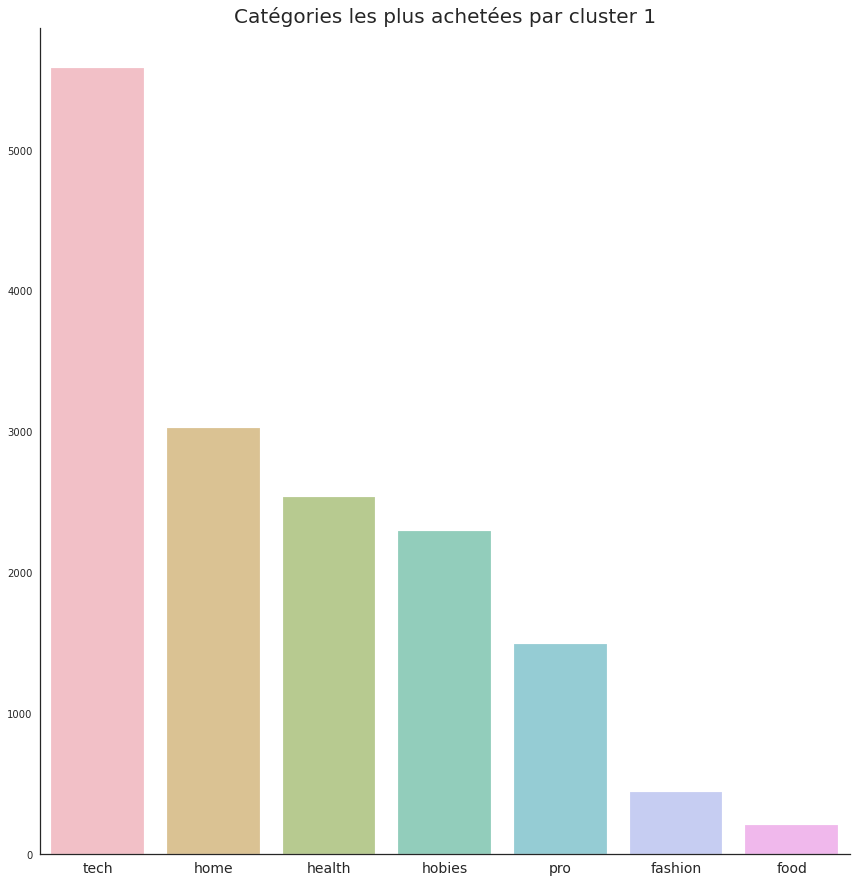

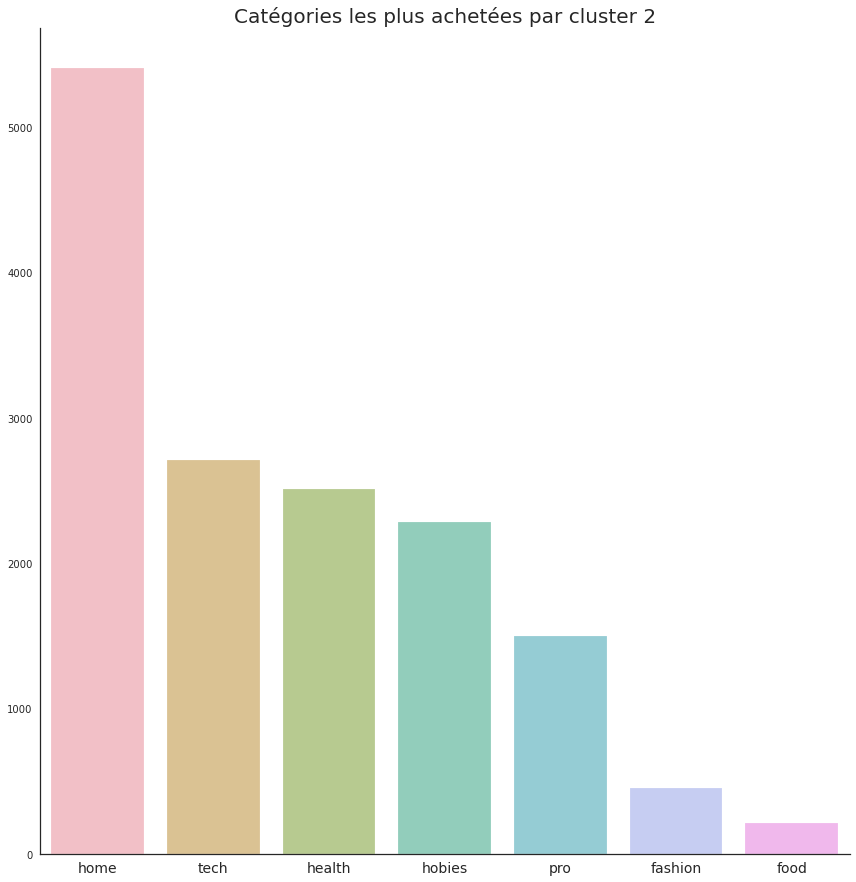

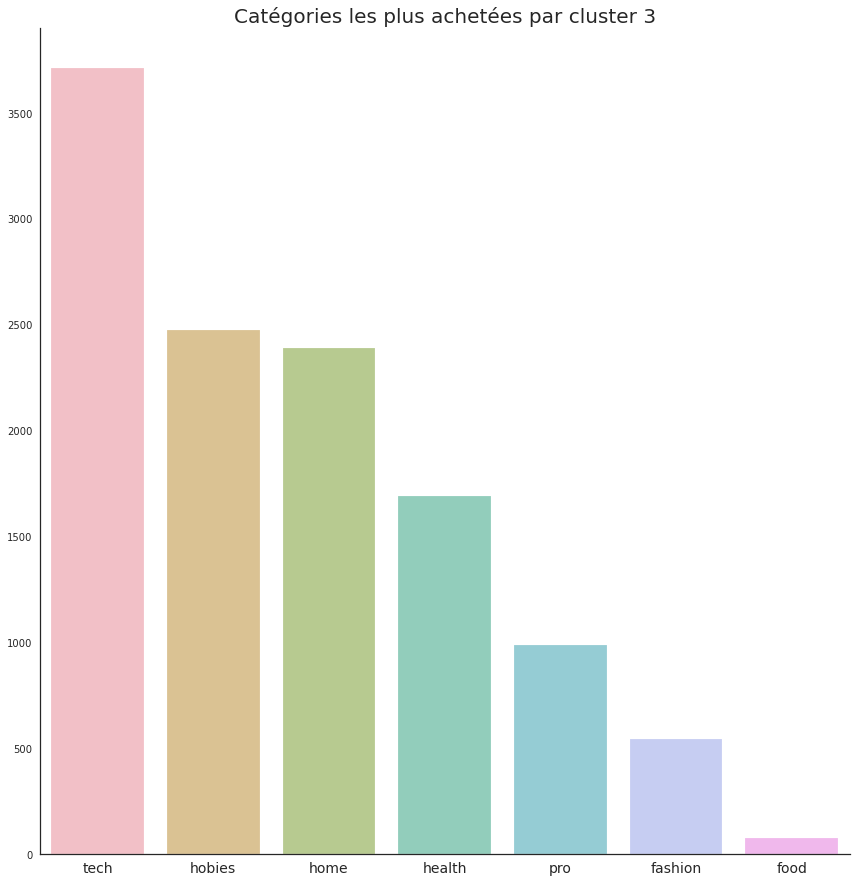

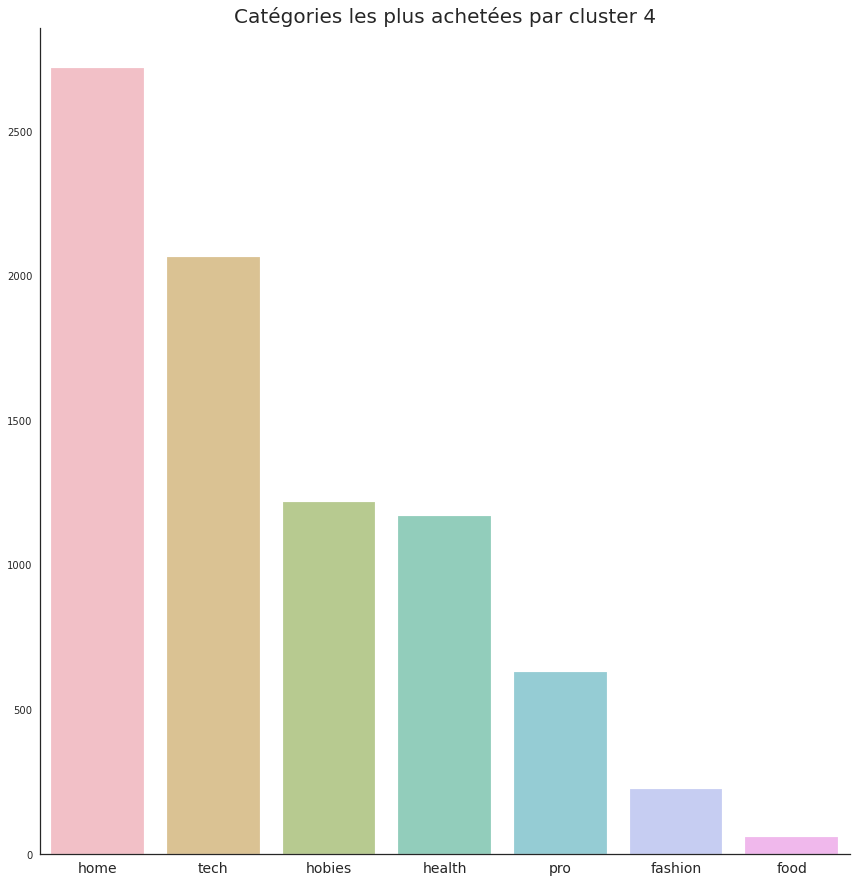

<IPython.core.display.Javascript object>

In [119]:
mpl.rcParams["figure.figsize"] = (8, 7)

# Catégories de produits les plus achetées par cluster
for i in range(0, 5):
    df = (
        df_cat_pref_kproto[df_cat_pref_kproto["Cluster_Kproto"] == i]
        .groupby("cat_produit_prefere")
        .count()
        .sort_values(by="Cluster_Kproto", ascending=False)
    )
    df = df.reset_index()
    g = sns.catplot(
        x=df["cat_produit_prefere"].unique(),
        y=df["Cluster_Kproto"].values,
        data=df,
        ci="sd",
        kind="bar",
        alpha=0.6,
        height=12,
    )
    plt.xticks(fontsize=14)
    plt.title("Catégories les plus achetées par cluster {}".format(i), fontsize=20)
    plt.show()

<font color=#5000A1>- Les deux produits les plus achetés, et ce quelque soit le cluster, sont les produits de catégorie `home` suivi des produits de catégorie `tech`. Les produits les moins achetés sont respectivement les produits `pro`, `fashion` et `food`.<br>

> ###  <font color=#0088B4>Synthèse</font>

- **Cluster 0** : les commandes sont les plus récentes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. ==> **Nouveaux clients**.
- **Cluster 1** : commandes très anciennes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. Le dernier achat remonte à 9 mois ==> **Clients ayant besoin d'une activation**.    
- **Cluster 2** : commandes assez récentes, peu fréquentes et d'un montant relativement élevé. Les avis de ces clients sont très bons. Le dernier achat remonte à 5 mois. Ils paient en une seule fois. ==> **Clients ayant besoin d'attention**.
- **Cluster 3** : commandes assez anciennes, les plus fréquentes et d'un montant le plus élevé. **Les avis de ces clients sont très mauvais**. Le dernier achat remonte à 5 mois. ==> **Clients mécontent et presque perdus**.    
- **Cluster 4** : commandes très anciennes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. Le dernier achat remonte à 8 mois ==> **Clients perdus**. 

> # <font style='color:#DD5E00' id="section_3_3">3.3 Clustering hiérarchique - CAH</font>
>> ## <font style='color:#A7035C'> Agglomerative Clustering</font>

Une hiérarchie de clusters est construite de bas en haut, à chaque itération, le clustering agglomératif connecte la paire de clusters la plus proche (en commençant par les instances individuelles). Comme un arbre avec une branche pour chaque paire de clusters qui ont fusionné où les feuilles sont les instances individuelles. Cette approche s'adapte très bien à un grand nombre d'instances ou de clusters.

La méthode suppose qu'on dispose d'une mesure de dissimilarité entre les individus; dans le cas de points situés dans un espace euclidien, on peut utiliser la distance comme mesure de dissimilarité.<br>

**Hyperparamètres** :
***
- **n_clusters** : int ou None, default=2, le nombre de clusters à trouver.
- **affinity** : str ou callable, par défaut='euclidienne'. Métrique utilisée pour calculer le lien. Peut être "euclidienne", "l1", "l2", "manhattan", "cosinus" ou "précalculée". Si l'hyperparamètres linkage est "ward", seul "euclidien" est accepté.
- **linkage** : {'ward', 'complete', 'average', 'single'}, default='ward', le critère de liaison à utiliser. Ce critère de liaison détermine la distance à utiliser entre les ensembles d'observations. L'algorithme fusionnera les paires de cluster qui minimisent ce critère.
    - 'ward' minimise la variance des clusters fusionnés.
    - 'average' utilise la moyenne des distances de chaque observation des deux ensembles.
    - Le lien 'complet' ou 'maximum' utilise les distances maximales entre toutes les observations des deux ensembles.
    - single' utilise le minimum des distances entre toutes les observations des deux ensembles.

In [120]:
# Impossible de lancer CAH sur tout la dataset à cause de problème
# de mémoire ==> on fait un échantionnage
data_reduced = data_num.sample(frac=fraction_cah, random_state=SEED).copy()
X_reduced = data_reduced.values
X_reduced_features = data_reduced.columns
X_reduced_scaled = scaler.fit_transform(X_reduced)
# Dataframe
data_reduced_scaled = pd.DataFrame(
    X_reduced_scaled, index=data_reduced.index, columns=X_reduced_features
)

<IPython.core.display.Javascript object>

In [121]:
data_reduced.shape

(45612, 15)

<IPython.core.display.Javascript object>

>### <font color=#5000A1>Dendrogramme avec Scipy</font>

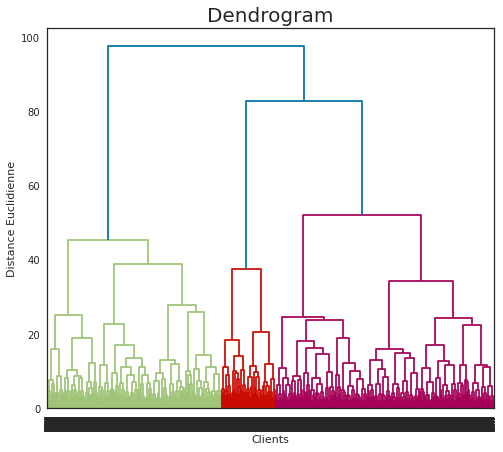

<IPython.core.display.Javascript object>

In [122]:
# let's draw the dendrograms for our data points.
# We will use the scipy.cluster.hierarchy library for that purpose
import scipy.cluster.hierarchy as sch

dendrogram = sch.dendrogram(sch.linkage(X_reduced_scaled, method="ward"))
plt.title("Dendrogram", fontsize=20)
plt.xlabel("Clients")
plt.ylabel("Distance Euclidienne")
plt.show()

>**Le nombre optimal de custers est 5.**

In [123]:
# Instanciation de la class AgglomerativeClustering
# avec le nombre optimal de clusters
cah = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="ward")
# Labels
dendrog_labels = cah.fit_predict(X_reduced_scaled)

<IPython.core.display.Javascript object>

Clusters,Nb_clients,%
0,12712,27.870000
1,12945,28.380000
2,5588,12.250000
3,9273,20.330000
4,5094,11.170000


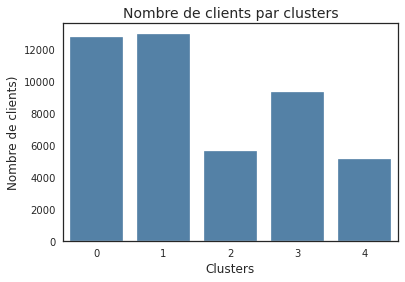

<IPython.core.display.Javascript object>

In [124]:
utilities_segmentation.affiche_clients_par_clusters(dendrog_labels)

In [125]:
# Instanciation t-SNE sur dataframe réduit
tsne_reduced = tsne.fit_transform(X_reduced_scaled)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 45612 samples in 2.581s...
[t-SNE] Computed neighbors for 45612 samples in 25.239s...
[t-SNE] Computed conditional probabilities for sample 1000 / 45612
[t-SNE] Computed conditional probabilities for sample 2000 / 45612
[t-SNE] Computed conditional probabilities for sample 3000 / 45612
[t-SNE] Computed conditional probabilities for sample 4000 / 45612
[t-SNE] Computed conditional probabilities for sample 5000 / 45612
[t-SNE] Computed conditional probabilities for sample 6000 / 45612
[t-SNE] Computed conditional probabilities for sample 7000 / 45612
[t-SNE] Computed conditional probabilities for sample 8000 / 45612
[t-SNE] Computed conditional probabilities for sample 9000 / 45612
[t-SNE] Computed conditional probabilities for sample 10000 / 45612
[t-SNE] Computed conditional probabilities for sample 11000 / 45612
[t-SNE] Computed conditional probabilities for sample 12000 / 45612
[t-SNE] Computed conditional probabilities for s

<IPython.core.display.Javascript object>

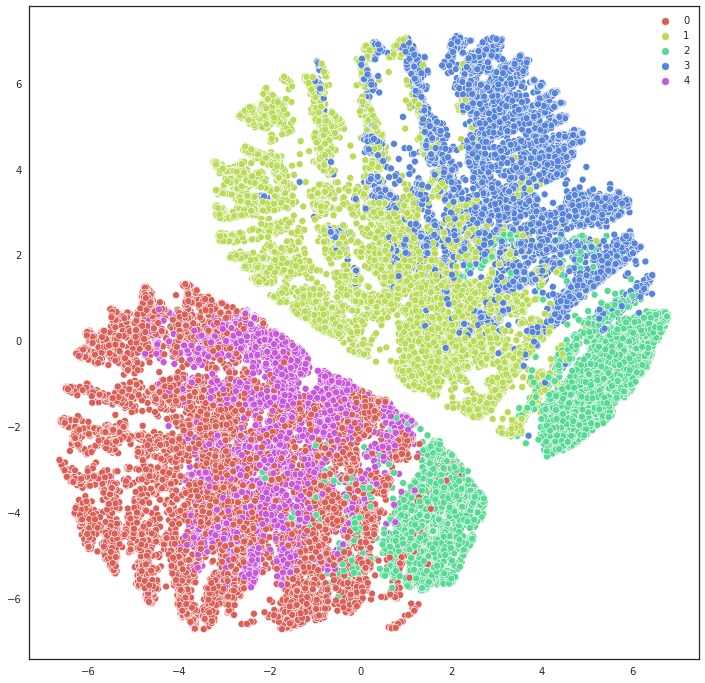

<IPython.core.display.Javascript object>

In [126]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(tsne_reduced, dendrog_labels, 5)

In [127]:
# Projection t-SNE en 2D avec les données quantitatives standardisées
X_reduced_umap = projector_umap.fit_transform(X_reduced_scaled)

<IPython.core.display.Javascript object>

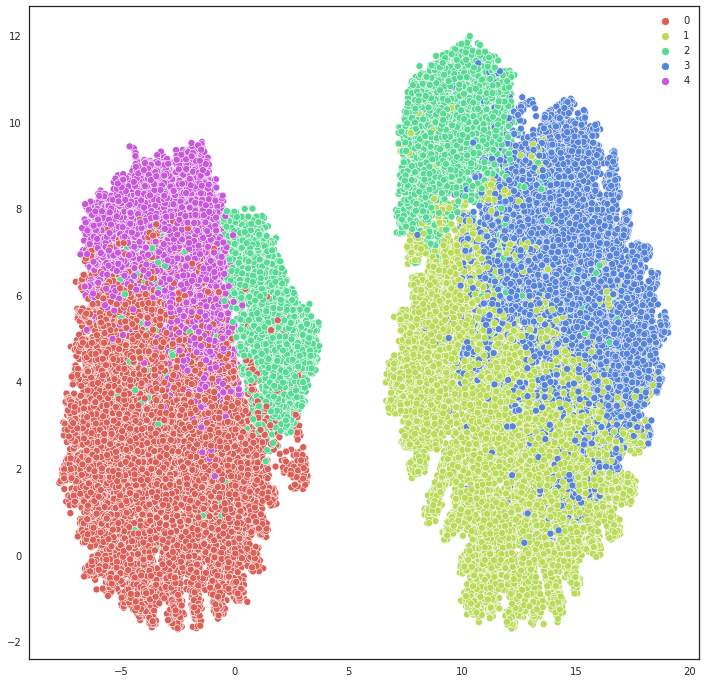

<IPython.core.display.Javascript object>

In [128]:
# Visualisation en 2D avec UMAP
utilities_segmentation.affiche_umap_par_clusters(X_reduced_umap, dendrog_labels, 5)

**Interprétation des clusters**

In [129]:
data_reduced["Dendrog_labels"] = dendrog_labels

<IPython.core.display.Javascript object>

In [130]:
df_interpret_dendrog = data_reduced.groupby("Dendrog_labels").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
    }
)
df_interpret_dendrog.reset_index(inplace=True)
df_interpret_dendrog.head()

,Dendrog_labels,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,336.088656,1.211218,192.864368,4.572290,725.138601,2016.990560,10,2.616189,1.056994,125.001419,2.0,19.282784
1,1,112.012437,1.204867,199.500045,4.598683,687.624023,2018.000000,5,2.249285,1.057982,125.683988,1.0,20.659563
2,2,245.721367,1.413565,339.360111,1.280684,846.390262,2017.550286,5,3.828740,1.156884,133.665734,2.0,21.596087
3,3,132.229699,1.205112,190.020401,4.495798,667.412217,2018.000000,4,2.301305,1.058123,119.134498,1.5,20.082764
4,4,489.299176,1.226737,196.236197,4.539004,740.287948,2017.000000,4,3.297212,1.056151,128.336786,2.0,19.484348


<IPython.core.display.Javascript object>

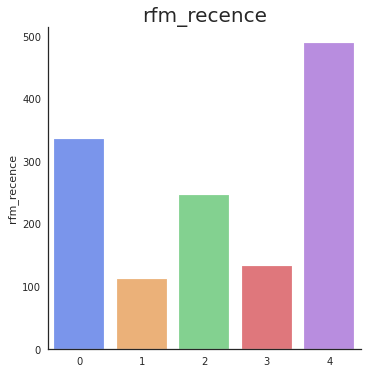

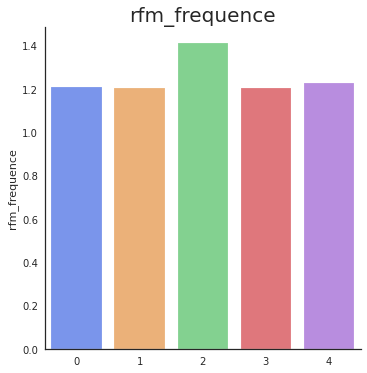

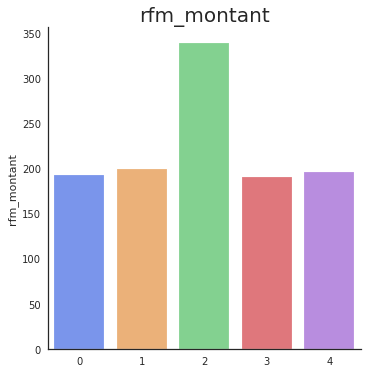

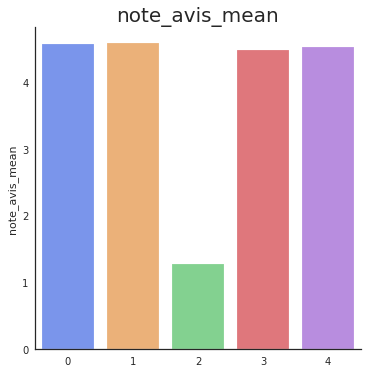

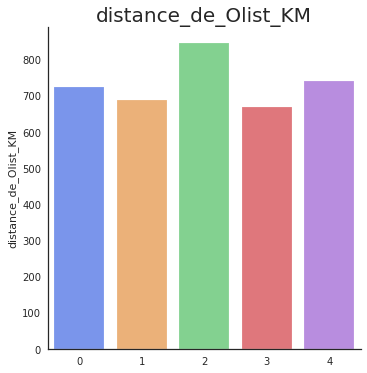

...

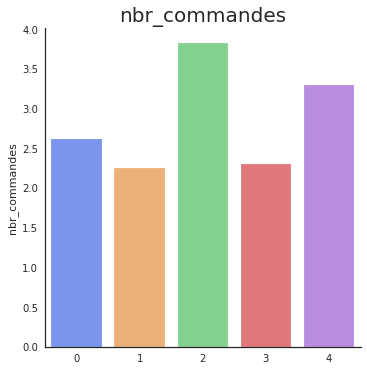

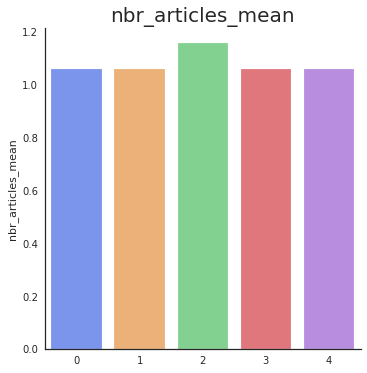

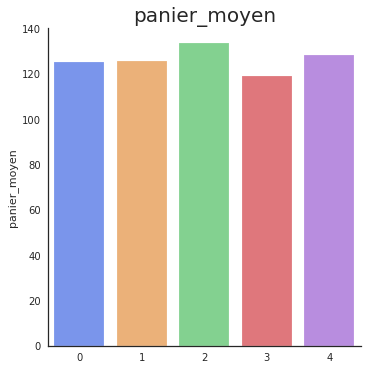

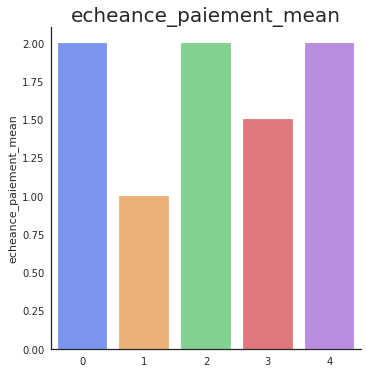

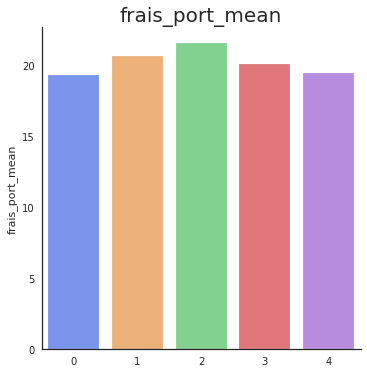

<IPython.core.display.Javascript object>

In [131]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    df_interpret_dendrog, "Dendrog_labels"
)

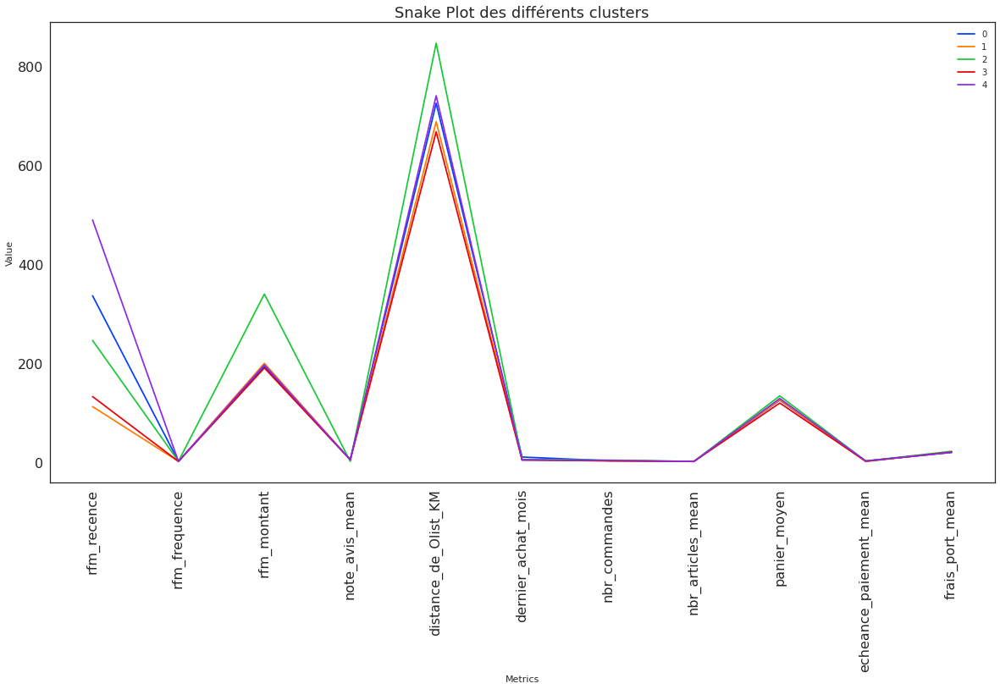

<IPython.core.display.Javascript object>

In [132]:
# Snakeplot de visualisation des différents clusters
utilities_segmentation.affiche_snakeplot_par_clusters(
    df_interpret_dendrog, "Dendrog_labels"
)

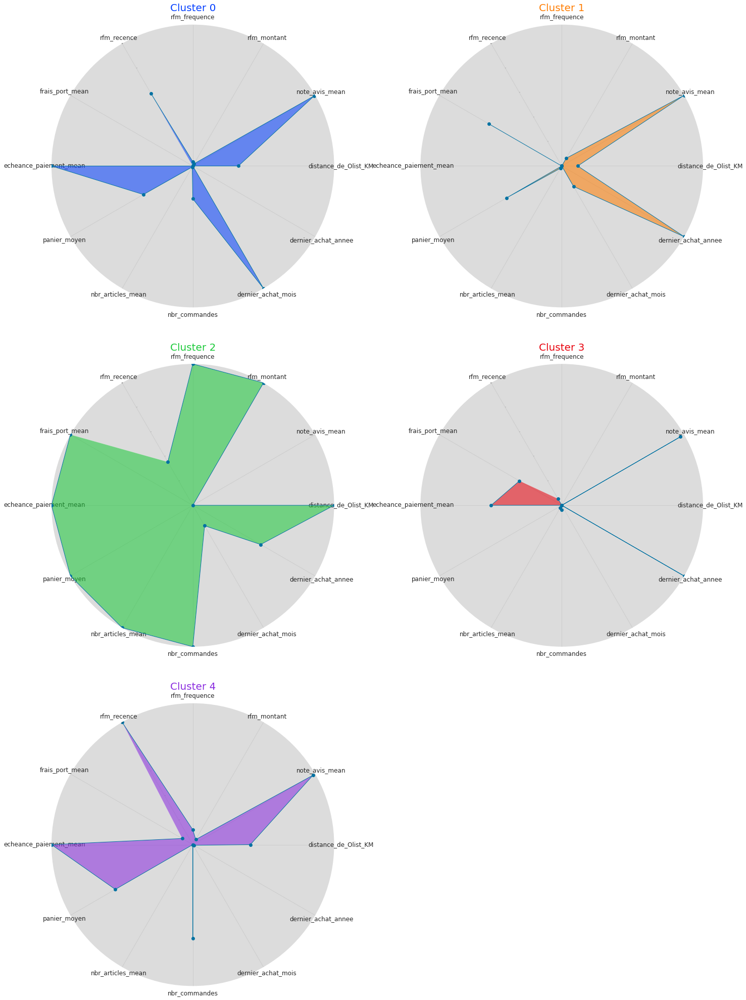

<IPython.core.display.Javascript object>

In [133]:
utilities_segmentation.affiche_radarplot_par_clusters(
    df_interpret_dendrog, "Dendrog_labels", 3, 2
)

In [134]:
df_interpret_dendrog.head()

,Dendrog_labels,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,336.088656,1.211218,192.864368,4.572290,725.138601,2016.990560,10,2.616189,1.056994,125.001419,2.0,19.282784
1,1,112.012437,1.204867,199.500045,4.598683,687.624023,2018.000000,5,2.249285,1.057982,125.683988,1.0,20.659563
2,2,245.721367,1.413565,339.360111,1.280684,846.390262,2017.550286,5,3.828740,1.156884,133.665734,2.0,21.596087
3,3,132.229699,1.205112,190.020401,4.495798,667.412217,2018.000000,4,2.301305,1.058123,119.134498,1.5,20.082764
4,4,489.299176,1.226737,196.236197,4.539004,740.287948,2017.000000,4,3.297212,1.056151,128.336786,2.0,19.484348


<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>

- **Cluster 0** : commandes assez récentes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en une seule fois. Le dernier achat remonte à 4 mois ==> **Clients ayant besoin d'activation**.
- **Cluster 1** : commandes très anciennes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. Le dernier achat remonte à 10 mois ==> **Clients presque perdus**.    
- **Cluster 2** : commandes assez anciennes, assez fréquentes et d'un montant très élevé. Les avis de ces clients sont très mauvais. Le dernier achat remonte à 5 mois. Ils paient en deux fois. ==> **Clients mécontents et perdus**.
- **Cluster 3** : commandes assez récentes, peu fréquentes et d'un montant assez élevé. Les avis de ces clients sont très bons. Le dernier achat remonte à 5 mois. Ils paient en une fois. ==> **Nouveaux clients**.    
- **Cluster 4** : commandes très anciennes, peu fréquentes et d'un montant peu élevé. Les avis de ces clients sont très bons. Ils paient en deux fois. Le dernier achat remonte à 5 mois ==> **Clients perdus**. 

> # <font style='color:#DD5E00' id="section_3_4">3.4 DBSCAN - méthodes de modélisation à base de densité</font>

In [135]:
X_reduced_scaled.shape

(45612, 15)

<IPython.core.display.Javascript object>

In [136]:
# Arbitrage : nombre minimum de points dans le voisinage pour
# former une région dense 2*nombre de variables
minpts = 2 * 15

<IPython.core.display.Javascript object>

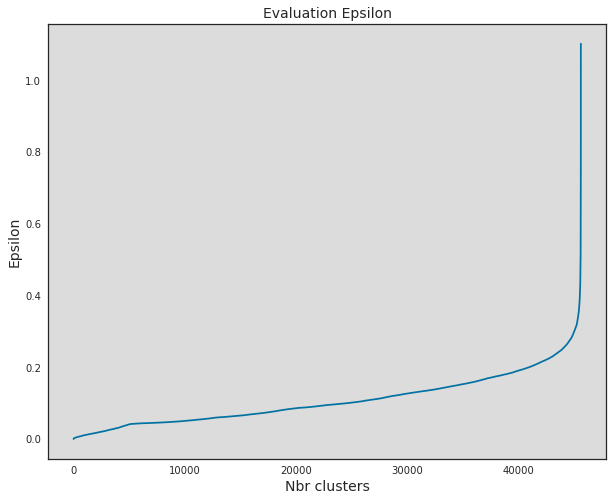

<IPython.core.display.Javascript object>

In [137]:
# Recherche du paramètre epsilon optimal
utilities_segmentation.recherche_epsilon(X_reduced_scaled, minpts)

In [138]:
# Dataframe de sauvegarde des résultats des métriques CAH
df_metrics_dbscan = pd.DataFrame()

<IPython.core.display.Javascript object>

In [139]:
# Tuning hyperparametres eps, min_samples
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées
eps = [0.2, 0.3, 0.4, 0.5]
min_samples = [5, 10, 15, 20, 30, 40]
n_jobs = -1
param_grid_dbscan = [eps, min_samples, n_jobs]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_dbscan = utilities_segmentation.calcul_metrics_dbscan(
    X_reduced_scaled, df_metrics_dbscan, SEED, param_grid_dbscan
)
df_metrics_dbscan.style.hide_index()

eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
0.200000,5,-0.377111,1.278947,128.090438,7.982616
0.200000,10,-0.302964,1.336699,304.055146,6.991935
0.200000,15,-0.339023,1.487425,320.735122,6.999022
0.200000,20,-0.329083,1.577210,431.663611,7.021333
0.200000,30,-0.302088,1.548561,697.491991,7.097037
0.200000,40,-0.213639,1.857739,1035.126806,7.083146
0.300000,5,-0.011930,1.740479,1144.237601,10.862178
0.300000,10,0.155866,2.096153,3196.271192,10.539217
0.300000,15,0.131567,2.066526,3208.891443,10.357699
0.300000,20,0.198120,2.618130,6441.420420,10.567377


<IPython.core.display.Javascript object>

In [140]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_dbscan.sort_values(by="coef_silh", ascending=False).head(8)

,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
17,0.4,40,0.213157,2.832596,6164.831934,9.351327
18,0.5,5,0.207924,2.356750,4118.965379,18.431047
19,0.5,10,0.207506,2.533947,4117.128179,18.677541
20,0.5,15,0.206694,2.793808,4112.904459,12.021378
12,0.4,5,0.205490,2.656867,4117.023769,14.781597
21,0.5,20,0.199302,2.654879,4108.919501,11.961179
9,0.3,20,0.198120,2.618130,6441.420420,10.567377
22,0.5,30,0.196531,2.598663,4107.738709,18.401284


<IPython.core.display.Javascript object>

In [141]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_dbscan.sort_values(by="davies_bouldin").head()

,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
0,0.2,5,-0.377111,1.278947,128.090438,7.982616
1,0.2,10,-0.302964,1.336699,304.055146,6.991935
2,0.2,15,-0.339023,1.487425,320.735122,6.999022
4,0.2,30,-0.302088,1.548561,697.491991,7.097037
3,0.2,20,-0.329083,1.577210,431.663611,7.021333


<IPython.core.display.Javascript object>

In [142]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_dbscan.sort_values(by="calinski_harabasz", ascending=False).head(8)

,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
10,0.3,30,0.193386,2.680982,6460.566315,18.011891
11,0.3,40,0.188053,2.724311,6446.985700,6.683415
9,0.3,20,0.198120,2.618130,6441.420420,10.567377
17,0.4,40,0.213157,2.832596,6164.831934,9.351327
16,0.4,30,0.182976,2.327370,4137.197383,15.442678
15,0.4,20,0.189251,2.433863,4121.245956,14.644954
18,0.5,5,0.207924,2.356750,4118.965379,18.431047
19,0.5,10,0.207506,2.533947,4117.128179,18.677541


<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>

- Silhouette : eps=0.5, min_samples=5.
- Davies-Bouldin : eps=0.2, min_samples=5.
- Calinski-Harabsz : eps=0.3, min_samples=40.

On utilisera Les hyperparamètres :
- eps : 0.5.
- min_samples : 5.
Ce couple d'hyperparamètres a la deuxième meilleure performance dans le cas du critère de `Silhouete score` et de `Calinski Bouldin` 

>### <font color=#5000A1>**DBSCAN avec les meilleurs paramètres**</font>

In [143]:
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=0.5, min_samples=5, n_jobs=-1)
# Entraînement du modèle
dbscan.fit(X_reduced_scaled)
dbscan_labels = dbscan.labels_

<IPython.core.display.Javascript object>

Clusters,Nb_clients,%
-1,26,0.060000
0,20185,44.250000
1,25282,55.430000
2,119,0.260000


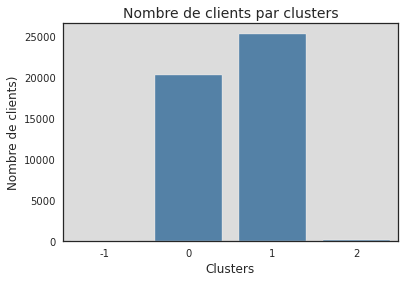

<IPython.core.display.Javascript object>

In [144]:
utilities_segmentation.affiche_clients_par_clusters(dbscan_labels)

> ###  <font color=#0088B4>Synthèse</font>

- DBSCAN parvient à segmenter les clients en 2 groupes principaux. Le groupe ayant le label -1 est considéré comme des anomalies.

In [145]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_dbscan = data_reduced.copy()
data_dbscan["Cluster_eps_05"] = dbscan.labels_

<IPython.core.display.Javascript object>

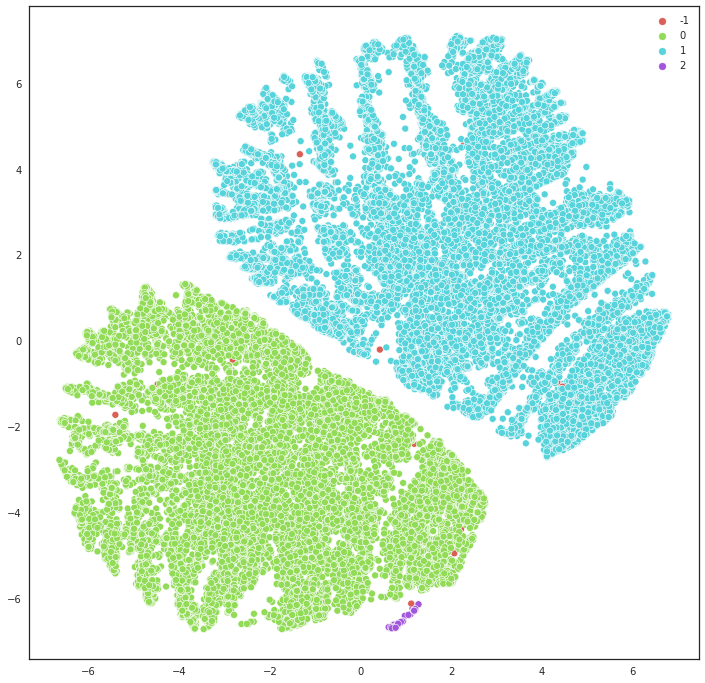

<IPython.core.display.Javascript object>

In [146]:
# Visualisation en 2D avec t-SNE
utilities_segmentation.affiche_tsne_par_clusters(tsne_reduced, dbscan_labels, 4)

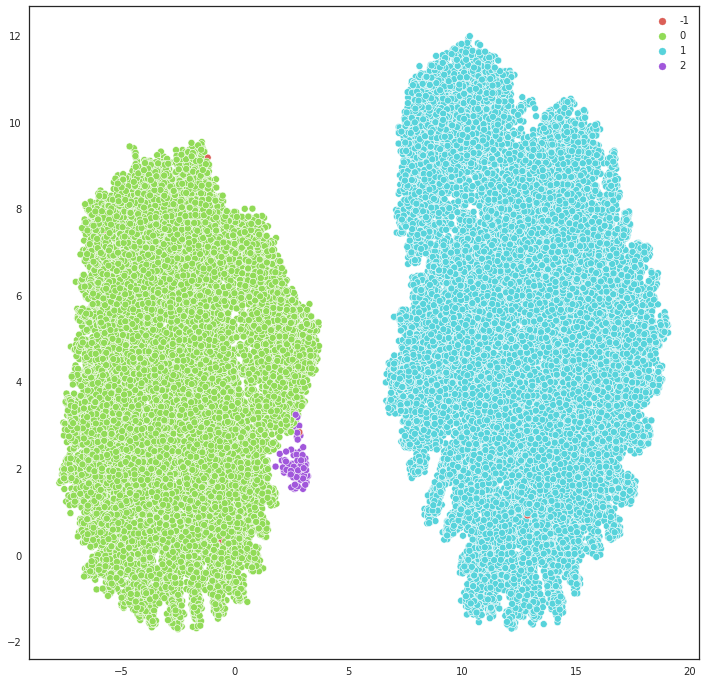

<IPython.core.display.Javascript object>

In [147]:
# Visualisation en 2D avec UMAP
utilities_segmentation.affiche_umap_par_clusters(X_reduced_umap, dbscan_labels, 4)

**Interprétation des clusters**

In [148]:
df_interpret_dbscan = data_dbscan.groupby("Cluster_eps_05").agg(
    {
        "rfm_recence": "mean",
        "rfm_frequence": "mean",
        "rfm_montant": "mean",
        "note_avis_mean": "mean",
        "distance_de_Olist_KM": "mean",
        "dernier_achat_annee": "mean",
        "dernier_achat_mois": "median",
        "nbr_commandes": "mean",
        "nbr_articles_mean": "mean",
        "panier_moyen": "mean",
        "echeance_paiement_mean": "median",
        "frais_port_mean": "mean",
    }
)
df_interpret_dbscan.reset_index(inplace=True)
df_interpret_dbscan.head()

,Cluster_eps_05,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,287.307692,7.615385,8974.399231,3.141758,1228.602204,2017.384615,7,348.192308,2.257033,1222.248999,9.0,151.447960
1,0,377.779787,1.230964,201.817398,4.170253,747.792998,2017.000000,9,2.519594,1.065908,126.013833,2.0,19.524050
2,1,122.569733,1.231271,211.874335,4.148617,695.685408,2018.000000,4,2.441460,1.071453,123.705614,1.0,20.501895
3,2,691.966387,1.201681,240.546975,4.008403,792.942385,2016.000000,10,2.260504,1.060924,155.547500,3.0,19.839937


<IPython.core.display.Javascript object>

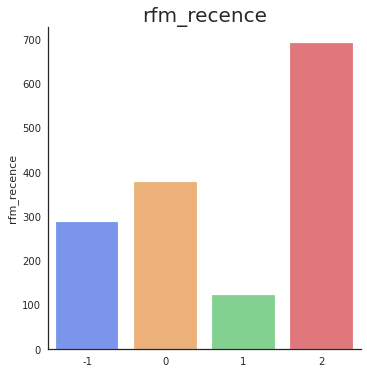

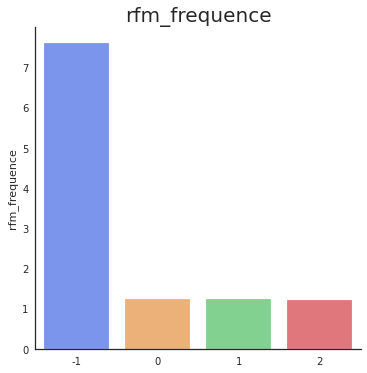

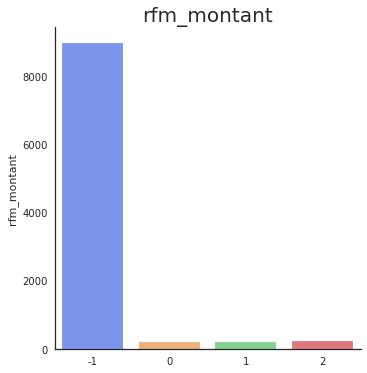

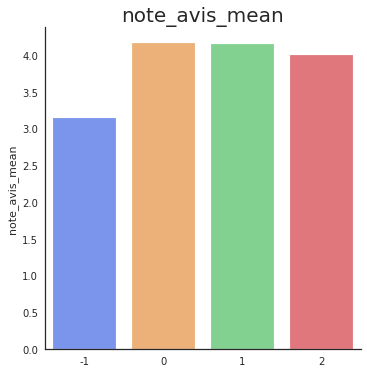

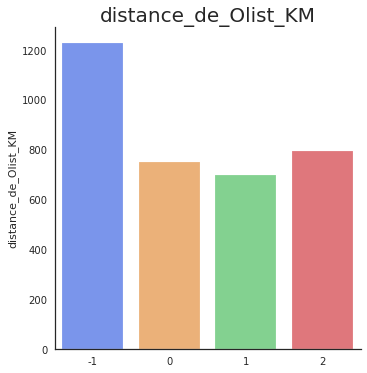

...

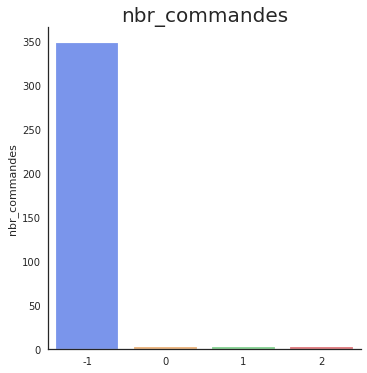

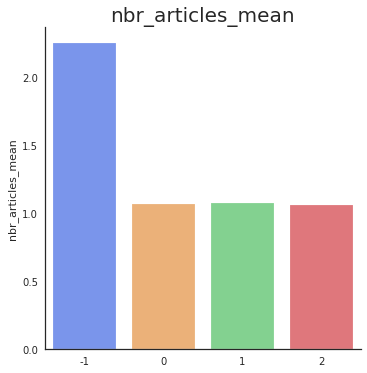

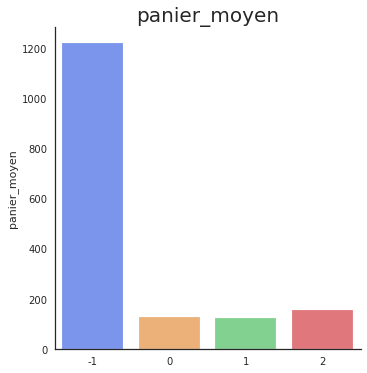

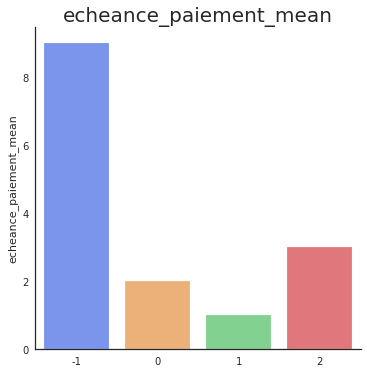

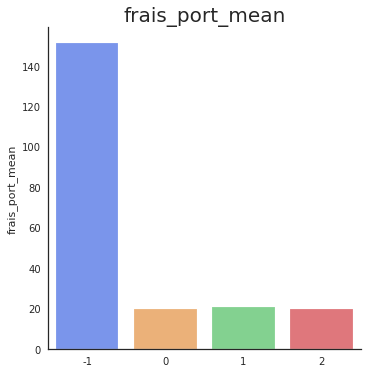

<IPython.core.display.Javascript object>

In [149]:
# Visualisation des moyennes des variables par clusters
utilities_segmentation.affiche_variables_par_clusters(
    df_interpret_dbscan, "Cluster_eps_05"
)

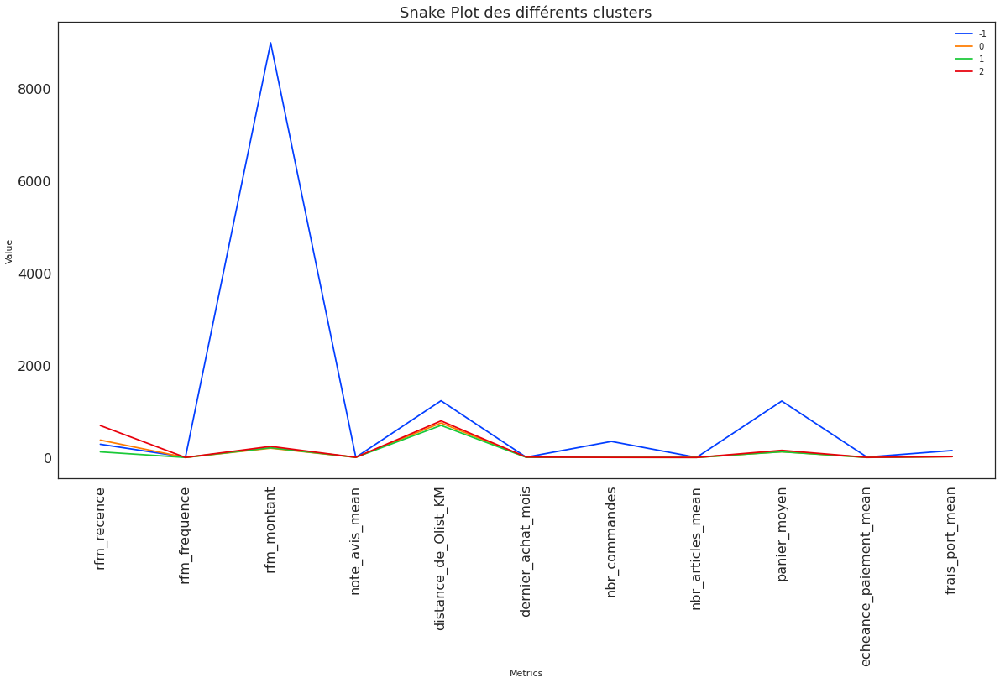

<IPython.core.display.Javascript object>

In [150]:
# Snakeplot de visualisation des différents clusters
utilities_segmentation.affiche_snakeplot_par_clusters(
    df_interpret_dbscan, "Cluster_eps_05"
)

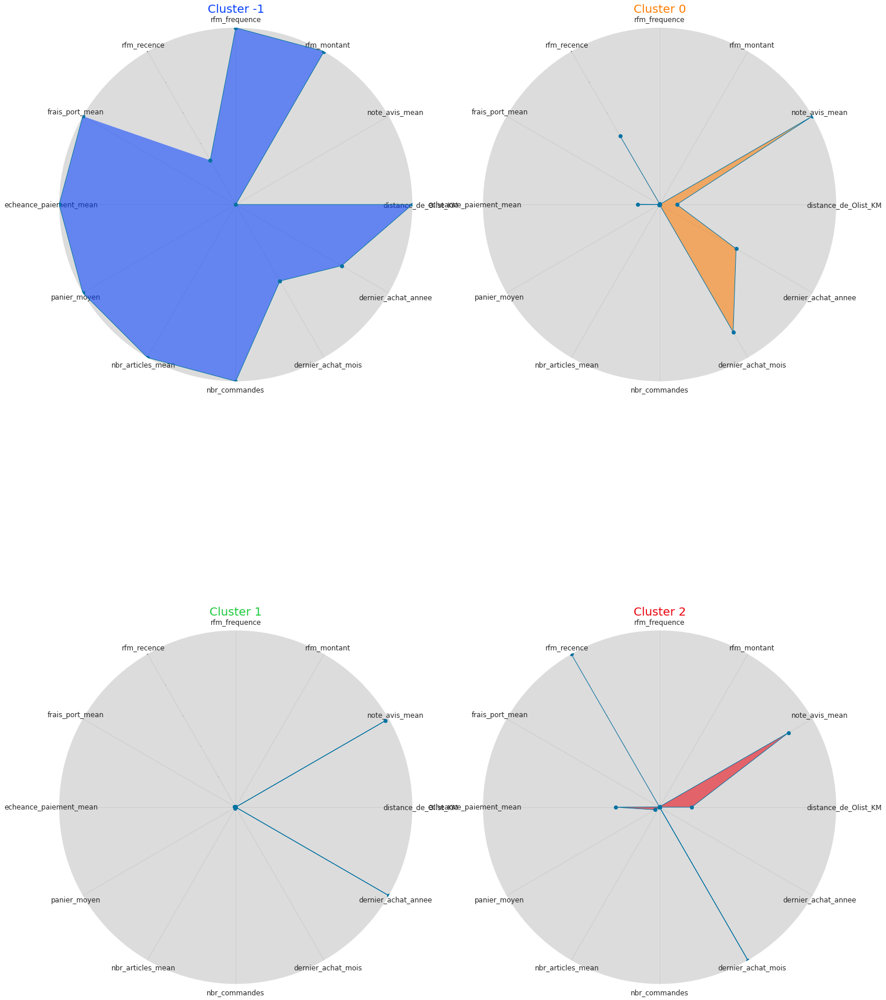

<IPython.core.display.Javascript object>

In [151]:
utilities_segmentation.affiche_radarplot_par_clusters(
    df_interpret_dbscan, "Cluster_eps_05", 2, 2
)

In [152]:
df_interpret_dbscan.head()

,Cluster_eps_05,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,distance_de_Olist_KM,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,287.307692,7.615385,8974.399231,3.141758,1228.602204,2017.384615,7,348.192308,2.257033,1222.248999,9.0,151.447960
1,0,377.779787,1.230964,201.817398,4.170253,747.792998,2017.000000,9,2.519594,1.065908,126.013833,2.0,19.524050
2,1,122.569733,1.231271,211.874335,4.148617,695.685408,2018.000000,4,2.441460,1.071453,123.705614,1.0,20.501895
3,2,691.966387,1.201681,240.546975,4.008403,792.942385,2016.000000,10,2.260504,1.060924,155.547500,3.0,19.839937


<IPython.core.display.Javascript object>

> ###  <font color=#0088B4>Synthèse</font>
- **Cluster -1** : commandes assez anciennes, très fréquentes et d'un montant très très élévé. Ils paient en 8 fois et se trouvent très loin du siège de Olist ==> **Clients atypiques**.
- **Cluster 0** :  commandes très anciennes, peu fréquentes et d'un montant peu élevé. Ils paient en 2 fois ==> **Clients ayNouveaux clients**.
- **Cluster 1** : commandes assez anciennes, peu fréquentes et d'un montant moyen. Ils paient en une fois ==> **Clients presque perdus**.
- **Cluster 2** : commandes très très anciennes, peu fréquentes et d'un montant élévé. Ils paient en 3 fois ==> **Clients perdus**.

# <font style='color:blue' id="section_4">4. Comparaison des performances</font>

In [153]:
data_kprototype.shape

(63856, 16)

<IPython.core.display.Javascript object>

In [154]:
# Préparation des jeux de données réduits à partir de data_acp
data_compar_acp = data_acp.sample(40000, random_state=SEED).copy()

<IPython.core.display.Javascript object>

In [155]:
# ACP avec 5 composantes
n_comp = 5
pca = PCA(n_components=n_comp, random_state=SEED)
pca.fit(data_compar_acp)
X_projected_acp_compar = pca.transform(data_compar_acp)

<IPython.core.display.Javascript object>

In [156]:
# Réduction du jeu de données à 40000 clients
# Préparation des jeux de données réduits à partir de X_reduced_scaled
data_compar = data_reduced.sample(40000, random_state=SEED).copy()
X_compar = data_compar.values
X_compar_scaled = scaler.fit_transform(X_compar)

# Préparation des jeux de données réduits à partir de extended_data
data_compar_cat = data_scaled_extended.sample(40000, random_state=SEED).copy()
X_compar_cat = data_compar_cat.values

# Préparation des jeux de données réduits à partir de data_kprot
data_compar_kproto = data_kprototype.sample(40000, random_state=SEED).copy()
X_compar_kproto = data_compar_kproto.values
X_compar_kproto_num = data_compar_kproto.drop(["cat_produit_prefere"], axis=1)

<IPython.core.display.Javascript object>

In [157]:
# Dataframe de comparaisons des performances des algorithmes
df_resultats_compar = pd.DataFrame()

<IPython.core.display.Javascript object>

In [158]:
Y.shape

(91223, 22)

<IPython.core.display.Javascript object>

> # <font style='color:#DD5E00' id="section_4_1">4.1 Kmeans</font>

In [159]:
# Variables quantitatives standardisées
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans = KMeans(n_clusters=5, init="k-means++").fit_predict(X_compar_scaled)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "K-Means", X_compar_scaled, kmeans, df_resultats_compar, time_execution
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169


<IPython.core.display.Javascript object>

In [160]:
# Variables quantitatives standardisées + variables qualitatives
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_cat = KMeans(n_clusters=5, init="k-means++").fit_predict(X_compar_cat)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "K-Means_cat", X_compar_cat, kmeans_cat, df_resultats_compar, time_execution
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169
K-Means_cat,5,0.391020,1.407769,11595.981231,1.183458


<IPython.core.display.Javascript object>

In [161]:
# Variables quantitatives standardisées
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_acp = KMeans(n_clusters=5, init="k-means++").fit_predict(X_projected_acp_compar)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "K-Means_acp",
    X_projected_acp_compar,
    kmeans_acp,
    df_resultats_compar,
    time_execution,
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169
K-Means_cat,5,0.391020,1.407769,11595.981231,1.183458
K-Means_acp,5,0.238077,1.496506,11361.902820,1.246186


<IPython.core.display.Javascript object>

In [162]:
X_projected_acp_compar.shape

(40000, 5)

<IPython.core.display.Javascript object>

> # <font style='color:#DD5E00' id="section_4_2">4.2 K-Prototype</font>

In [163]:
# Instanciation du modèle de clustering
# Top début d'exécution
time_start = time.time()
kproto = KPrototypes(n_clusters=5, init="Cao", n_jobs=-1).fit_predict(
    X_compar_kproto, categorical=cols_categorical
)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "K-Proto", X_compar_kproto_num, kproto, df_resultats_compar, time_execution
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169
K-Means_cat,5,0.391020,1.407769,11595.981231,1.183458
K-Means_acp,5,0.238077,1.496506,11361.902820,1.246186
K-Proto,5,0.165104,1.863411,7357.449492,86.526731


<IPython.core.display.Javascript object>

> # <font style='color:#DD5E00' id="section_4_3">4.3 Agglomerative Clustering</font>

In [164]:
# Variables quantitatives standardisées
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# cas 5 clusters
# Instanciation de cah avec les meilleurs paramètres
cah_5 = AgglomerativeClustering(
    n_clusters=5, linkage="ward", affinity="euclidean"
).fit_predict(X_compar_scaled)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "CAH-5", X_compar_scaled, cah_5, df_resultats_compar, time_execution
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169
K-Means_cat,5,0.391020,1.407769,11595.981231,1.183458
K-Means_acp,5,0.238077,1.496506,11361.902820,1.246186
K-Proto,5,0.165104,1.863411,7357.449492,86.526731
CAH-5,5,0.262963,1.394142,9907.741580,95.192281


<IPython.core.display.Javascript object>

> # <font style='color:#DD5E00' id="section_4_4">4.4 DBSCAN</font>

In [165]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=0.5, min_samples=5, n_jobs=-1).fit_predict(X_compar_scaled)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_compar = utilities_segmentation.calcul_comp_clustering(
    "Dbscan", X_compar_scaled, dbscan, df_resultats_compar, time_execution
)
df_resultats_compar.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means,5,0.265124,1.376846,10060.691576,1.261169
K-Means_cat,5,0.391020,1.407769,11595.981231,1.183458
K-Means_acp,5,0.238077,1.496506,11361.902820,1.246186
K-Proto,5,0.165104,1.863411,7357.449492,86.526731
CAH-5,5,0.262963,1.394142,9907.741580,95.192281
Dbscan,6,0.224012,2.092997,4860.235475,40.589097


<IPython.core.display.Javascript object>

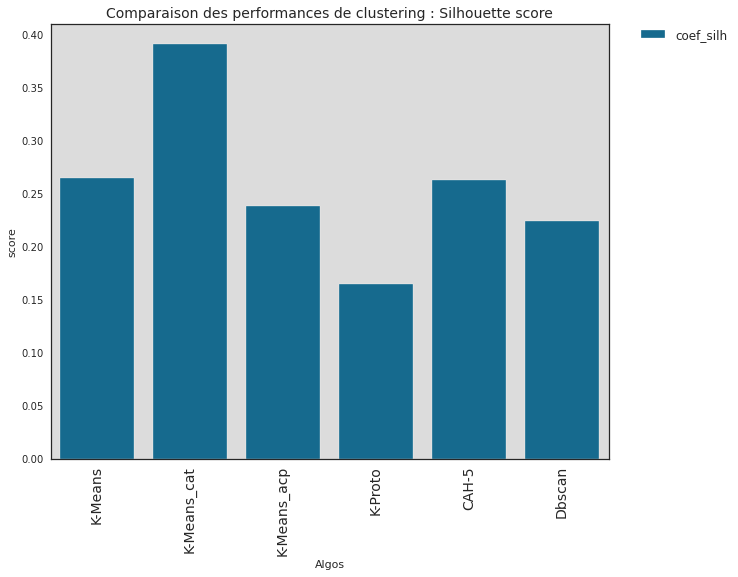

<IPython.core.display.Javascript object>

In [166]:
# Visualisation du score de silhouette
# ---------------------------------------------------------------------
# Comparaison visuelle des 4 algorithmes
comparaison_perf_melt = pd.melt(
    df_resultats_compar, id_vars=["Algos"], value_name="score", value_vars=["coef_silh"]
)
# Visualisation
plt.figure(figsize=(10, 8))
sns.barplot(
    x=comparaison_perf_melt["Algos"],
    y=comparaison_perf_melt["score"],
    hue=comparaison_perf_melt["variable"],
)
plt.title("Comparaison des performances de clustering : Silhouette score", fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0, fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Le **score de silhouette** mesure la différence entre la distance quadratique moyenne intra-groupe et celle du groupe le plus proche (à maximiser).
- les scores de silhouette les plus élevés, sur l'ensemble des données, sont assez identiques pour les algorithmes **K-Mean et CAH**. Le score le plus faible est celui du de l'algorithme **K-prototype**

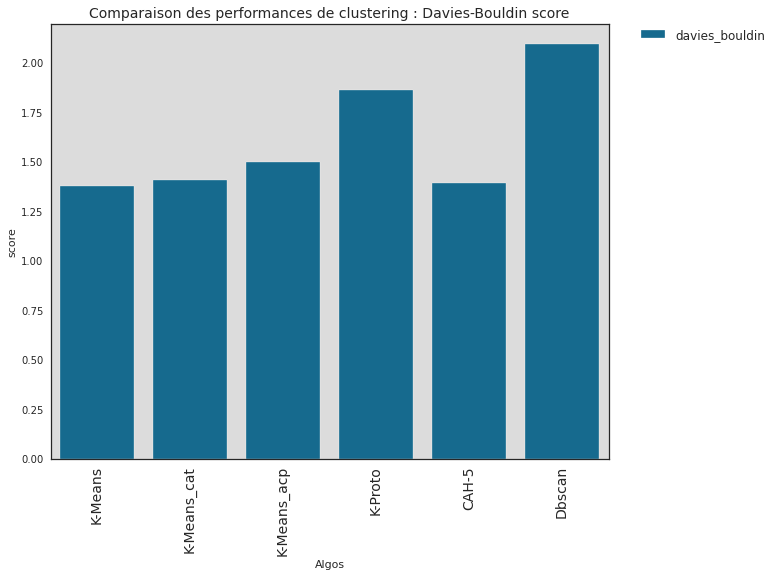

<IPython.core.display.Javascript object>

In [167]:
# Visualisation de l'indice Davies-Bouldin
# ---------------------------------------------------------------------
# Comparaison visuelle des 4 algorithmes
comparaison_perf_melt = pd.melt(
    df_resultats_compar,
    id_vars=["Algos"],
    value_name="score",
    value_vars=["davies_bouldin"],
)
# Visualisation
plt.figure(figsize=(10, 8))
sns.barplot(
    x=comparaison_perf_melt["Algos"],
    y=comparaison_perf_melt["score"],
    hue=comparaison_perf_melt["variable"],
)
plt.title(
    "Comparaison des performances de clustering : Davies-Bouldin score", fontsize=14
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0, fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Le **Score de Davies-Bouldin** mesure le rapport maximal de la dispersion des paires de clusters par rapport à leur distance (à minimiser).
- les scores de Davies-Bouldin, les plus bas possibles, sur l'ensemble des données, sont assez identiques pour les algorithmes **K-Means et CAH**.

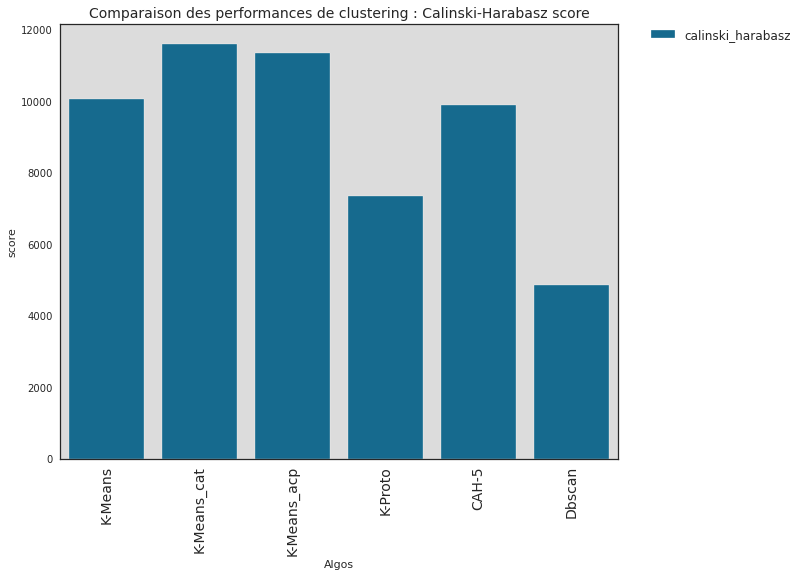

<IPython.core.display.Javascript object>

In [168]:
# Visualisation de l'indice Calinski Harabasz
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(
    df_resultats_compar,
    id_vars=["Algos"],
    value_name="score",
    value_vars=["calinski_harabasz"],
)
# Visualisation
plt.figure(figsize=(10, 8))
sns.barplot(
    x=comparaison_perf_melt["Algos"],
    y=comparaison_perf_melt["score"],
    hue=comparaison_perf_melt["variable"],
)
plt.title(
    "Comparaison des performances de clustering : Calinski-Harabasz score", fontsize=14
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0, fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Le **Score de Calinski-Harabasz** est le rapport entre la dispersion inter-clusters et la dispersion intra-clusters (à maximiser).
- les scores de Calinski-Harabasz, les plus élevés, sont favorables pour les algorithmes **K-Means et CAH**, et défavorables pour **DBSCAN**.

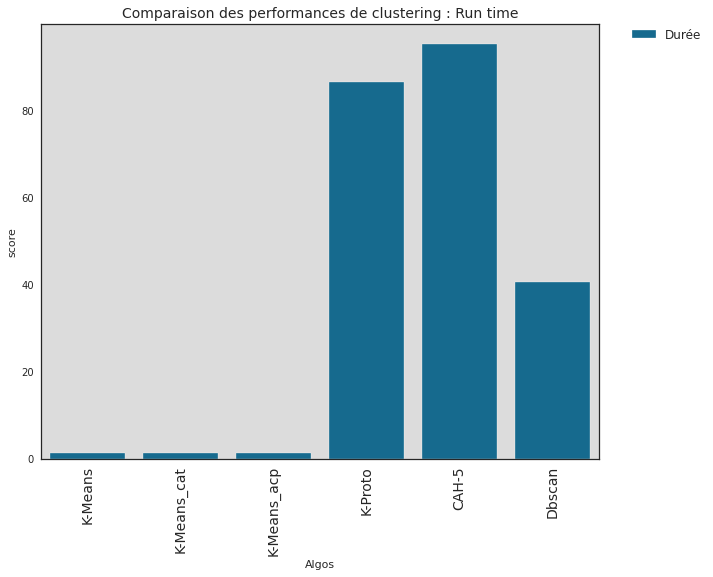

<IPython.core.display.Javascript object>

In [169]:
# Visualisation de la durée entraînement + prédiction
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(
    df_resultats_compar, id_vars=["Algos"], value_name="score", value_vars=["Durée"]
)
# Visualisation
plt.figure(figsize=(10, 8))
sns.barplot(
    x=comparaison_perf_melt["Algos"],
    y=comparaison_perf_melt["score"],
    hue=comparaison_perf_melt["variable"],
)
plt.title("Comparaison des performances de clustering : Run time", fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0, fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Les algorithmes les plus rapides sont **K-Means** et **DBSCAN**. Le plus long étant **K-Prototype**.

# <font style='color:blue' id="section_5">5. Stabilité d'initialisation de la partition</font>

Calcul des métriques pour évaluer la stabilité d'initialisation.

In [170]:
# Dataframe de sauvegarde des scores ARI de stabilité d'initialisation
df_stabilite_init = pd.DataFrame()

<IPython.core.display.Javascript object>

In [171]:
model = KMeans(n_clusters=5, init="k-means++", random_state=SEED)
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_initialisation(
    "K-Means-5", model, X, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000


<IPython.core.display.Javascript object>

In [172]:
model = KMeans(n_clusters=5, init="k-means++", random_state=SEED)
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_initialisation(
    "K-Means-5_cat", model, Y, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000
K-Means-5_cat,1.000000,0.000000


<IPython.core.display.Javascript object>

In [173]:
model = KMeans(n_clusters=5, init="k-means++", random_state=SEED)
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_initialisation(
    "K-Means_acp", model, X_projected_acp, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000
K-Means-5_cat,1.000000,0.000000
K-Means_acp,1.000000,0.000000


<IPython.core.display.Javascript object>

In [174]:
model = KPrototypes(n_clusters=5, init="Cao", n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_init_kproto(
    "K-Proto-5", model, cols_categorical, data_kprototype, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Evaluation of stability upon random initialization:        84.1%  ± 15.3% 


Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000
K-Means-5_cat,1.000000,0.000000
K-Means_acp,1.000000,0.000000
K-Proto-5,0.840980,0.152705


<IPython.core.display.Javascript object>

In [175]:
model = AgglomerativeClustering(n_clusters=5, linkage="single", affinity="euclidean")
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_initialisation(
    "CAH-5", model, X_reduced_scaled, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000
K-Means-5_cat,1.000000,0.000000
K-Means_acp,1.000000,0.000000
K-Proto-5,0.840980,0.152705
CAH-5,1.000000,0.000000


<IPython.core.display.Javascript object>

In [176]:
model = DBSCAN(eps=0.5, min_samples=5, n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = utilities_segmentation.calcul_stabilite_initialisation(
    "DBSCAN-1", model, X_reduced_scaled, df_stabilite_init
)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-5,1.000000,0.000000
K-Means-5_cat,1.000000,0.000000
K-Means_acp,1.000000,0.000000
K-Proto-5,0.840980,0.152705
CAH-5,1.000000,0.000000
DBSCAN-1,1.000000,0.000000


<IPython.core.display.Javascript object>

<Figure size 864x576 with 0 Axes>

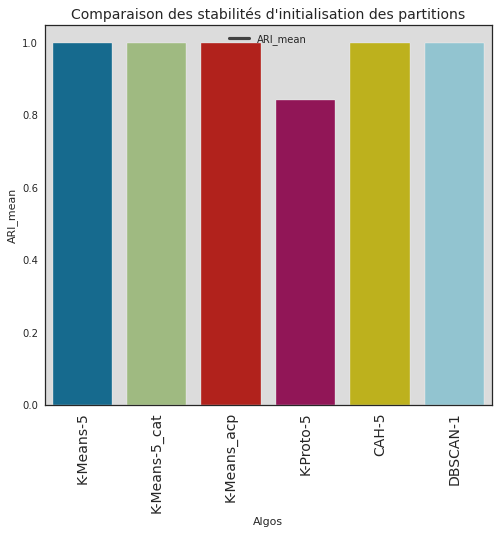

<IPython.core.display.Javascript object>

In [177]:
# Visualisation de la durée entraînement + prédiction
# ---------------------------------------------------------------------
# Comparaison visuelle des 4 algorithmes

# Visualisation
plt.figure(figsize=(12, 8))
fig, ax = plt.subplots()
ax = sns.barplot(x=df_stabilite_init["Algos"], y=df_stabilite_init["ARI_mean"])

plt.title("Comparaison des stabilités d'initialisation des partitions", fontsize=14)
ax.legend(labels=["ARI_mean"])
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Pour les 4 algorithmes testés, la stabilité d'initialisation (proche de 1) est favorable à **K-Means, clustering hiérarchique et DBSCAN** et défavorable à **K-prototype**.

> ###  <font color=#0088B4>Synthèse</font>

- Les 2 algorithmes les plus performants en terme des scores de Silouhette et de Calinski-Harabasz sont **K-Means** et **CAH** pour le cas des variables quantitatives.